<div class="alert alert-success" style="background-color: rgb(92, 102, 108); color: white;">
    <center><h1>Data Mining Final Project</h1></center><br>
    <center>2023/2024</center>
</div>



### Group number 72 - Registration

|      |     Student Name     |     Student ID     | 
|---   |         ---          |           ---          |
| 1    |          Adriana Costinha | 20230567              | 
| 2    |      Alícia Pinho Santos  | 20230525          | 
| 3    |      Mariana Cabral  |      20230532       | 

## Table of Contents

- [1. Data Exploration](#data-exploration)
  - [1.1 Initial Analysis](#initial-analysis)
     - [1.1.1 Types](#types)
    -  [1.1.2 Missing Values](#missing-values)
    -  [1.1.3 Duplicates](#duplicates)
    -  [1.1.4 Statistics](#statistics)
  - [1.2 Visual Exploration](#visual-exploration)
    - [1.2.1 Visual Exploration - Metric Variables](#visual-exploration-metric-variables)
    - [1.2.2 Visual Exploration - Non-Metric Variables](#visual-exploration-non-metric-variables)
- [2. Data Preprocessing](#data-preprocessing)
  - [2.1 Coherence Checking](#coherence-checking)
  - [2.2 Outlier Removal](#outlier-removal)
    - [2.2.1 Manually](#manually)
    -  [2.2.2 Inter Quartile Range](#iqr)
    -  [2.2.3 Local Outlier Factor](#lof)
    -  [2.2.4 Both 3](#both3)
  - [2.3 Data Normalization - Min-Max Scale](#data-normalization)
  - [2.4 Filling Missing Values](#filling-missing-values)
    - [2.4.1 Metric Features](#metric-features)
    - [2.4.2 Non-metric Features ](#non-metric-features)
  - [2.5 Feature Engineering](#feature-engineering)
  - [2.6 Encoding](#encoding)
  - [2.7 Feature Selection](#feature-selection)
  - [2.8 Redoing Data Exploration](#redoing-data-exploration)
- [3. Modelling](#modelling)
  - [3.1 Definining The Segmentation Perspectives](#segmentation)
  - [3.2 Perspective 1: Services Usage](#serviceusageperspective)
    - [3.2.1 K-Prototypes](#kproto)
  - [3.3  Perspective 2: Engagement Level](#engagementlevelperspective)
    - [3.3.1 Hierarchical Method](#hierarchical)
    - [3.3.2 K-means](#k-means)
    - [3.3.3 Mean Shift Clustering](#meanshift)
    - [3.3.4 DBSCAN](#dbscan)
    - [3.3.5 GMM (Gaussian Mixture Model )](#gaussianmixture)
    - [3.3.6 Self-Organizing Maps](#som)
      - [3.3.6.1 Hierachical Clustering Over SOM ](#hierarchicaloversom)
      - [3.3.6.2 K-Means Over SOM ](#kmeansoversom)
    - [3.3.7 Comparing the 4 best methods](#4bestmethods)
- [4. Merging the Perspectives ](#merging)
  - [4.1 Merging Using Hierarchical Clustering](#merginghierarchical)
- [5. Cluster Analysis](#canalysis)
- [6. Cluster Visualization](#cvisualization)
  - [6.1 t-SNE](#tsne)
- [7. Feature Importance](#fimportance)

## <div id="data-exploration">1. Data Exploration</font></div>


In [1]:
#!pip install ydata-profiling

In [2]:
#__________________________________Imports__________________________________

import pandas as pd
import numpy as np
import math
from math import ceil

#Data pre-processing
from datetime import datetime
from sklearn.neighbors import LocalOutlierFactor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsClassifier
from pandas_profiling import ProfileReport
from scipy import stats
from scipy.stats import chi2_contingency

#Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.patches import Patch
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

#Clustering techniques
from kmodes.kprototypes import KPrototypes
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.base import clone
import sompy

#Cluster profiing
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz

c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit
C:\Users\maria\AppData\Local\Temp\ipykernel_12352\1261030146.py:15: DeprecationWarning: `import pandas_profiling` is 

### <div id="initial-analysis">1.1 Initial Analysis</div>



In [3]:
# Reading the data
customers = pd.read_csv("XYZ_sports_dataset.csv", sep=";")

# Setting the  ID as the index of the data
customers.set_index('ID', inplace = True)

In [4]:
customers.head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,...,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1


In [5]:
print(customers.columns)

Index(['Age', 'Gender', 'Income', 'EnrollmentStart', 'EnrollmentFinish',
       'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit',
       'DaysWithoutFrequency', 'LifetimeValue', 'UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'DanceActivities', 'TeamActivities', 'RacketActivities',
       'CombatActivities', 'NatureActivities', 'SpecialActivities',
       'OtherActivities', 'NumberOfFrequencies', 'AttendedClasses',
       'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA',
       'RealNumberOfVisits', 'NumberOfRenewals', 'HasReferences',
       'NumberOfReferences', 'Dropout'],
      dtype='object')


In [6]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14447 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14906 non-null  float64
 12  WaterActivities             14905 non-null  float64
 13  FitnessActivities           1490

####  <div id="types">1.1.1 Types</div>

In [7]:
# Dataset data types
customers.dtypes

Age                             int64
Gender                         object
Income                        float64
EnrollmentStart                object
EnrollmentFinish               object
LastPeriodStart                object
LastPeriodFinish               object
DateLastVisit                  object
DaysWithoutFrequency            int64
LifetimeValue                 float64
UseByTime                       int64
AthleticsActivities           float64
WaterActivities               float64
FitnessActivities             float64
DanceActivities               float64
TeamActivities                float64
RacketActivities              float64
CombatActivities              float64
NatureActivities              float64
SpecialActivities             float64
OtherActivities               float64
NumberOfFrequencies           float64
AttendedClasses                 int64
AllowedWeeklyVisitsBySLA      float64
AllowedNumberOfVisitsBySLA    float64
RealNumberOfVisits              int64
NumberOfRene

**Problems:**
1) Gender => object ==> boolean
   
2) Check if they are encoded as Dates:
    * EnrollmentStart                object
    * EnrollmentFinish               object
    * LastPeriodStart                object
    * LastPeriodFinish               object
    * DateLastVisit                  object

<br>
   
 3) Check if they are encoded as Booleans:
    * UseByTime                       int64 
    * HasReferences                 float64
    * AthleticsActivities           float64
    * WaterActivities               float 64
    * FitnessActivities             float64
    * DanceActivities               float64
    * TeamActivities                float64
    * RacketActivities              float64
    * CombatActivities                  float64
    * NatureActivities                  float64
    * SpecialActivities               float64
    * OtherActivities           float64

<br>

4)  NumberOfFrequencies, AllowedWeeklyVisitsBySLA, AllowedNumberOfVisitsBySLA ==> float64 ==> int
<br>

5) Dropout ==> int64 ==> boolean


In [8]:
#1
customers.Gender.unique() 

array(['Female', 'Male'], dtype=object)

==> we will need to encode this as Male=1 and Female=0

In [9]:
#2
#customers.EnrollmentStart.unique()  
#customers.EnrollmentFinish.unique() 

#customers.LastPeriodStart.unique()   #Always at the beginning of a year or semester: January or Jully             
#customers.LastPeriodFinish.unique()  #Always at the end of a year or at the end of a semester: December or June

#customers.DateLastVisit.unique()    

#==> ALL GOOD because it´s just dates in the order YEAR-MONTH-DAY

In [10]:
#3
##customers.UseByTime.unique() 
#customers.HasReferences.unique() 
#customers. AthleticsActivities.unique()
#customers. WaterActivities.unique()
#customers. FitnessActivities.unique()
#customers. DanceActivities.unique()
#customers. TeamActivities.unique()
#customers. RacketActivities.unique()
#customers. CombatActivities.unique()
#customers. NatureActivities.unique()
#customers. SpecialActivities.unique()
#customers. OtherActivities.unique()
#==> ALL GOOD because it´s just 0,1 or nan for every category

In [11]:
#4
#customers.NumberOfFrequencies.unique() #shouldn´t it be an integer?
#customers.AllowedWeeklyVisitsBySLA.unique() # It´s a float but we only have round values 
#customers.AllowedNumberOfVisitsBySLA.unique() #shouldn´t it be an integer?

In [12]:
#5
customers.Dropout.unique() #==> ALL GOOD because it´s just 0,1 or nan for every category

array([0, 1], dtype=int64)

**Remaining type problems:**
1) Gender => object ==> boolean: We will need to encode this as Male=1 and Female=0
2) How can we deal with the dates in the object type: encode to date.time?
3) NumberOfFrequencies ==> Shouldn´t it be an integer? AllowedWeeklyVisitsBySLA ==> round float AllowedNumberOfVisitsBySLA ==> Shouldn´t it be an integer?

#### <div id="missing-values">1.1.2 Missing Values</div>

**1) Check if there are undesirable characters that we have to replace for missing values.** 

In [13]:
undesirable_chars = ["!", "$", "%", "?", "*", "+", "_", "@", "€", " ", "{"]
initial_count = customers.isna().sum()

customers.replace(undesirable_chars, np.nan, inplace=True)

replacements_count = customers.isna().sum()-initial_count 
print('\033[1m' + '-> Undesirable Characters' + '\033[0m')
print(" Number of Undesirable Characters Replaced:\n" , replacements_count)

-> Undesirable Characters
 Number of Undesirable Characters Replaced:
 Age                           0
Gender                        0
Income                        0
EnrollmentStart               0
EnrollmentFinish              0
LastPeriodStart               0
LastPeriodFinish              0
DateLastVisit                 0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
DanceActivities               0
TeamActivities                0
RacketActivities              0
CombatActivities              0
NatureActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
D

**2) Check the missing values**

In [14]:
# Count of missing values
a=customers.isnull().sum()

In [15]:
missing_percentage=(a/customers.isnull().count())*100

In [16]:
missing_data = pd.DataFrame({'Missings values': a.sort_values(ascending=False), '% Missing values': missing_percentage.sort_values(ascending=False)})
missing_data= missing_data[missing_data["Missings values"]!=0]
print("\033[1mRemaining problems in missing data:\033[0m")
missing_data

Remaining problems in missing data:


,Missings values,% Missing values
AllowedWeeklyVisitsBySLA,535,3.580511
Income,495,3.312810
NatureActivities,47,0.314550
SpecialActivities,44,0.294472
RacketActivities,37,0.247624
WaterActivities,37,0.247624
AthleticsActivities,36,0.240932
DanceActivities,36,0.240932
OtherActivities,35,0.234239
FitnessActivities,35,0.234239


**Remaining missing values problems:**
1) Metric variables: Income, NumberOfFrequencies, AllowedWeeklyVisitsBySLA	
2) Non-metric variable: the rest

#### <div id="duplicates">1.1.3 Duplicates</div>

In [17]:
# Duplicated observations
customers.duplicated().sum()

1

In [18]:
# Checking the duplicated rows
customers[customers.duplicated(keep=False)]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
18942,12,Female,0.0,2019-06-18,2019-09-10,2019-07-01,2019-12-31,2019-07-31,41,73.35,...,0.0,14.0,7,5.0,44.3,10,1,0.0,0,1
22873,12,Female,0.0,2019-06-18,2019-09-10,2019-07-01,2019-12-31,2019-07-31,41,73.35,...,0.0,14.0,7,5.0,44.3,10,1,0.0,0,1


**Conclusion:** <br>
There is only one pair of duplicated records in the all dataset that it´s only different in ID. In our opinion, this could be valid and not corresponds to an error, for instance, we may be talking about twins.

#### <div id="statistics">1.1.4 Statistics</div>

In [19]:
customers.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,14942.0,NaN,NaN,NaN,26.015794,14.156582,0.0,19.0,23.0,31.0,87.0
Gender,14942,2,Female,8931,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income,14447.0,NaN,NaN,NaN,2230.816086,1566.527734,0.0,1470.0,1990.0,2790.0,10890.0
EnrollmentStart,14942,1490,2015-03-02,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnrollmentFinish,14942,1300,2015-09-16,1684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LastPeriodStart,14942,12,2019-07-01,3172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LastPeriodFinish,14942,11,2019-12-31,3694,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DateLastVisit,14942,1384,2019-10-31,475,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DaysWithoutFrequency,14942.0,NaN,NaN,NaN,81.224936,144.199576,0.0,13.0,41.0,83.75,1745.0
LifetimeValue,14942.0,NaN,NaN,NaN,302.561871,364.319566,0.0,83.6,166.2,355.075,6727.8


**Problems- may check in order to see the outliers**
* Age - look at the max and other quantiles
* Income - mean far from the median
* DaysWithoutFrequency	- mean very far from the median and max very far from the others
* LifetimeValue - ""
* NumberOfFrequencies
* AttendedClasses
* AllowedNumberOfVisitsBySLA
* RealNumberOfVisits
* NumberOfRenewals
* NumberOfReferences

### <div id="visual-exploration">1.2 Visual Exploration</div>

Let´s start by defining metric and non-metric features:
| Metric (Continuous) Features | Non-Metric (Categorical or Discrete) Features |
| ---------------------------- | -------------------------------------------- |
| Age                        | Dropout                                           |
| Income                     | Gender                                       |
| DaysWithoutFrequency       | UseByTime                                   |
| LifetimeValue              | AthleticsActivities                          |
| NumberOfFrequencies        | WaterActivities                              |
| AttendedClasses            | FitnessActivities                            |
| AllowedWeeklyVisitsBySLA   | DanceActivities                              |
| AllowedNumberOfVisitsBySLA | TeamActivities                               |
| RealNumberOfVisits         | RacketActivities                              |
| NumberOfRenewals           | CombatActivities                              |
|    NumberOfReferences                        | NatureActivities                              |
|                            | SpecialActivities                             |
|                            | OtherActivities                               |
|                            | HasReferences                                 |

<br>

**Problem:** How do I classify dates?  ==> Dicided to classify as non-metric
+ EnrollmentStart 
+ EnrollmentFinish 
+ LastPeriodStart 
+ LastPeriodFinish 
+ DateLastVisit 

In [20]:
non_metric_features = ["Dropout", "HasReferences", "OtherActivities","SpecialActivities","NatureActivities","CombatActivities","RacketActivities","TeamActivities","DanceActivities","FitnessActivities","WaterActivities","AthleticsActivities","UseByTime","Gender","EnrollmentStart","EnrollmentFinish","LastPeriodStart","LastPeriodFinish","DateLastVisit"]
metric_features = customers.columns.drop(non_metric_features).to_list()

In [21]:
np.array(metric_features)

array(['Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue',
       'NumberOfFrequencies', 'AttendedClasses',
       'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA',
       'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences'],
      dtype='<U26')

In [22]:
np.array(non_metric_features)

array(['Dropout', 'HasReferences', 'OtherActivities', 'SpecialActivities',
       'NatureActivities', 'CombatActivities', 'RacketActivities',
       'TeamActivities', 'DanceActivities', 'FitnessActivities',
       'WaterActivities', 'AthleticsActivities', 'UseByTime', 'Gender',
       'EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart',
       'LastPeriodFinish', 'DateLastVisit'], dtype='<U19')

#### <div id="visual-exploration-metric-variables">1.2.1 Visual Exploration - Metric Variables</div>

#### 1) Histograms

Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=36.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='norm

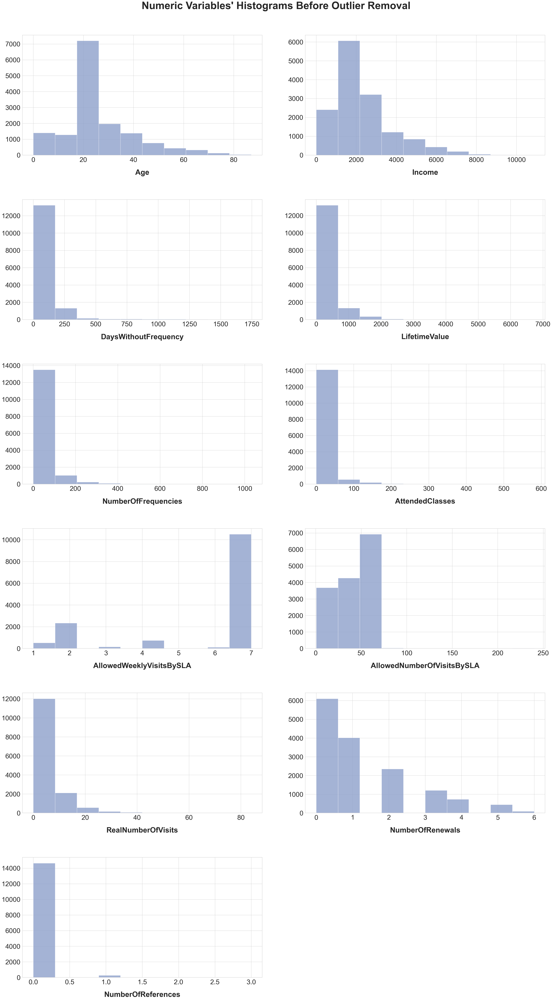

In [23]:
# Set the font size for axis labels
label_font_size = 16  # Choose an appropriate font size

# All Numeric Variables' Histograms in one figure
sns.set(font_scale=3)
sns.set_style("whitegrid")

# Get array of features
data = metric_features

a = 6  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(40, 70))

# Building the Histograms
for i in data:
    plt.subplot(a, b, c)
    plt.xlabel(i,fontweight="bold",labelpad=30)
    plt.hist(customers[i], color=sns.color_palette("Set2")[2], alpha=0.8)
    c = c + 1
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms Before Outlier Removal"
plt.suptitle(title, fontsize=50, fontweight="bold")
plt.tight_layout(pad=3)

plt.show()


#### 2) Box Plots

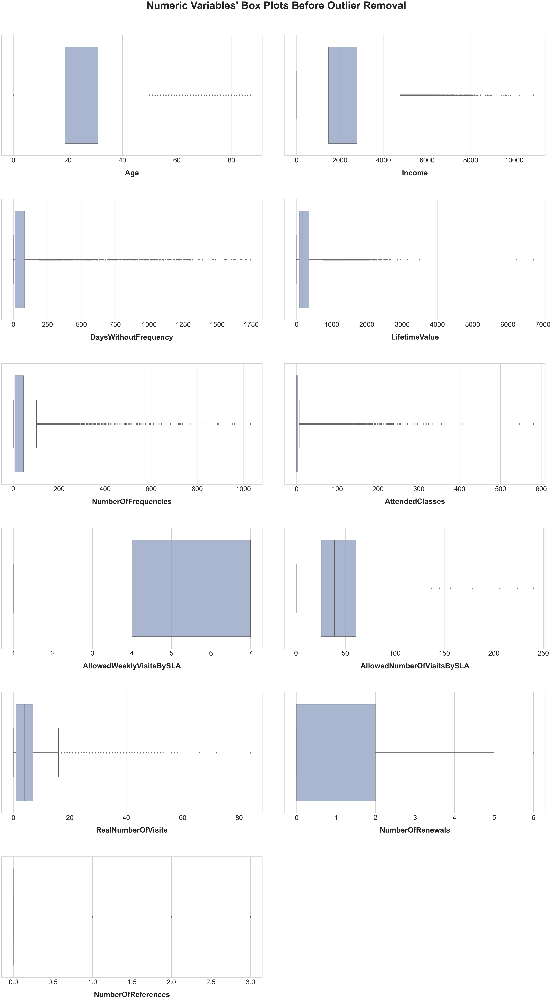

In [24]:
sns.set(font_scale=3)
sns.set_style("whitegrid")

# Get array of features
data = metric_features

a = 6  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(40, 70))

# Building the Histograms
for i in data:
    plt.subplot(a, b, c)
    plt.xlabel(i, fontweight="bold", labelpad=30)
    sns.boxplot(x=customers[i], color=sns.color_palette("Set2")[2], boxprops=dict(alpha=.8))
    c = c + 1

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots Before Outlier Removal"
plt.suptitle(title, fontsize=50, fontweight="bold")
plt.tight_layout(pad=3)

plt.show()

In [25]:
# Calculate Q1, Q3, IQR
q25 = customers[metric_features].quantile(0.25)
q75 = customers[metric_features].quantile(0.75)
IQR = q75 - q25

# Compute upper and lower limits
upper_lim = q75 + 1.5 * IQR
lower_lim = q25 - 1.5 * IQR

# Create a list to store dictionaries
outlier_percentages = []

for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    
    # Filter the data frame to exclude missing values
    non_missing_data = customers[customers[metric].notnull()]
    
    # Calculate the percentage of outliers among non-missing values
    below_count = (non_missing_data[metric] < llim).sum()
    above_count = (non_missing_data[metric] > ulim).sum()
    
    total_non_missing = len(non_missing_data)
    
    if total_non_missing > 0:
        percentage_outliers = (below_count + above_count) / total_non_missing * 100
    else:
        percentage_outliers = 0
    
    # Append a dictionary to the list
    outlier_percentages.append({'Feature': metric,'Below the lower limit': below_count, 'Above the upper limit': above_count ,'%Outliers': percentage_outliers})

# Convert the list of dictionaries to a DataFrame
outlier_percentages_df = pd.DataFrame(outlier_percentages)

# Display the DataFrame
outlier_percentages_df = outlier_percentages_df.sort_values(by='%Outliers', ascending=False)

outlier_percentages_df

,Feature,Below the lower limit,Above the upper limit,%Outliers
5,AttendedClasses,0,3086,20.653192
2,DaysWithoutFrequency,0,1540,10.306519
3,LifetimeValue,0,1464,9.797885
4,NumberOfFrequencies,0,1438,9.640654
1,Income,0,1128,7.807849
0,Age,19,1144,7.783429
8,RealNumberOfVisits,0,819,5.481194
10,NumberOfReferences,0,296,1.980993
9,NumberOfRenewals,0,86,0.575559
7,AllowedNumberOfVisitsBySLA,0,30,0.200776


#### 3) Correlation Matrix

locator: <matplotlib.ticker.AutoLocator object at 0x000001D4CA029090>


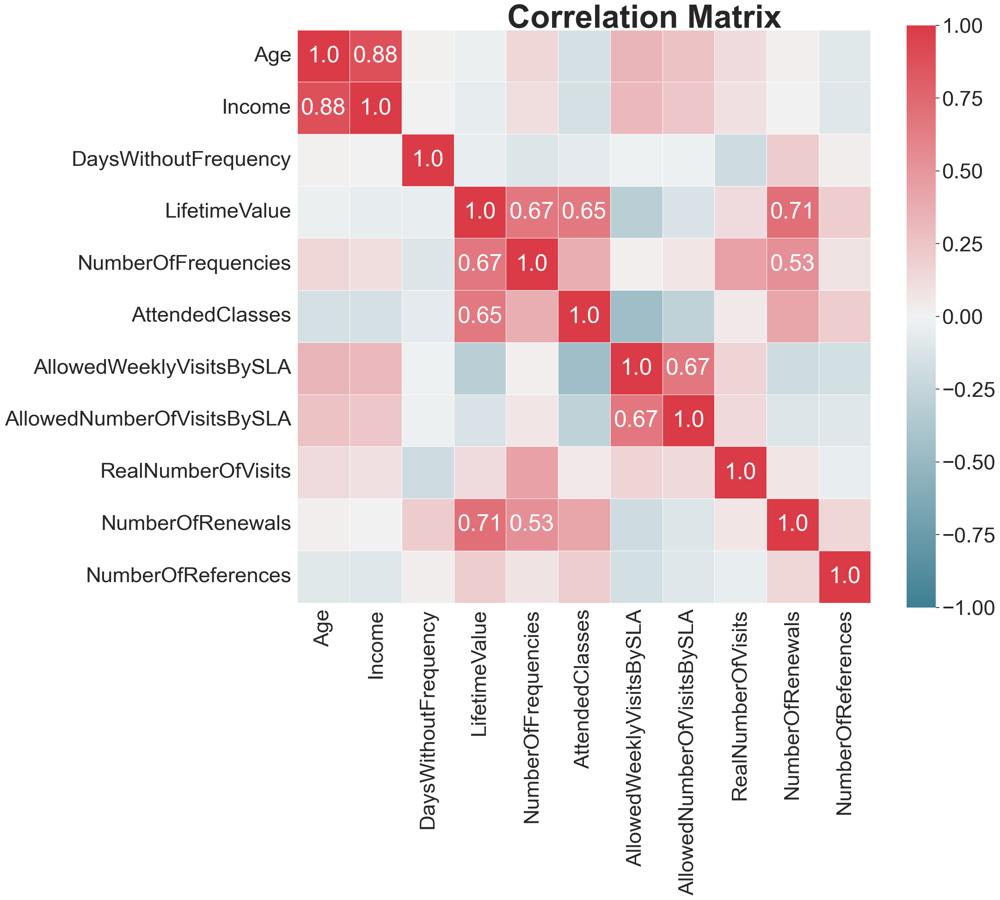

In [26]:
# Prepare figure
fig = plt.figure(figsize=(20, 15))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = customers[metric_features].corr().round(2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, 
            cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=50, fontweight="bold")
plt.show()

**Remaining Problems after visual Exploration of metric variables - Variables to drop**
* *NumberOfReferences*: After analyzing the histogram, and box plot, and the one seeing that this variable is not correlated with any variable, and also realizing that it has 98%.

In [27]:
customers["NumberOfReferences"].describe().T

count    14942.000000
mean         0.022286
std          0.166777
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.000000
Name: NumberOfReferences, dtype: float64

In [28]:
customers['NumberOfReferences'].value_counts(normalize=True)*100

NumberOfReferences
0    98.019007
1     1.786909
2     0.140543
3     0.053540
Name: proportion, dtype: float64

#### <div id="visual-exploration-non-metric-variables">1.2.2 Visual Exploration - Non-Metric Variables</div>

In [29]:
# Create a DataFrame with your categorical data# List of non-metric feature columns excluding date columns
nmf_no_dates = ["Dropout", "HasReferences", "OtherActivities", "SpecialActivities", "NatureActivities",
                      "CombatActivities", "RacketActivities", "TeamActivities", "DanceActivities", "FitnessActivities",
                      "WaterActivities", "AthleticsActivities", "UseByTime", "Gender"]

#dates = ["EnrollmentStart", "EnrollmentFinish", "LastPeriodStart", "LastPeriodFinish", "DateLastVisit"]

# Create a DataFrame with your categorical data (excluding date columns)
customers_nmf = customers[nmf_no_dates].copy()
customers_nmf.head()

,Dropout,HasReferences,OtherActivities,SpecialActivities,NatureActivities,CombatActivities,RacketActivities,TeamActivities,DanceActivities,FitnessActivities,WaterActivities,AthleticsActivities,UseByTime,Gender
ID,,,,,,,,,,,,,,
10000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,Female
10001,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Female
10002,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,Male
10003,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,Male
10004,1,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,Male


In [30]:
nmf_no_dates

['Dropout',
 'HasReferences',
 'OtherActivities',
 'SpecialActivities',
 'NatureActivities',
 'CombatActivities',
 'RacketActivities',
 'TeamActivities',
 'DanceActivities',
 'FitnessActivities',
 'WaterActivities',
 'AthleticsActivities',
 'UseByTime',
 'Gender']

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=11.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

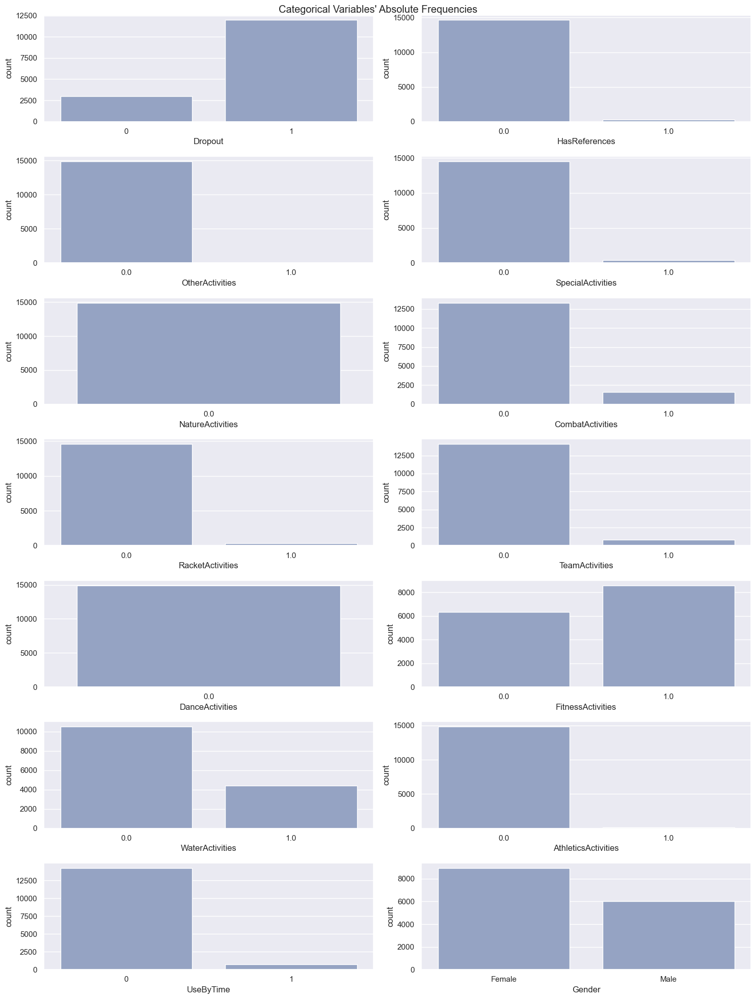

In [31]:
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(7, math.ceil(len(nmf_no_dates) / 7), figsize=(15, 20))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), nmf_no_dates): # Notice the zip() function and flatten() method
    sns.countplot(x=customers[feat].astype(object), ax=ax, color=sns.color_palette("Set2")[2])
    ax.set_xlabel(feat)  # Set the x-axis label for each subplot

title = "Categorical Variables' Absolute Frequencies"
plt.suptitle(title)
plt.tight_layout()  # Adjust spacing between subplots
plt.show()

**Remaining Problems after visual Exploration of non-metric variables - Variables to drop**
* "Just zeros" - All the customers in the sample don´t do 
    * *Nature Activities*:  we have 47, missing values <=> 0.314550 % of the data
    *  *Dance Activities*:  we have 36, missing values<=> 0.240932% of the data
  
* "Almost just zeros" - Proxi all the customers (99% of the customers) in the sample don´t do 
    * *OtherActivities*: we have 35 missing values <=> 0.2409316% of the data
    * *AthleticsActivities*: we have 36 missing values <=> 0.240932%% of the data40932

In [32]:
#1.1
#customers.NatureActivities.isna().sum()
#customers.NatureActivities.unique()
customers.NatureActivities.value_counts(normalize=True)

NatureActivities
0.0    1.0
Name: proportion, dtype: float64

In [33]:
#1.2
#customers.DanceActivities.isna().sum()
#customers.DanceActivities.unique()
customers.DanceActivities.value_counts(normalize=True)

DanceActivities
0.0    1.0
Name: proportion, dtype: float64

In [34]:
#2.1
#customers.OtherActivities.isna().sum()
#customers.OtherActivities.unique()
customers.OtherActivities.value_counts(normalize=True)

OtherActivities
0.0    0.998122
1.0    0.001878
Name: proportion, dtype: float64

In [35]:
#2.2
#customers.AthleticsActivities.isna().sum()
customers.AthleticsActivities.value_counts(normalize=True)

AthleticsActivities
0.0    0.99262
1.0    0.00738
Name: proportion, dtype: float64

**OTHER CASES TO TAKE IN CONSIDERATION AFTER FILLING THE MISSING VALUES**

In [36]:
customers.SpecialActivities.value_counts(normalize=True)

SpecialActivities
0.0    0.973486
1.0    0.026514
Name: proportion, dtype: float64

In [37]:
customers.RacketActivities.value_counts(normalize=True)

RacketActivities
0.0    0.976585
1.0    0.023415
Name: proportion, dtype: float64

In [38]:
customers.HasReferences.value_counts(normalize=True)

HasReferences
0.0    0.980107
1.0    0.019893
Name: proportion, dtype: float64

## <div id="data-preprocessing">2. Data Preprocessing</div>

In the next section, we will transform our dataset. So, in order to preserve the original data we create a copy and we will apply the transformations to the copy.

In [39]:
customers_df=customers.copy()

### <div id="coherence-checking">2.1 Coherence Checking</div>

**1) Income**: <br>Let's see if we have customers who have income but don't have the age to work. We assume that we are dealing with a Portuguese company, so the legal working age for full-time/part-time, subject to certain conditions employment is  16.

In [40]:
customers_df.loc[(customers_df['Age'] < 16) & (customers_df['Income'] != 0)]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10076,9,Male,NaN,2017-09-16,2017-09-16,2019-07-01,2019-12-31,2019-10-26,5,708.20,...,0.0,64.0,64,2.0,17.42,6,2,0.0,0,0
10224,7,Male,NaN,2016-04-20,2018-11-11,2018-07-01,2018-12-31,2018-10-25,17,836.60,...,0.0,107.0,91,2.0,11.72,6,3,0.0,0,1
10226,10,Female,NaN,2016-11-14,2016-11-14,2019-07-01,2019-12-31,2019-10-26,5,1331.55,...,0.0,65.0,47,1.0,8.71,4,3,0.0,0,0
10261,3,Male,NaN,2017-09-07,2017-09-07,2019-07-01,2019-12-31,2019-10-19,12,1066.40,...,0.0,78.0,62,2.0,17.42,5,2,0.0,0,0
10295,5,Female,NaN,2015-03-05,2015-03-05,2019-07-01,2019-12-31,2019-09-07,54,286.30,...,0.0,15.0,7,1.0,3.14,0,5,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24804,4,Female,NaN,2016-03-05,2016-03-05,2019-07-01,2019-12-31,2019-10-26,5,1656.30,...,0.0,95.0,88,2.0,9.72,3,4,0.0,0,0
24830,2,Male,2750.0,2018-07-26,2018-07-26,2019-07-01,2019-12-31,2019-10-19,12,773.32,...,0.0,27.0,20,2.0,17.42,8,2,0.0,0,0
24836,5,Male,NaN,2018-07-02,2018-07-02,2019-07-01,2019-12-31,2019-10-30,1,654.60,...,0.0,20.0,20,2.0,15.42,9,2,0.0,0,0


**Conclusion**: <br>
We decided that the value in income corresponds to an error in our data that could produce noise so we replaced those values with 0.
<br>

In [41]:
customers_df.loc[(customers_df['Age'] < 16) & (customers_df['Income'] != 0), 'Income'] = 0
customers_df.loc[(customers_df['Age'] < 16)]["Income"].value_counts()

Income
0.0    2330
Name: count, dtype: int64

**2) Visits:**
*  2.1: *AllowedWeeklyVisitsBySLA*  should not be NAN when  *AllowedNumberOfVisitsBySLA* is not 
*  2.2: *AllowedWeeklyVisitsBySLA* should be less or equal to  *AllowedNumberOfVisitsBySLA*
*  2.3: *RealNumberOfVisits* should be less or equal to *AllowedNumberOfVisitsBySLA*

In [42]:
#2.1
customers_df.loc[(customers_df['AllowedWeeklyVisitsBySLA'].isnull()) | (customers_df['AllowedNumberOfVisitsBySLA'].isnull())]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
10019,28,Male,2510.0,2019-10-01,2019-10-31,2019-07-01,2019-12-31,2019-10-21,10,52.00,...,0.0,2.0,0,NaN,24.01,2,0,0.0,0,0
10034,74,Female,5210.0,2019-10-01,2019-10-31,2019-07-01,2019-12-31,2019-10-11,20,38.50,...,0.0,4.0,0,NaN,30.03,4,0,0.0,0,0
10107,19,Female,1690.0,2019-10-02,2019-10-31,2019-07-01,2019-12-31,2019-10-15,16,48.00,...,0.0,2.0,0,NaN,28.98,2,0,0.0,0,0
10109,29,Female,2730.0,2019-09-13,2019-10-31,2019-07-01,2019-12-31,2019-10-29,2,96.20,...,0.0,13.0,0,NaN,48.02,13,0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24820,23,Female,2600.0,2019-09-05,2019-10-31,2019-07-01,2019-12-31,2019-10-09,22,63.20,...,0.0,6.0,0,NaN,30.03,7,0,0.0,0,0
24860,17,Female,1650.0,2019-09-23,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,87.20,...,0.0,3.0,3,NaN,17.16,4,0,0.0,0,0
24863,39,Male,1790.0,2019-10-09,2019-10-31,2019-07-01,2019-12-31,2019-10-24,7,65.20,...,0.0,6.0,0,NaN,21.98,8,0,0.0,0,0


**Conclusion:** Maybe the variable _AllowedWeeklyVisitsBySLA_ is not relevant to our analysis and in the cases above we could not calculate what could be the _AllowedWeeklyVisitsBySLA_. We know that there´s a positive correlation (=0.67) between _AllowedWeeklyVisitsBySLA_ and _AllowedNumberOfVisitsBySLA_, but we could not find a pattern, as we can see bellow.

In [43]:
customers_df.groupby('AllowedWeeklyVisitsBySLA') ['AllowedNumberOfVisitsBySLA'].value_counts()

AllowedWeeklyVisitsBySLA  AllowedNumberOfVisitsBySLA
1.0                       8.71                          367
                          8.86                           45
                          8.43                           28
                          8.57                           13
                          34.29                          10
                                                       ... 
7.0                       156.03                          1
                          206.01                          1
                          224.00                          1
                          3.01                            1
                          7.00                            1
Name: count, Length: 281, dtype: int64

In [44]:
pd.set_option('display.max_rows', None)
customers_df.groupby('AllowedNumberOfVisitsBySLA') ['AllowedWeeklyVisitsBySLA'].value_counts()

AllowedNumberOfVisitsBySLA  AllowedWeeklyVisitsBySLA
0.56                        4.0                            2
0.71                        1.0                            4
0.86                        2.0                            1
1.42                        2.0                            1
1.72                        2.0                            2
                            4.0                            1
1.86                        1.0                            2
2.00                        2.0                            1
2.03                        7.0                            2
2.28                        2.0                            2
2.29                        1.0                            1
2.43                        1.0                            1
2.86                        2.0                            2
                            1.0                            1
3.00                        1.0                            1
3.01                        7.0 

In [45]:
#2.2
customers_df.loc[(customers_df['AllowedWeeklyVisitsBySLA']) > (customers_df['AllowedNumberOfVisitsBySLA'])] .head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10102,27,Female,2580.0,2015-11-04,2016-08-13,2016-07-01,2016-12-31,2016-08-10,3,310.60,...,0.0,78.0,6,7.0,4.97,2,2,0.0,0,1
10326,35,Male,3880.0,2015-06-16,2015-09-16,2015-01-01,2015-06-30,2015-06-25,83,189.60,...,0.0,2.0,0,2.0,1.42,1,1,0.0,0,1
10345,21,Male,1890.0,2016-02-15,2016-08-26,2016-07-01,2016-12-31,2016-08-24,2,184.10,...,0.0,31.0,5,7.0,3.99,2,0,0.0,0,1
10457,24,Female,1910.0,2014-09-30,2016-08-13,2016-07-01,2016-12-31,2016-08-11,2,685.05,...,0.0,240.0,123,7.0,4.97,3,3,0.0,0,1
10514,47,Female,5670.0,2017-03-17,2017-08-29,2017-07-01,2017-12-31,2017-08-09,20,123.70,...,0.0,25.0,1,7.0,4.97,1,0,0.0,0,1


**Conclusions:** <br>
**65 cases where the visits per week are bigger than the total visits**<br>
  There can be scenarios where the "Weekly Visits" limit is greater than the "Total Visits" limit in a service agreement. Here's an example: ==> **Scenario: Special Event Pass**

In [46]:
#2.3
#since the real number of visits is an integer number, we will convert the total number of visits to the closer integer to compare the result 

int_ANV=customers_df['AllowedNumberOfVisitsBySLA'].round().astype(int)
customers_df.loc[(customers_df['RealNumberOfVisits']) > (int_ANV)] #44 cases that might be wrong

#The wrong ones will be the ones where UseByTime=0, and should be =1 => 41 situations
customers_df.loc[((customers_df['RealNumberOfVisits'] > int_ANV) & (customers_df['UseByTime'] == 0))]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10271,35,Female,1000.0,2015-02-20,2015-02-20,2019-07-01,2019-12-31,2019-10-29,2,1235.85,...,0.0,196.0,191,2.0,6.86,10,5,0.0,0,0
10409,20,Female,1650.0,2016-09-20,2016-09-20,2019-07-01,2019-12-31,2019-10-31,0,711.40,...,0.0,191.0,126,3.0,19.29,49,3,0.0,0,0
10481,54,Female,2980.0,2018-11-12,2018-11-12,2019-07-01,2019-12-31,2019-10-29,2,337.85,...,0.0,59.0,59,2.0,17.42,26,1,0.0,0,0
10672,60,Female,5170.0,2015-05-05,2015-05-05,2019-07-01,2019-12-31,2019-10-31,0,1529.55,...,0.0,322.0,318,2.0,8.58,11,5,0.0,0,0
11034,32,Male,2960.0,2019-10-09,2019-10-31,2019-07-01,2019-12-31,2019-10-31,0,90.20,...,0.0,6.0,5,NaN,6.28,8,0,0.0,0,0
11232,33,Male,2470.0,2015-08-19,2015-08-19,2019-07-01,2019-12-31,2019-10-30,1,1421.70,...,0.0,263.0,253,2.0,17.42,24,5,0.0,0,0
11890,24,Female,2040.0,2015-07-06,2016-08-01,2016-01-01,2016-12-31,2016-07-20,12,205.00,...,0.0,20.0,20,1.0,8.71,10,2,0.0,0,1
11964,60,Male,5030.0,2015-12-09,2016-07-31,2016-01-01,2016-12-31,2016-07-30,1,192.60,...,0.0,14.0,11,1.0,8.71,10,0,0.0,0,1
12140,28,Female,1720.0,2016-09-05,2016-09-05,2019-07-01,2019-12-31,2019-10-30,1,778.80,...,0.0,133.0,123,1.0,7.43,8,3,0.0,0,0


**Conclusions:** <br>
In the 41 situations where this happens, we consider an error and change the value of UseByTime =1.

In [47]:
#correction
customers_df.loc[((customers_df['RealNumberOfVisits'] > int_ANV) & (customers_df['UseByTime'] == 0)), 'UseByTime'] = 1
customers_df.loc[((customers_df['RealNumberOfVisits'] > int_ANV) & (customers_df['UseByTime'] == 0))]


,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,


**3) Dates**: 
* 3.1: *EnrollmentStart* should be before *EnrollmentFinish*
* 3.2: *DateLastVisit*  should be before or equal to *EnrollmentFinish* if  *NumberOfRenewals*==0
* 3.2: *DateLastVisit*  should be before or equal to *LastPeriodFinish*
* 3.4  *LastPeriodFinish* should be after *LastPeriodStart*
* 3.5: *LastPeriodFinish* should be before  *EnrollmentFinish* and *EnrollmentStart* should be before *LastPeriodStart*

In [48]:
#3.1
# Convert 'EnrollmentStart' and 'EnrollmentFinish' to datetime objects
customers_df['EnrollmentStart'] = pd.to_datetime(customers_df['EnrollmentStart'])
customers_df['EnrollmentFinish'] = pd.to_datetime(customers_df['EnrollmentFinish'])

# Compare if 'EnrollmentStart' is after 'EnrollmentFinish' => 0 cases
customers_df.loc[ customers_df['EnrollmentStart'] > customers_df['EnrollmentFinish']]

#Compare if 'EnrollmentStart is equal to 'EnrollmentFinish'=> whenever they are the same there is at least on renewal
customers_df.loc[(customers_df['EnrollmentStart'] == customers_df['EnrollmentFinish']) & (customers_df['NumberOfRenewals']==0), ['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'NumberOfRenewals']]

,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,NumberOfRenewals
ID,,,,,


**Conclusions**: 
- **clients that only made 1 contract:** customers_df.loc[ customers_df['EnrollmentStart'] == customers_df['EnrollmentFinish']] &  customers_df['NumberOfRenewals']=0
- **clients that change their contract:** customers_df.loc[ customers_df['EnrollmentStart'] < customers_df['EnrollmentFinish']]

In [49]:
#3.2
# Convert 'DateLastVisit' to datetime object
customers_df['DateLastVisit'] = pd.to_datetime(customers_df['DateLastVisit'])

# Compare if 'DateLastVisit' is after 'EnrollmentFinish'
customers_df.loc[customers_df['DateLastVisit'] > customers_df['EnrollmentFinish'], ['DateLastVisit','EnrollmentStart', 'EnrollmentFinish', 'NumberOfRenewals']].head()

,DateLastVisit,EnrollmentStart,EnrollmentFinish,NumberOfRenewals
ID,,,,
10025,2019-10-26,2015-09-09,2015-09-09,4
10036,2019-10-22,2014-10-02,2014-10-02,5
10038,2019-10-30,2018-09-29,2018-09-29,1
10049,2019-10-29,2018-09-03,2018-09-03,1
10051,2019-10-28,2018-08-17,2018-08-17,2


The previous situation it´s only possible if someone keeps renewing their contracts.
Let´s check if there´s a situation like that with no renewals

In [50]:
customers_df.loc[ (customers_df['DateLastVisit'] > customers_df['EnrollmentFinish'])& (customers_df['EnrollmentStart'] !=customers_df['EnrollmentFinish'])& (customers_df['NumberOfRenewals']>0) ]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,


Let´s see if the year of DateLastVisit respect year of EnrollmentFinish + NumberOfRenewals:

In [51]:
customers_df['EnrollmentFinish'] = pd.to_datetime(customers_df['EnrollmentFinish'])
customers_df["year of EnrollmentFinish"] = customers_df['EnrollmentFinish'].dt.year
customers_df['DateLastVisit'] = pd.to_datetime(customers_df['DateLastVisit'])
customers_df["year of DateLastVisit"] = customers_df['DateLastVisit'].dt.year

result = customers_df.loc[(customers_df['year of DateLastVisit'] > customers_df['year of EnrollmentFinish'] + customers_df['NumberOfRenewals']) & (customers_df['DateLastVisit'] > customers_df['EnrollmentFinish']) & (customers_df['NumberOfRenewals'] != 0), ["year of DateLastVisit", "year of EnrollmentFinish", 'DateLastVisit', 'EnrollmentStart', 'EnrollmentFinish', 'NumberOfRenewals']]
result

,year of DateLastVisit,year of EnrollmentFinish,DateLastVisit,EnrollmentStart,EnrollmentFinish,NumberOfRenewals
ID,,,,,,


**Conclusion**:  The DateLastVisit	> EnrollmentFinish only when EnrollmentStart	EnrollmentFinish are the same ==>  NumberOfRenewals >0

ALL GOOD!

In [52]:
#3.3
# Convert 'DateLastVisit' to datetime object
customers_df['LastPeriodFinish'] = pd.to_datetime(customers_df['LastPeriodFinish'])

# Compare if 'DateLastVisit' is after 'LastPeriodFinish'
customers_df.loc[customers_df['DateLastVisit'] > customers_df['LastPeriodFinish'], ['DateLastVisit','EnrollmentStart', 'EnrollmentFinish','LastPeriodFinish','NumberOfRenewals']]

# In those cases 'DateLastVisit' should be before 'EnrollmentFinish' and there are no renewals
#because if we had renewals just meant that the customer doesn't subscribe to any more activities but keeps renewing the contract ith the gym
result = customers_df.loc[
    (customers_df['DateLastVisit'] > customers_df['LastPeriodFinish']) &
    (customers_df['DateLastVisit'] > customers_df['EnrollmentFinish']) & (customers_df['NumberOfRenewals']==0),
    ['DateLastVisit', 'EnrollmentStart', 'EnrollmentFinish', 'LastPeriodFinish', 'NumberOfRenewals']
]
result 


,DateLastVisit,EnrollmentStart,EnrollmentFinish,LastPeriodFinish,NumberOfRenewals
ID,,,,,


In [53]:
#3.4
customers_df.loc[customers_df['LastPeriodStart'] > customers_df['LastPeriodFinish']]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,year of EnrollmentFinish,year of DateLastVisit
ID,,,,,,,,,,,,,,,,,,,,,


In [54]:
#3.5: LastPeriodFinish should be before EnrollmentFinish and EnrollmentStart should be before LastPeriodStart
customers_df.loc[customers_df['LastPeriodFinish'] > customers_df['EnrollmentFinish']]
customers_df.loc[customers_df['LastPeriodStart'] > customers_df['EnrollmentStart']].head()


,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,year of EnrollmentFinish,year of DateLastVisit
ID,,,,,,,,,,,,,,,,,,,,,
10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.2,...,1,2.0,17.42,1,2,0.0,0,1,2015,2015
10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.2,...,0,7.0,60.97,0,3,0.0,0,1,2018,2017
10005,24,Female,2220.0,2015-12-01,2016-07-31,2016-01-01,2016-12-31,2016-07-28,3,140.0,...,0,7.0,59.01,26,0,0.0,0,1,2016,2016
10006,23,Male,2340.0,2015-10-06,2019-04-11,2019-01-01,2019-06-30,2019-03-26,16,143.5,...,0,7.0,30.03,3,3,0.0,0,1,2019,2019
10007,23,Male,1910.0,2015-03-25,2019-07-31,2019-01-01,2019-06-30,2019-04-23,99,233.9,...,0,7.0,60.97,11,5,0.0,0,1,2019,2019


In [55]:
customers_df.loc[(customers_df['LastPeriodFinish'] > customers_df['EnrollmentFinish'])&(customers_df['Dropout']==0)&(customers_df['NumberOfRenewals']==0)&(customers_df['EnrollmentFinish']!='2019-10-31'	)] 

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,year of EnrollmentFinish,year of DateLastVisit
ID,,,,,,,,,,,,,,,,,,,,,


**Conclusion:** In this case we consider that the enrolment dates are independent of the period dates. The period dates are related to the activities that the gym has going on and they are semestral or annual. If a customer subscribes to an activity the starting date and finish date are fixed for all the customers that subscribe to that same activity for that semester or year, independently of the date of enrolment of the customer. 
* customers_df.loc[customers_df['LastPeriodFinish'] > customers_df['EnrollmentFinish']] ==> means that a customer ends the contract before the activity ends, before the end of the year of the semester, and then drops out. It does not ´drop out, keep renewing its contract
  *   The only situation that there are no renewals (<=> customers_df.loc[(customers_df['LastPeriodFinish'] > customers_df['EnrollmentFinish'])&(customers_df['Dropout']==0)&(customers_df['NumberOfRenewals']==0)] )correspond to the new clients where the date on  EnrollmentFinish == '2019-10-31', equivalent to the dataset. 

* customers_df.loc[customers_df['LastPeriodStart'] > customers_df['EnrollmentStart']] ==> means that a customer starts in the gym after the beginning of the activity because it started at the beginning of the year or semester that does not correspond to the day that the customer enrolls

 

In [56]:
customers_df=customers_df.drop('year of EnrollmentFinish', axis=1  )    
customers_df=customers_df.drop('year of DateLastVisit', axis=1  )    

**4) Ages**: <br>
Let's see if we have customers who have "strange ages".



In [57]:
customers_df.Age.describe().T

count    14942.000000
mean        26.015794
std         14.156582
min          0.000000
25%         19.000000
50%         23.000000
75%         31.000000
max         87.000000
Name: Age, dtype: float64

The minimum age it´s 0 which is strange. Let´s investigate a little more:

In [58]:
customers_df.loc[customers_df['Age'] == 0]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10691,0,Male,0.0,2016-10-17,2016-12-09,2016-07-01,2016-12-31,2016-11-26,13,87.35,...,0.0,1.0,0,2.0,10.86,1,0,0.0,0,1
10879,0,Female,0.0,2017-07-08,2017-12-20,2017-07-01,2017-12-31,2017-11-25,25,194.60,...,0.0,5.0,3,2.0,17.42,1,1,0.0,0,1
11509,0,Female,0.0,2019-07-22,2019-07-22,2019-07-01,2019-12-31,2019-10-19,12,96.50,...,0.0,5.0,5,2.0,17.14,5,1,0.0,0,0
14040,0,Female,0.0,2019-07-15,2019-07-15,2019-07-01,2019-12-31,2019-10-16,15,87.20,...,0.0,5.0,1,2.0,8.00,2,1,0.0,0,0
14066,0,Male,0.0,2019-07-29,2019-07-29,2019-07-01,2019-12-31,2019-10-19,12,147.20,...,0.0,4.0,1,2.0,17.14,4,1,0.0,0,0
15346,0,Female,0.0,2015-02-23,2015-09-16,2015-01-01,2015-06-30,2015-05-21,118,121.10,...,0.0,23.0,0,7.0,60.97,8,1,0.0,0,1
15580,0,Female,0.0,2019-09-16,2019-10-31,2019-07-01,2019-12-31,2019-10-26,5,451.40,...,0.0,2.0,2,NaN,8.58,2,0,0.0,0,0
15653,0,Male,0.0,2019-07-16,2019-07-16,2019-07-01,2019-12-31,2019-10-26,5,104.30,...,0.0,6.0,6,2.0,16.86,6,1,0.0,0,0
16038,0,Male,0.0,2018-07-16,2018-10-03,2018-07-01,2018-12-31,2018-09-22,11,69.40,...,0.0,3.0,2,2.0,9.14,3,1,0.0,0,1


In [59]:

#PROBLEMS
#4.1) customers_df.loc[customers_df['Age'] < 6, 'CombatActivities'] .value_counts()
#4.2) customers_df.loc[customers_df['Age'] < 6, 'TeamActivities'] .value_counts() 
#4.3) customers_df.loc[customers_df['Age'] < 6, 'FitnessActivities'] .value_counts()
#4.4) customers_df.loc[customers_df['Age'] < 6, 'WaterActivities'] .value_counts()

#ALL GOOD - only zeros
#customers_df.loc[customers_df['Age'] < 6, 'NatureActivities'] .value_counts() => 0.0    922
#customers_df.loc[customers_df['Age'] < 6, 'SpecialActivities'] .value_counts() => 0.0    926
#customers_df.loc[customers_df['Age'] < 6, 'OtherActivities'] .value_counts() => 0.0    925
#customers_df.loc[customers_df['Age'] < 6, 'RacketActivities'] .value_counts() => 0.0    917
#customers_df.loc[customers_df['Age'] < 6, 'DanceActivities'] .value_counts() => 0.0    918
#customers_df.loc[customers_df['Age'] < 6, 'AthleticsActivities'] .value_counts() => 0.0    915


In [60]:
#4.1
#customers_df.loc[customers_df['Age'] < 6, 'CombatActivities'] .value_counts() => 0.0    920 | 1.0      7
customers_df.loc[(customers_df['Age'] < 6) & (customers_df['CombatActivities'] == 1), 
                 ['AthleticsActivities', 'WaterActivities', 'FitnessActivities', 
                  'DanceActivities', 'TeamActivities', 'RacketActivities', 
                  'CombatActivities', 'NatureActivities', 'SpecialActivities', 
                  'OtherActivities', 'Age']]

,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,Age
ID,,,,,,,,,,,
10929,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5
11513,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3
14407,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4
15678,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4
17552,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5
19354,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4
20334,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4


**Conclusion:** When we think about combat activities for kids, we think for instance in karate. We consider that the minimum age to start was 6 years old. So the 7 rows above don´t make sense!

In [61]:
rows_to_drop = customers_df[(customers_df['Age'] < 6) & (customers_df['CombatActivities'] == 1)].index
customers_df.drop(rows_to_drop, inplace=True)

In [62]:
#4.2
#customers_df.loc[customers_df['Age'] < 6, 'TeamActivities'] .value_counts() => 0.0    911 | 1.0      7
customers_df.loc[(customers_df['Age'] < 6) & (customers_df['TeamActivities'] == 1), 
                 ['AthleticsActivities', 'WaterActivities', 'FitnessActivities', 
                  'DanceActivities', 'CombatActivities', 'RacketActivities', 
                  'CombatActivities', 'NatureActivities', 'SpecialActivities', 
                  'OtherActivities', 'Age']]

,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,CombatActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,Age
ID,,,,,,,,,,,
10295,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
11949,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
14988,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
16528,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
17527,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
18805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
20220,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


**Conclusion:** We decided to drop this instance as well:

In [63]:
rows_to_drop = customers_df[(customers_df['Age'] < 6) & (customers_df['TeamActivities'] == 1)].index
customers_df.drop(rows_to_drop, inplace=True)

In [64]:
#4.3
#customers_df.loc[customers_df['Age'] < 6, 'TeamActivities'] .value_counts() => 0.0    917 | 1.0      3
customers_df.loc[(customers_df['Age'] < 6) & (customers_df['FitnessActivities'] == 1), 
                 ['AthleticsActivities', 'WaterActivities', 'TeamActivities', 
                  'DanceActivities', 'CombatActivities', 'RacketActivities', 
                  'CombatActivities', 'NatureActivities', 'SpecialActivities', 
                  'OtherActivities', 'FitnessActivities','Age']]

,AthleticsActivities,WaterActivities,TeamActivities,DanceActivities,CombatActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,FitnessActivities,Age
ID,,,,,,,,,,,,
15346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
18528,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
24338,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0


**Conclusion:** Only three observations verify this and it doesn´t make sense for in all dataset just the kids around 0 and 1 years old practice fitness activities.

In [65]:
rows_to_drop = customers_df[(customers_df['Age'] < 6) & (customers_df['FitnessActivities'] == 1)].index
customers_df.drop(rows_to_drop, inplace=True)

In [66]:
#4.4
customers_df.loc[(customers_df['Age']<6) & (customers_df['WaterActivities'] == 0), 
                 ['AthleticsActivities', 'WaterActivities', 'TeamActivities', 
                  'DanceActivities', 'CombatActivities', 'RacketActivities', 
                  'CombatActivities', 'NatureActivities', 'SpecialActivities', 
                  'OtherActivities', 'FitnessActivities','Age']]

,AthleticsActivities,WaterActivities,TeamActivities,DanceActivities,CombatActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,FitnessActivities,Age
ID,,,,,,,,,,,,


**Conclusion:** It makes sense to have so many customers under 6 practicing water activities, we could assume that the gyms have swimming lessons for babies/kids. We were only intrigued by the 3 records that don´t practice water activities. After looking at them all correspond to children of 5 years old that only do Team Activities, which could be possible. 

**5) References**: <br>

Let's see if has Refences and the number of refernces are correctly coordinate.

In [67]:
#MISSING DATA IN HASREFERENCES
customers_df.loc[(customers_df['HasReferences'].isna()), ['NumberOfReferences']] 
#only 12 rows of the HasReferences is missing value, but the NumberOfReferencess is always > =1
#correct  the variable HasReferences
customers_df.loc[customers_df['HasReferences'].isna(), 'HasReferences'] = 1

In [68]:
#IF HASREFERENCES = 0 ==> NUMBEROFREFERENCES SHOULD BE 0
#customers_df.loc[(customers_df['HasReferences'] == 0)] => 14633 rows  
customers_df.loc[(customers_df['HasReferences'] == 0)] ['NumberOfReferences'].value_counts()#0    14633 ==> all of them with the value 0 

NumberOfReferences
0    14618
Name: count, dtype: int64

In [69]:
#IF HASREFERENCES = 0 ==> NUMBEROFREFERENCES SHOULD BE 0
#customers_df.loc[(customers_df['NumberOfReferences'] == 0)] ['HasReferences'].value_counts()
customers_df.loc[(customers_df['NumberOfReferences'] == 0) &(customers_df['HasReferences'] == 1)]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
11259,43,Female,4270.0,2017-08-24,2018-04-07,2018-01-01,2018-06-30,2017-11-02,156,154.6,...,0.0,4.0,4,2.0,16.86,0,2,1.0,0,1
11626,22,Male,1620.0,2014-10-24,2016-07-31,2016-01-01,2016-12-31,2016-06-29,32,113.6,...,0.0,17.0,0,7.0,66.99,7,1,1.0,0,1
12548,14,Male,0.0,2016-02-22,2016-07-31,2016-01-01,2016-12-31,2016-07-18,13,258.6,...,0.0,30.0,25,2.0,17.42,10,0,1.0,0,1
12943,27,Male,1760.0,2014-06-18,2015-09-16,2015-01-01,2016-06-30,2015-05-12,127,160.6,...,0.0,23.0,4,7.0,240.03,0,2,1.0,0,1
14136,22,Female,2030.0,2015-03-03,2016-01-04,2015-07-01,2016-06-30,2015-11-30,35,153.2,...,0.0,46.0,0,7.0,60.97,23,2,1.0,0,1
14607,19,Female,1230.0,2015-01-26,2015-09-16,2015-01-01,2015-06-30,2015-03-31,169,71.6,...,0.0,4.0,0,7.0,28.98,2,1,1.0,0,1
16792,9,Male,0.0,2017-09-01,2017-09-01,2019-07-01,2019-12-31,2019-10-31,0,1027.7,...,0.0,88.0,66,3.0,25.71,21,2,1.0,0,0
17159,21,Male,1280.0,2016-04-11,2016-10-22,2016-07-01,2016-12-31,2016-10-20,2,106.6,...,0.0,28.0,0,7.0,30.03,7,1,1.0,0,1
17283,23,Female,2720.0,2016-04-01,2017-03-09,2017-01-01,2017-06-30,2017-03-07,2,181.2,...,0.0,34.0,0,7.0,30.03,7,2,1.0,0,1


**Conclusion:**

These 13 rows are wrong because if a custumer has references the number of references should be more or equal to 1. As we are not certain we could look at this in other prespective, if the number of references is 0, a customer should not have references.

In [70]:
customers_df.loc[(customers_df['NumberOfReferences'] == 0) & (customers_df['HasReferences'] == 1), 'HasReferences'] = 0

**6) Life Time Value:**

In [71]:
#customers_df.loc[customers_df['LifetimeValue'] == 0]
pd.set_option('display.max_columns', None)

# Your code to filter the DataFrame
customers_df.loc[customers_df['LifetimeValue'] <= 0]

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
15746,42,Male,4520.0,2017-11-29,2018-07-31,2018-01-01,2018-12-31,2018-04-18,104,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0,7.0,60.97,0,0,1.0,1,1
19016,28,Female,2450.0,2015-05-11,2015-09-16,2015-01-01,2015-06-30,2015-05-13,126,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,2.0,6.28,1,1,0.0,0,1
19639,6,Male,0.0,2014-09-24,2015-09-16,2014-07-01,2014-12-31,2014-10-09,342,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,2.0,17.42,1,1,0.0,0,1


**Conclusion:** In this case all the observations correspond to customers who didn´t pay anything to the gym because they had dropped out. Experimented just a small amount of days and had a lot of DaysWithoutFrequency.

### <div id="outlier-removal">2.2 Outlier Removal</div>

#### 2.2.1 Manually <a class="anchor" id="manually"></a>

In [72]:
filters1 = (
    
    (customers_df['AttendedClasses']<=50)
    &
    (customers_df['DaysWithoutFrequency']<=1500) #1500
    &
    (customers_df['LifetimeValue']<=2000)
    &
    (customers_df['NumberOfFrequencies']<=300)
    &
    (customers_df['Income']<=10000) #10000
    &
    (customers_df['RealNumberOfVisits']<=50)
    &
    (customers_df['NumberOfReferences']<=0.0)
    &
    (customers_df['AllowedNumberOfVisitsBySLA']<=75)
    &
    (customers_df['NumberOfRenewals']<=6)

    
   )

manually_out_removal = customers_df[filters1]

In [73]:
print("The percentage of data remained with this method is:", np.round(manually_out_removal.shape[0] / customers.shape[0], 5)*100,'%')

The percentage of data remained with this method is: 89.426 %


In [74]:
manually_out_removal[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,13362.0,26.476650,13.659626,0.00,20.0000,23.00,31.000,87.0
Income,13362.0,2241.640473,1513.169122,0.00,1510.0000,2000.00,2760.000,9720.0
DaysWithoutFrequency,13362.0,82.376515,138.533645,0.00,15.0000,42.00,85.000,1490.0
LifetimeValue,13362.0,230.128315,232.867328,0.00,79.7375,145.75,292.825,1941.0
NumberOfFrequencies,13362.0,30.204535,41.272458,1.00,6.0000,16.00,36.000,300.0
AttendedClasses,13362.0,3.691887,9.287661,0.00,0.0000,0.00,0.000,50.0
AllowedWeeklyVisitsBySLA,12837.0,5.983252,1.987131,1.00,7.0000,7.00,7.000,7.0
AllowedNumberOfVisitsBySLA,13362.0,42.447157,19.095356,0.56,28.9800,45.01,60.970,70.0
RealNumberOfVisits,13362.0,5.095120,5.794591,0.00,1.0000,3.00,7.000,50.0
NumberOfRenewals,13362.0,1.017288,1.216206,0.00,0.0000,1.00,2.000,6.0


#### 2.2.2 Inter Quartile Range <a class="anchor" id="iqr"></a>

In [75]:
q25 = customers_df[metric_features].quantile(.25)
q75 = customers_df[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(customers_df[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
IQR_out_removal = customers_df[np.array(filters2)]

In [76]:
print("The percentage of data remained with this method is:", np.round(IQR_out_removal.shape[0] / customers.shape[0], 5)*100,'%')

The percentage of data remained with this method is: 52.014 %


In [77]:
IQR_out_removal[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,7772.0,24.079516,7.933604,1.00,20.0000,23.00,27.000,49.00
Income,7772.0,2025.624035,929.917180,0.00,1560.0000,1950.00,2450.000,4770.00
DaysWithoutFrequency,7772.0,52.214102,42.749006,0.00,22.0000,43.00,65.000,188.00
LifetimeValue,7772.0,153.687358,119.640900,0.00,70.3875,113.60,201.625,758.00
NumberOfFrequencies,7772.0,20.179490,21.116069,1.00,5.0000,12.00,28.000,104.00
AttendedClasses,7772.0,0.361683,1.250830,0.00,0.0000,0.00,0.000,7.00
AllowedWeeklyVisitsBySLA,7772.0,6.533196,1.447153,1.00,7.0000,7.00,7.000,7.00
AllowedNumberOfVisitsBySLA,7772.0,46.917063,17.518985,0.86,30.0300,59.01,60.970,95.97
RealNumberOfVisits,7772.0,4.195831,3.744338,0.00,1.0000,3.00,6.000,16.00
NumberOfRenewals,7772.0,0.711271,0.991931,0.00,0.0000,0.00,1.000,5.00


#### 2.2.3 Local Outlier Factor <a class="anchor" id="lof"></a>

The Local Outlier Factor (LOF) is an anomaly detection algorithm used to identify outliers or anomalies in a dataset. It was introduced by Markus M. Breunig, et al. in 2000. LOF measures the local deviation of a data point with respect to its neighbors, making it effective at detecting outliers in high-dimensional spaces.
To use LOF for outlier detection, you can typically follow these steps:

* Define your dataset and choose a value for k (the number of neighbors to consider).
* Compute the local densities for each data point based on its k-nearest neighbors.
* Calculate the local reachability distance for each data point.
* Calculate the LOF for each data point.
* Identify outliers by selecting data points that have a much lower density than their neighbors.

In [78]:
X = customers_df[metric_features]

# Impute missing values using median imputation
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Fit LOF to the imputed dataset
lof = LocalOutlierFactor(n_neighbors=2)
pred = lof.fit_predict(X_imputed)

# Update filters based on LOF predictions
filters3 = pred != -1

# Apply filters2 to the DataFrame
LOF_out_removal = customers_df[filters3]

In [79]:
print("The percentage of remaining data with this method is: ", round((LOF_out_removal.shape[0] / customers.shape[0])*100,2))

The percentage of remaining data with this method is:  93.05


In [80]:
LOF_out_removal[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,13904.0,26.023015,13.924046,0.00,20.00,23.00,31.00,87.00
Income,13760.0,2192.049419,1559.600299,0.00,1450.00,1980.00,2770.00,9840.00
DaysWithoutFrequency,13904.0,79.055452,141.409748,0.00,13.00,41.00,80.00,1745.00
LifetimeValue,13904.0,296.315316,346.299615,0.00,83.60,166.20,353.20,3145.85
NumberOfFrequencies,13881.0,38.761833,61.373964,1.00,7.00,18.00,44.00,1031.00
AttendedClasses,13904.0,9.530351,26.981189,0.00,0.00,0.00,3.00,355.00
AllowedWeeklyVisitsBySLA,13416.0,5.796213,2.100012,1.00,4.00,7.00,7.00,7.00
AllowedNumberOfVisitsBySLA,13904.0,41.838681,20.625831,0.56,26.13,39.97,60.97,240.03
RealNumberOfVisits,13904.0,5.248993,6.086126,0.00,1.00,4.00,7.00,72.00
NumberOfRenewals,13904.0,1.184551,1.365053,0.00,0.00,1.00,2.00,6.00


#### 2.2.4 Both 3 <a class="anchor" id="both3"></a>

Only removes an outlier if it is considered one in the 3 methods.

In [81]:
combined_filters = np.any([filters1, filters2, filters3], axis=0) #to prevent misalignment

non_outliers_df = customers_df[combined_filters]
percentage_data_kept = np.round((non_outliers_df.shape[0] / customers_df.shape[0]) * 100, 4)
print("The percentage of data remaining with the 4th method is:", percentage_data_kept, '%')


The percentage of data remaining with the 4th method is: 98.7136 %


In [82]:
non_outliers_df[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14733.0,26.055657,14.087852,0.00,19.00,23.00,31.00,87.00
Income,14589.0,2184.125026,1573.113687,0.00,1430.00,1970.00,2760.00,9840.00
DaysWithoutFrequency,14733.0,81.138533,143.602031,0.00,13.00,41.00,83.00,1745.00
LifetimeValue,14733.0,293.140940,343.431863,0.00,83.60,163.20,348.20,3145.85
NumberOfFrequencies,14710.0,38.455065,60.703626,1.00,7.00,18.00,44.00,1031.00
AttendedClasses,14733.0,9.268513,26.347105,0.00,0.00,0.00,3.00,355.00
AllowedWeeklyVisitsBySLA,14200.0,5.781127,2.109071,1.00,4.00,7.00,7.00,7.00
AllowedNumberOfVisitsBySLA,14733.0,41.629145,20.628799,0.56,25.97,38.99,60.97,240.03
RealNumberOfVisits,14733.0,5.274079,6.169913,0.00,1.00,4.00,7.00,72.00
NumberOfRenewals,14733.0,1.182515,1.361594,0.00,0.00,1.00,2.00,6.00


In [83]:
print("Length before outlier removal: " + str(len(customers_df)))
print("Length after outlier removal: " + str(len(non_outliers_df)))

Length before outlier removal: 14925
Length after outlier removal: 14733


In [84]:
customers_df=non_outliers_df

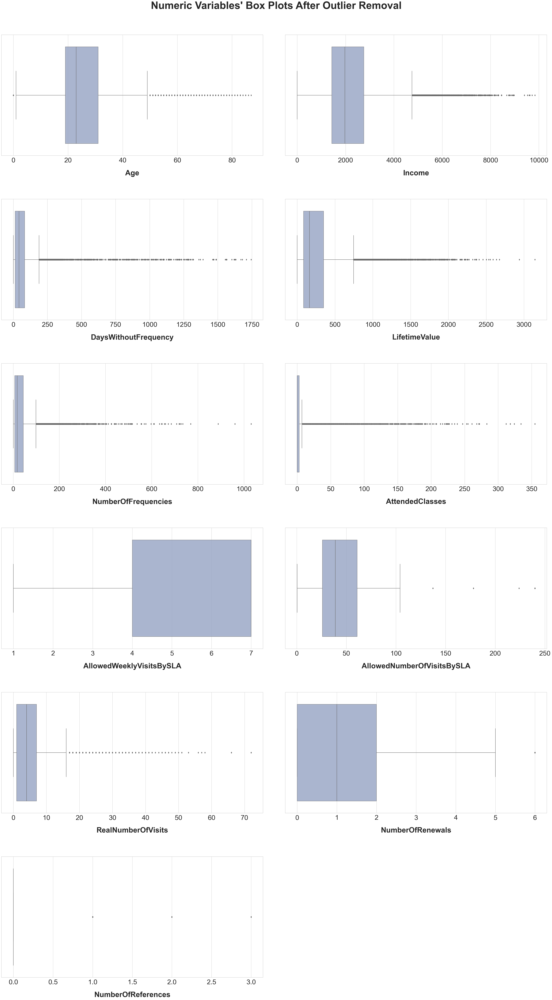

In [85]:
sns.set(font_scale=3)
sns.set_style("whitegrid")

# Get array of features
data = metric_features

a = 6  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(40, 70))

# Building the Histograms
for i in data:
    plt.subplot(a, b, c)
    plt.xlabel(i, fontweight="bold", labelpad=30)
    sns.boxplot(x=customers_df[i], color=sns.color_palette("Set2")[2], boxprops=dict(alpha=.8))
    c = c + 1

# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots After Outlier Removal"
plt.suptitle(title, fontsize=50, fontweight="bold")
plt.tight_layout(pad=3)

plt.show()

### <div id="data-normalization">2.3 Data Normalization - Min-Max Scale</div>

In [86]:
customers_minmax = customers_df.copy()

In [87]:
#Copies needed for cluster analysis
LTV_before_scale=customers_df['LifetimeValue'].copy()
NF_before_scale=customers_df['NumberOfFrequencies'].copy()
age_before_scale=customers_df['Age'].copy()

metric_for_cluster_before_scale = customers_df[['AttendedClasses', 'RealNumberOfVisits', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies']].copy()


In [88]:
# Use MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(customers_minmax[metric_features])
scaled_feat

array([[6.89655172e-01, 5.58943089e-01, 5.73065903e-04, ...,
        2.77777778e-02, 0.00000000e+00, 0.00000000e+00],
       [3.33333333e-01, 2.67276423e-01, 3.43839542e-02, ...,
        1.38888889e-02, 3.33333333e-01, 0.00000000e+00],
       [2.64367816e-01, 2.01219512e-01, 4.01146132e-03, ...,
        8.33333333e-02, 0.00000000e+00, 0.00000000e+00],
       ...,
       [4.48275862e-01,            nan, 2.17765043e-02, ...,
        4.16666667e-02, 0.00000000e+00, 0.00000000e+00],
       [2.29885057e-01, 1.83943089e-01, 1.14613181e-03, ...,
        1.11111111e-01, 0.00000000e+00, 0.00000000e+00],
       [3.67816092e-01, 3.76016260e-01, 8.02292264e-03, ...,
        1.80555556e-01, 6.66666667e-01, 0.00000000e+00]])

In [89]:
print("Parameters fitted:\n", scaler.data_min_, "\n", scaler.data_max_)

Parameters fitted:
 [0.   0.   0.   0.   1.   0.   1.   0.56 0.   0.   0.  ] 
 [8.70000e+01 9.84000e+03 1.74500e+03 3.14585e+03 1.03100e+03 3.55000e+02
 7.00000e+00 2.40030e+02 7.20000e+01 6.00000e+00 3.00000e+00]


In [90]:
customers_minmax[metric_features] = scaled_feat
customers_minmax.head()

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,TeamActivities,RacketActivities,CombatActivities,NatureActivities,SpecialActivities,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10000,0.689655,Female,0.558943,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,0.000573,0.028402,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.007767,0.019718,NaN,0.023886,0.027778,0.000000,0.0,0.0,0
10001,0.333333,Female,0.267276,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,0.034384,0.152328,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.021359,0.002817,0.166667,0.070405,0.013889,0.333333,0.0,0.0,1
10002,0.264368,Male,0.201220,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,0.004011,0.011952,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.004854,0.000000,1.000000,0.123063,0.083333,0.000000,0.0,0.0,1
10003,0.103448,Male,0.000000,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,0.012607,0.049398,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.018447,0.005634,0.166667,0.071658,0.041667,0.000000,0.0,0.0,1
10004,0.402299,Male,0.439024,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,0.120344,0.118632,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.038835,0.000000,1.000000,0.252265,0.000000,0.500000,0.0,0.0,1


In [91]:
customers_df = customers_minmax.copy()

In [92]:
customers_df[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14733.0,0.299490,0.161929,0.0,0.218391,0.264368,0.356322,1.0
Income,14589.0,0.221964,0.159869,0.0,0.145325,0.200203,0.280488,1.0
DaysWithoutFrequency,14733.0,0.046498,0.082293,0.0,0.007450,0.023496,0.047564,1.0
LifetimeValue,14733.0,0.093183,0.109170,0.0,0.026575,0.051878,0.110686,1.0
NumberOfFrequencies,14710.0,0.036364,0.058936,0.0,0.005825,0.016505,0.041748,1.0
AttendedClasses,14733.0,0.026108,0.074217,0.0,0.000000,0.000000,0.008451,1.0
AllowedWeeklyVisitsBySLA,14200.0,0.796854,0.351512,0.0,0.500000,1.000000,1.000000,1.0
AllowedNumberOfVisitsBySLA,14733.0,0.171500,0.086144,0.0,0.106109,0.160479,0.252265,1.0
RealNumberOfVisits,14733.0,0.073251,0.085693,0.0,0.013889,0.055556,0.097222,1.0
NumberOfRenewals,14733.0,0.197086,0.226932,0.0,0.000000,0.166667,0.333333,1.0


### <div id="filling-missing-values">2.4 Filling Missing Values</div>

In [93]:
b=customers_df.isna().sum()

In [94]:
missing_percentage=(b/customers_df.isnull().count())*100

In [95]:
missing_data = pd.DataFrame({'Missings values': b.sort_values(ascending=False), '% Missing values': missing_percentage.sort_values(ascending=False)})
missing_data= missing_data[missing_data["Missings values"]!=0]
print("\033[1mRemaining problems in missing data:\033[0m")
missing_data

Remaining problems in missing data:


,Missings values,% Missing values
AllowedWeeklyVisitsBySLA,533,3.617729
Income,144,0.977398
NatureActivities,47,0.319012
SpecialActivities,44,0.298649
RacketActivities,37,0.251137
WaterActivities,36,0.244349
AthleticsActivities,35,0.237562
OtherActivities,35,0.237562
DanceActivities,35,0.237562
FitnessActivities,35,0.237562


#### 2.4.1 Metric features <a class="anchor" id="metric-features"></a>

The only metric features that have missing values are :
* Income
* NumberOfFrequencies
* AllowedWeeklyVisitsBySLA <br>

**1) KNNImputer**

In [96]:
imputer = KNNImputer(n_neighbors=5)
df_imputerKNN=customers_df.copy()
imputer.fit(df_imputerKNN[metric_features])
df_imputerKNN[metric_features] = imputer.transform(df_imputerKNN[metric_features])

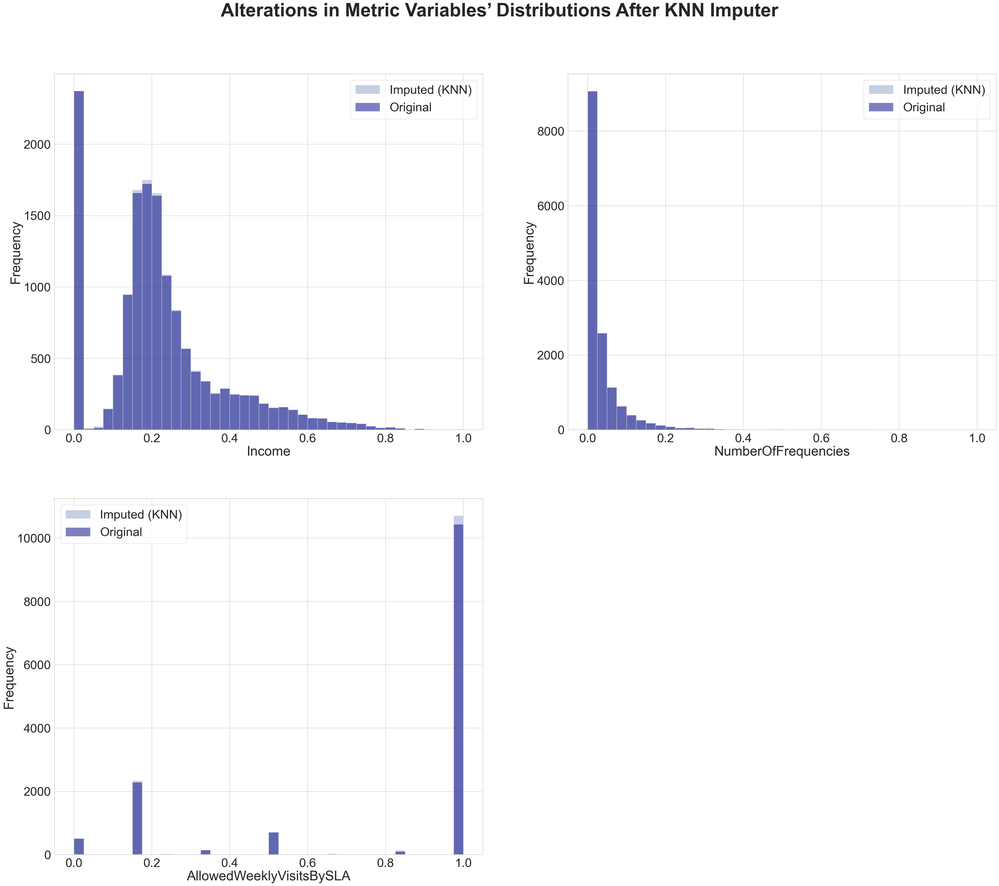

In [97]:
# Set seaborn color palette
sns.set_palette("Set2")
sns.set(font_scale=3)
sns.set_style("whitegrid")

# Set the figure size
fig = plt.figure(figsize=(40, 50))
fig.suptitle("Alterations in Metric Variables’ Distributions After KNN Imputer", fontsize=50, fontweight="bold")
a = 3  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter


# Variables to plot
variables = ["Income", "NumberOfFrequencies", "AllowedWeeklyVisitsBySLA"]

for i, variable in enumerate(variables, start=1):
    plt.subplot(a, b, c)
    df_imputerKNN[variable].plot.hist(bins=40, alpha=0.5, label='Imputed (KNN)', color=sns.color_palette("Set2")[2])
    customers_df[variable].plot.hist(bins=40, alpha=0.5, label='Original', color="navy")
    
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.legend()
    c = c + 1

# Adjust layout
plt.tight_layout( pad=3)


# Show the plot
plt.show()



**2) Median**

In [98]:
imputer = SimpleImputer(strategy='median')
df_imputermedian=customers_df.copy()
imputer.fit(df_imputermedian[metric_features])
df_imputermedian[metric_features] = imputer.transform(df_imputermedian[metric_features])

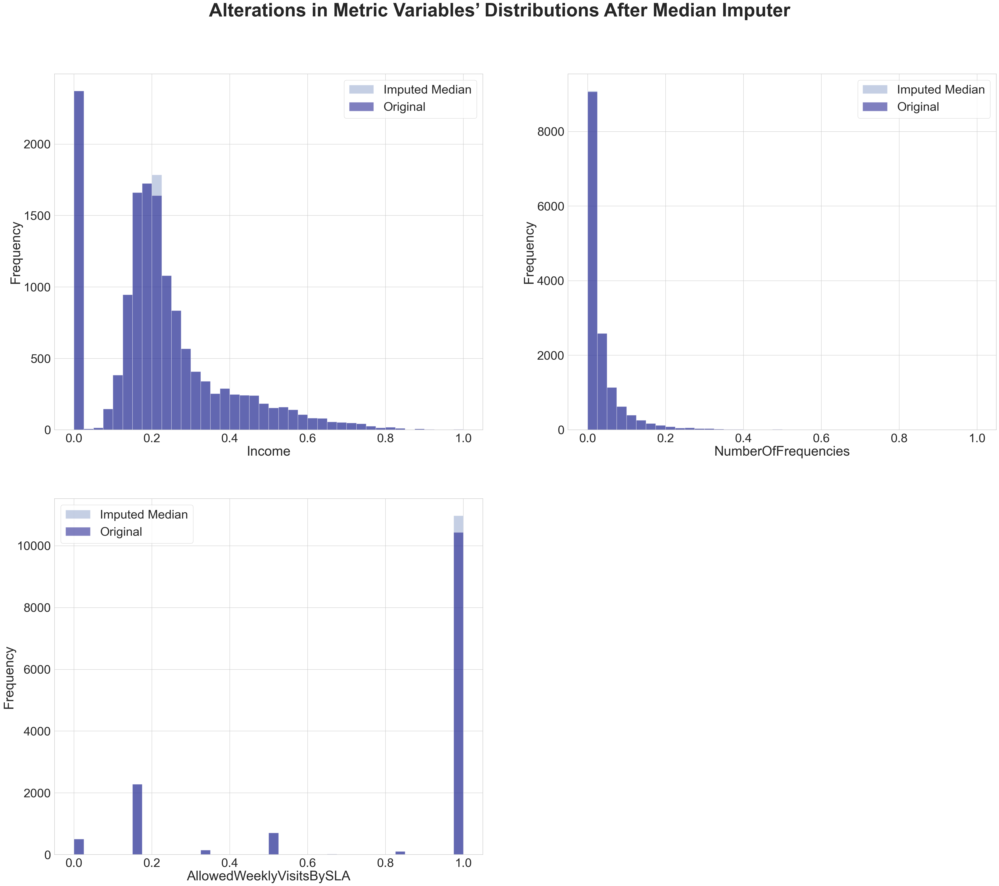

In [99]:
# Set seaborn color palette
sns.set_palette("Set2")
sns.set(font_scale=3)
sns.set_style("whitegrid")

# Set the figure size
fig = plt.figure(figsize=(40, 50))
fig.suptitle("Alterations in Metric Variables’ Distributions After Median Imputer", fontsize=50, fontweight="bold")
a = 3  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter


# Variables to plot
variables = ["Income", "NumberOfFrequencies", "AllowedWeeklyVisitsBySLA"]

for i, variable in enumerate(variables, start=1):
    plt.subplot(a, b, c)
    df_imputermedian[variable].plot.hist(bins=40, alpha=0.5, label='Imputed Median', color=sns.color_palette("Set2")[2])
    customers_df[variable].plot.hist(bins=40, alpha=0.5, label='Original', color="navy")
    
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.legend()
    c = c + 1

# Adjust layout
plt.tight_layout( pad=3)


# Show the plot
plt.show()


**Conclusion:** We decide to use the KNN imputer

In [100]:
customers_df=df_imputerKNN

In [101]:
customers_df[metric_features].isna().sum()

Age                           0
Income                        0
DaysWithoutFrequency          0
LifetimeValue                 0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
NumberOfReferences            0
dtype: int64

#### 2.4.1 Non-metric features <a class="anchor" id="non-metric-features"></a>

The ones with missing values are:
* NatureActivities
* SpecialActivities	
* RacketActivities
* WaterActivities	
* AthleticsActivities	
* DanceActivities	
* OtherActivities	
* FitnessActivities	
* TeamActivities	
* CombatActivities
* HasReferences	

According to our visual exploration of non-metric variables, some of these variables will be dropped because of how unbalanced they are, and consequently how irrelevant they are to explaining the variance of our problem:

* **Nature Activities** and **Dance Activities** are only present with the value 0 in our data and have no more than 0.3 % missing values, so even if we fill them with the value 1 it won´t impact our analysis.
* **OtherActivities** and **AthleticsActivities** are almost (in 99% of the cases) only present with the value 0 in our data and have no more than 0.3 % missing values, so even if we fill them with the value 1 it won´t impact our analysis.

In [102]:
customers_df = customers_df.drop('NatureActivities', axis=1)
customers_df = customers_df.drop('DanceActivities', axis=1)
customers_df = customers_df.drop('OtherActivities', axis=1)
customers_df = customers_df.drop('AthleticsActivities', axis=1)

In [103]:
non_metric_features.remove('NatureActivities')
non_metric_features.remove('DanceActivities')
non_metric_features.remove('OtherActivities')
non_metric_features.remove('AthleticsActivities')

In [104]:
customers_df[non_metric_features].isna().sum()

Dropout               0
HasReferences         0
SpecialActivities    44
CombatActivities     33
RacketActivities     37
TeamActivities       34
FitnessActivities    35
WaterActivities      36
UseByTime             0
Gender                0
EnrollmentStart       0
EnrollmentFinish      0
LastPeriodStart       0
LastPeriodFinish      0
DateLastVisit         0
dtype: int64

**Remaining variables:**
* SpecialActivities	
* RacketActivities
* WaterActivities		
* FitnessActivities	
* TeamActivities	
* CombatActivities
	

**1) Mode**

In [105]:
df_imputermode=customers_df.copy()
modes = df_imputermode[non_metric_features].mode().loc[0] 
df_imputermode=df_imputermode.fillna(modes)

In [106]:
variables = ["SpecialActivities", "RacketActivities", "WaterActivities", "FitnessActivities", "TeamActivities", "CombatActivities"]

for value in variables:
    print(f"For {value}:\n -> before the imputation\n", round(customers_df[value].value_counts(normalize=True),4))
    print(f"\n-> after the imputation\n", round(df_imputermode[value].value_counts(normalize=True),4))
    display("************************************")

For SpecialActivities:
 -> before the imputation
 SpecialActivities
0.0    0.9739
1.0    0.0261
Name: proportion, dtype: float64

-> after the imputation
 SpecialActivities
0.0    0.9739
1.0    0.0261
Name: proportion, dtype: float64


'************************************'

For RacketActivities:
 -> before the imputation
 RacketActivities
0.0    0.9766
1.0    0.0234
Name: proportion, dtype: float64

-> after the imputation
 RacketActivities
0.0    0.9767
1.0    0.0233
Name: proportion, dtype: float64


'************************************'

For WaterActivities:
 -> before the imputation
 WaterActivities
0.0    0.7086
1.0    0.2914
Name: proportion, dtype: float64

-> after the imputation
 WaterActivities
0.0    0.7093
1.0    0.2907
Name: proportion, dtype: float64


'************************************'

For FitnessActivities:
 -> before the imputation
 FitnessActivities
1.0    0.5807
0.0    0.4193
Name: proportion, dtype: float64

-> after the imputation
 FitnessActivities
1.0    0.5817
0.0    0.4183
Name: proportion, dtype: float64


'************************************'

For TeamActivities:
 -> before the imputation
 TeamActivities
0.0    0.9453
1.0    0.0547
Name: proportion, dtype: float64

-> after the imputation
 TeamActivities
0.0    0.9454
1.0    0.0546
Name: proportion, dtype: float64


'************************************'

For CombatActivities:
 -> before the imputation
 CombatActivities
0.0    0.8923
1.0    0.1077
Name: proportion, dtype: float64

-> after the imputation
 CombatActivities
0.0    0.8926
1.0    0.1074
Name: proportion, dtype: float64


'************************************'

**2) KNNClassifier**

In [107]:
variables_to_fill = ["SpecialActivities", "RacketActivities", "WaterActivities", "FitnessActivities", "TeamActivities", "CombatActivities"]
df_imputerKNN = customers_df.copy()

for categorical_column in variables_to_fill:
    # Extract the relevant data
    X_categorical = customers_df[categorical_column].copy()

    # Identify rows with missing values in the categorical column
    missing_rows = X_categorical.isnull()

    # Split the dataset into rows with and without missing values in the categorical column
    X_train_categorical = X_categorical[~missing_rows]
    X_test_categorical = X_categorical[missing_rows]

    # Prepare numerical data (assuming metric_features contains numerical columns without missing values)
    X_numerical = customers_df[metric_features].copy()

    # Initialize a KNeighborsClassifier
    classifier = KNeighborsClassifier()

    # Fit the classifier on the categorical columns with non-missing values
    classifier.fit(X_numerical[~missing_rows], X_train_categorical)

    # Predict missing values for the categorical column
    imputed_values = classifier.predict(X_numerical[missing_rows])

    # Fill the missing values in the original dataset with imputed values
    df_imputerKNN.loc[missing_rows, categorical_column] = imputed_values


In [108]:
variables = ["SpecialActivities", "RacketActivities", "WaterActivities", "FitnessActivities", "TeamActivities", "CombatActivities"]

for value in variables:
    print(f"For {value}:\n -> before the imputation\n", round(customers_df[value].value_counts(normalize=True),4))
    print(f"\n-> after the imputation\n", round(df_imputerKNN[value].value_counts(normalize=True),4))
    display("************************************")




For SpecialActivities:
 -> before the imputation
 SpecialActivities
0.0    0.9739
1.0    0.0261
Name: proportion, dtype: float64

-> after the imputation
 SpecialActivities
0.0    0.9739
1.0    0.0261
Name: proportion, dtype: float64


'************************************'

For RacketActivities:
 -> before the imputation
 RacketActivities
0.0    0.9766
1.0    0.0234
Name: proportion, dtype: float64

-> after the imputation
 RacketActivities
0.0    0.9767
1.0    0.0233
Name: proportion, dtype: float64


'************************************'

For WaterActivities:
 -> before the imputation
 WaterActivities
0.0    0.7086
1.0    0.2914
Name: proportion, dtype: float64

-> after the imputation
 WaterActivities
0.0    0.7085
1.0    0.2915
Name: proportion, dtype: float64


'************************************'

For FitnessActivities:
 -> before the imputation
 FitnessActivities
1.0    0.5807
0.0    0.4193
Name: proportion, dtype: float64

-> after the imputation
 FitnessActivities
1.0    0.5807
0.0    0.4193
Name: proportion, dtype: float64


'************************************'

For TeamActivities:
 -> before the imputation
 TeamActivities
0.0    0.9453
1.0    0.0547
Name: proportion, dtype: float64

-> after the imputation
 TeamActivities
0.0    0.9454
1.0    0.0546
Name: proportion, dtype: float64


'************************************'

For CombatActivities:
 -> before the imputation
 CombatActivities
0.0    0.8923
1.0    0.1077
Name: proportion, dtype: float64

-> after the imputation
 CombatActivities
0.0    0.8924
1.0    0.1076
Name: proportion, dtype: float64


'************************************'

**Conclusion:** We decided to use the RFC as imputer

In [109]:
customers_df=df_imputerKNN

In [110]:
customers_df.isna().sum()

Age                           0
Gender                        0
Income                        0
EnrollmentStart               0
EnrollmentFinish              0
LastPeriodStart               0
LastPeriodFinish              0
DateLastVisit                 0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
WaterActivities               0
FitnessActivities             0
TeamActivities                0
RacketActivities              0
CombatActivities              0
SpecialActivities             0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
dtype: int64

### <div id="feature-engineering">2.5 Feature Engeneering</div>


#### **1) Type of subscriptions**  

Based on the fact that *LastPeriodStart* is always at the beginning of a year or semester: January or Jully  and *LastPeriodFinish* is always at the end of a year or at the end of a semester: December or June. We will create a binary variable named _`annual_subscription`_  that take the values:
+ **1** if a customer has an annual subscription
+ **0** otherwise, i.e semester subscription

Let´s start by finding out whose customers have annual subscriptions and whose don´t.

In [111]:
customers_df['LastPeriodStart'] = pd.to_datetime(customers_df['LastPeriodStart'])
customers_df['LastPeriodFinish'] = pd.to_datetime(customers_df['LastPeriodFinish'])

**Annual**

In [112]:
# Filter rows where LastPeriodStart month is 1 and LastPeriodFinish month is 12 - Anual customers 
filtered_rows_anual = customers_df[((customers_df['LastPeriodStart'].dt.month == 1) & (customers_df['LastPeriodFinish'].dt.month == 12)) |
                                   ((customers_df['LastPeriodStart'].dt.month == 7) & (customers_df['LastPeriodFinish'].dt.month == 6))]


In [113]:
#Just to check if all the records occur in within the same year -ALL GOOD!
    #filtered_rows_anual['YearDifference'] = filtered_rows_anual['LastPeriodFinish'].dt.year - filtered_rows_anual['LastPeriodStart'].dt.year
    #filtered_rows_anual['YearDifference'].value_counts() 
        # 0: starsts in January and ends in december of the same year
        # 1: starts in July and ends in June of next year

In [114]:
filtered_rows_anual.shape[0] #=> anual subscriptions

5312

**Semester**

In [115]:
# Filter rows where LastPeriodStart month is 1 and LastPeriodFinish month is 12 - Anual customers 
filtered_rows_semester = customers_df[((customers_df['LastPeriodStart'].dt.month == 1) & (customers_df['LastPeriodFinish'].dt.month == 6)) |
                             ((customers_df['LastPeriodStart'].dt.month == 7) & (customers_df['LastPeriodFinish'].dt.month == 12))]

In [116]:
filtered_rows_semester.shape[0] #=> semester subscriptions

9421

In [117]:
#Checking if there are rows left
rest_of_rows = customers_df.shape[0] - filtered_rows_semester.shape[0] - filtered_rows_anual.shape[0]

# Display the number of remaining rows
print("Number of remaining rows in customers_df:", rest_of_rows)

# To actually get the remaining rows as a DataFrame, you can use the following:
remaining_rows_df = customers_df[~customers_df.index.isin(filtered_rows_semester.index) & ~customers_df.index.isin(filtered_rows_anual.index)]

Number of remaining rows in customers_df: 0


In [118]:
remaining_rows_df

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,,,,,,


**New variable**

In [119]:
customers_df['annual_subscription'] = 0

# Set 'annual_subscription' to 1 for rows in filtered_rows_anual
customers_df.loc[filtered_rows_anual.index, 'annual_subscription'] = 1

In [120]:
non_metric_features.append('annual_subscription')

#### **2) Type of customers** 

Given that   2019-12-31 is the most recent date of our data set (+) , we will consider that the most recent year of operation of the gym is 2019. <br>
(+) Check the max
* customers_df['LastPeriodFinish'].describe()
*  customers_df['DateLastVisit'].describe()
* customers_df['EnrollmentFinish'].describe()

So, we will create a new variable named _`new_in`_ that will highlight all the customers that enrolled in the year 2019 and didn´t drop out, i.e. new customers. The variable will take the values:
* **1** if it is a new customer
* **0** otherwise

**New costumers**

In [121]:
customers_df['EnrollmentStart'] = pd.to_datetime(customers_df['EnrollmentStart'])
# Filter rows where 'EnrollmentStart' year is 2019
enrollment_2019 = customers_df[(customers_df['EnrollmentStart'].dt.year == 2019)& (customers_df['Dropout'] == 0)]

In [122]:
enrollment_2019.shape[0] # New costumers

1025

In [123]:
# Create a new column 'new_in' and set it to 0 by default
customers_df['new_in'] = 0

# Set 'new_in' to 1 for rows that are in the 'enrollment_2019' subset
customers_df.loc[enrollment_2019.index, 'new_in'] = 1

In [124]:
non_metric_features.append('new_in')

#### **3) Customer for how long?**

We are going to  create a variable that stores the years that a specific customer has been with the gym, named   _`years_as_customer`_

In [125]:
customers_df['years_as_customer'] = (customers_df['DateLastVisit'] - customers_df['EnrollmentStart']).dt.days // 365

In [126]:
customers_df['NumberOfRenewals_not_scale']=customers['NumberOfRenewals'].copy()

In [127]:

def calculate_years(row):
    #besides "new ins" or "old ones" who drop out it shouldn't be 0
    #to cover the cases of customers that don´t drop but simply just never show up and still renewal their contratct
    if row['years_as_customer'] == 0: 
        if row['NumberOfRenewals_not_scale'] == 0:
            return 0
        elif row['EnrollmentStart'].month < 9: 
            return row['NumberOfRenewals_not_scale'] - 1 #
        else:
            return row['NumberOfRenewals_not_scale']
    else:
        return row['years_as_customer']

customers_df['years_as_customer'] = customers_df.apply(calculate_years, axis=1)


In [128]:
customers_df.drop(columns=['NumberOfRenewals_not_scale'], inplace=True)


In [129]:
#Check the inchoerences
customers_df.loc[(customers_df['years_as_customer'] == 0) & 
                 (customers_df['new_in'] == 0) & 
                 (customers_df['Dropout'] == 0), 
                 ['EnrollmentStart', 'EnrollmentFinish', 'DateLastVisit', 'new_in', 'Dropout']]


,EnrollmentStart,EnrollmentFinish,DateLastVisit,new_in,Dropout
ID,,,,,


In [130]:
yac_before_scale=customers_df['years_as_customer'].copy()
data_to_scale = customers_df['years_as_customer'].values.reshape(-1, 1)
scaled_data = scaler.fit_transform(data_to_scale)
customers_df['years_as_customer'] = scaled_data

In [131]:
metric_features.append('years_as_customer')

In [132]:
customers_df[metric_features].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14733.0,0.299490,0.161929,0.0,0.218391,0.264368,0.356322,1.0
Income,14733.0,0.222050,0.159558,0.0,0.145325,0.200203,0.280488,1.0
DaysWithoutFrequency,14733.0,0.046498,0.082293,0.0,0.007450,0.023496,0.047564,1.0
LifetimeValue,14733.0,0.093183,0.109170,0.0,0.026575,0.051878,0.110686,1.0
NumberOfFrequencies,14733.0,0.036378,0.058916,0.0,0.005825,0.016505,0.041748,1.0
AttendedClasses,14733.0,0.026108,0.074217,0.0,0.000000,0.000000,0.008451,1.0
AllowedWeeklyVisitsBySLA,14733.0,0.794310,0.351361,0.0,0.500000,1.000000,1.000000,1.0
AllowedNumberOfVisitsBySLA,14733.0,0.171500,0.086144,0.0,0.106109,0.160479,0.252265,1.0
RealNumberOfVisits,14733.0,0.073251,0.085693,0.0,0.013889,0.055556,0.097222,1.0
NumberOfRenewals,14733.0,0.197086,0.226932,0.0,0.000000,0.166667,0.333333,1.0


In [133]:
columns_to_drop = ['LastPeriodStart', 'LastPeriodFinish','EnrollmentStart', 'EnrollmentFinish','DateLastVisit']
customers_df.drop(columns=columns_to_drop, inplace=True)
for i in columns_to_drop:
    non_metric_features.remove(i)

#### **4) Number of Enrolled Activities**

We are going to  create a categorcial variable that represents the count of the most recent activities enrolled by a specific customer, named   _`total_activities`_:
* customers_df.loc[customers_df['total_activities'] == 0, 'total_activities'] = 'No recent activities enrolled'
* customers_df.loc[customers_df['total_activities'] == 1, 'total_activities'] = 'Single'
* customers_df.loc[customers_df['total_activities'] > 1, 'total_activities'] = 'Multiple'

In [134]:
activities=['SpecialActivities',
 'CombatActivities',
 'RacketActivities',
 'TeamActivities',
 'FitnessActivities',
 'WaterActivities']
customers_df['total_activities'] = customers_df[activities].sum(axis=1)

In [135]:
customers_df['total_activities'].value_counts()

total_activities
1.0    13419
2.0     1121
0.0       95
3.0       88
4.0        8
5.0        2
Name: count, dtype: int64

In [136]:
# Your DataFrame with the column containing numerical values
data = {
    'total_activities': [1.0, 2.0, 0.0, 3.0, 4,0, 5.0]
}


# Map numerical values to categorical labels
customers_df['total_activities'] = customers_df['total_activities'].map({0.0: 'None', 1.0: 'Single', 2.0: 'Multiple', 3.0: 'Multiple', 4.0: 'Multiple', 5.0: 'Multiple'})


In [137]:
customers_df['total_activities'].value_counts()

total_activities
Single      13419
Multiple     1219
None           95
Name: count, dtype: int64

In [138]:
non_metric_features.append('total_activities')

#### **5) Other Enrolled Activities** 

In [139]:
activities=['SpecialActivities',
 'CombatActivities',
 'RacketActivities',
 'TeamActivities']
customers_df['other_activities'] = customers_df[activities].any(axis=1).astype(int)

In [140]:
customers_df['other_activities'].value_counts()

other_activities
0    11696
1     3037
Name: count, dtype: int64

In [141]:
non_metric_features.append('other_activities')

In [142]:
columns_to_drop=activities
customers_df=customers_df.drop(columns_to_drop,axis=1)
non_metric_features.remove('TeamActivities')
non_metric_features.remove('RacketActivities')
non_metric_features.remove('CombatActivities')
non_metric_features.remove('SpecialActivities')

### <div id="encoding">2.6 Encoding</div>

In [143]:
#1 - gender 
# Assuming 'Male' is 1 and 'Female' is 0
gender_mapping = {'Male': 1, 'Female': 0}

# Apply the mapping to the 'Gender' column
customers_df['Gender'] = customers_df['Gender'].map(gender_mapping)
customers_df['Gender'] = customers_df['Gender'].astype(int)
#2 - Total Activities
activities_mapping = {'None': 0, 'Single': 1,'Multiple': 2}

# Apply the mapping to the 'TotalActivities' column
customers_df['total_activities'] = customers_df['total_activities'].map(activities_mapping)




In [144]:
ta_before_scalling=customers_df['total_activities'].copy()
data_to_scale = customers_df['total_activities'].values.reshape(-1, 1)
scaled_data = scaler.fit_transform(data_to_scale)
customers_df['total_activities'] = scaled_data

In [145]:
customers_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,14733.0,0.299490,0.161929,0.0,0.218391,0.264368,0.356322,1.0
Gender,14733.0,0.401751,0.490269,0.0,0.000000,0.000000,1.000000,1.0
Income,14733.0,0.222050,0.159558,0.0,0.145325,0.200203,0.280488,1.0
DaysWithoutFrequency,14733.0,0.046498,0.082293,0.0,0.007450,0.023496,0.047564,1.0
LifetimeValue,14733.0,0.093183,0.109170,0.0,0.026575,0.051878,0.110686,1.0
UseByTime,14733.0,0.049481,0.216877,0.0,0.000000,0.000000,0.000000,1.0
WaterActivities,14733.0,0.291455,0.454448,0.0,0.000000,0.000000,1.000000,1.0
FitnessActivities,14733.0,0.580737,0.493455,0.0,0.000000,1.000000,1.000000,1.0
NumberOfFrequencies,14733.0,0.036378,0.058916,0.0,0.005825,0.016505,0.041748,1.0
AttendedClasses,14733.0,0.026108,0.074217,0.0,0.000000,0.000000,0.008451,1.0


### <div id="feature-selection">2.7 Feature Selection</div>

In [146]:
#1.1 NumberOfReferences: After analyzing the histogram, and box plot, seeing that this variable is not correlated with any variable, and also realizing that it has 98% =0.
customers_df = customers_df.drop('NumberOfReferences', axis=1)
metric_features.remove('NumberOfReferences')

#1.2 AllowedWeeklyVisitsBySLA & AllowedNumberOfVisitsBySLA: they are not really relevent to our study, because what really metters is the real attendeces of costumers to the gym and, as we saw in the correlation matrix they are not correlated with any of thes variables
customers_df = customers_df.drop('AllowedNumberOfVisitsBySLA', axis=1)
metric_features.remove('AllowedNumberOfVisitsBySLA')
customers_df = customers_df.drop('AllowedWeeklyVisitsBySLA', axis=1)
metric_features.remove('AllowedWeeklyVisitsBySLA')



### <div id="redoing-data-exploration">2.8 Redoing Data Exploration</div>

In [147]:
ProfileReport(
    customers_df,
    title='Customers Data Preprocessed',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=13.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

locator: <matplotlib.ticker.AutoLocator object at 0x000001D4DD0E6050>


findfont: Matching sans\-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=20.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACON

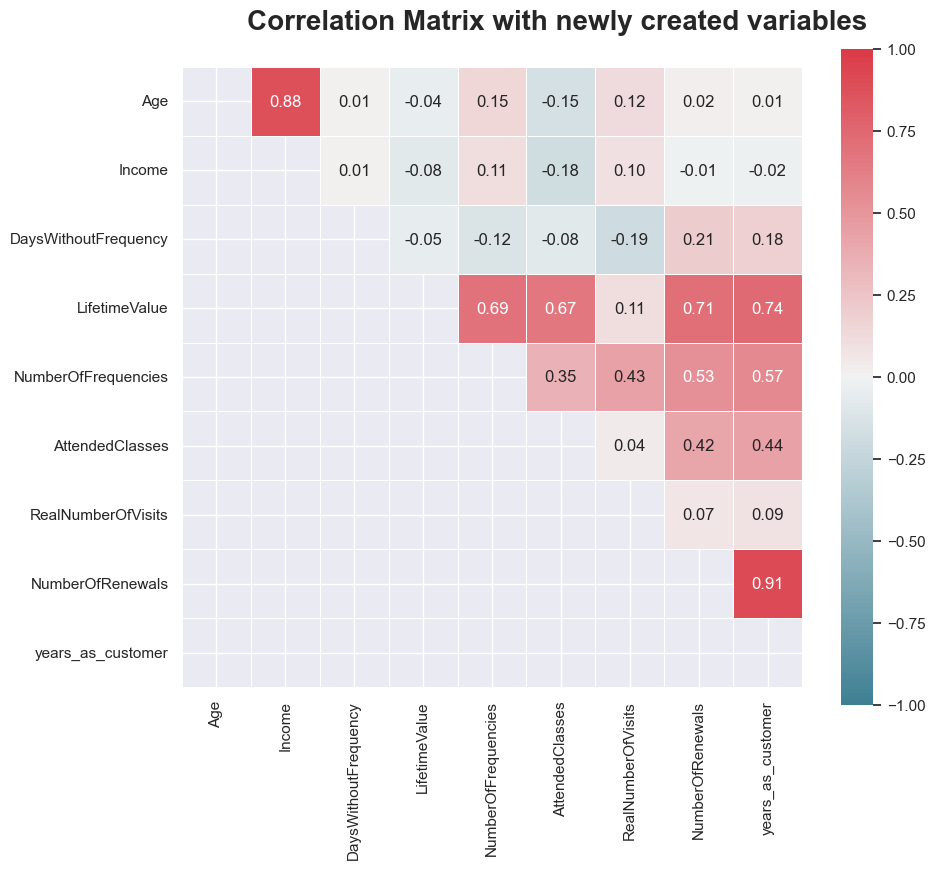

In [148]:
sns.set()

# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix, rounding the values to 2 decimal cases
corr = np.round(customers_df[metric_features].corr(method="pearson"), decimals=2)

# Getting the Lower Triangle of the correlation matrix
mask = np.tril(np.ones_like(corr, dtype=bool))

# Plot heatmap of the correlation matrix in the lower triangle
sns.heatmap(data=corr, 
            annot=True, 
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            fmt='.2f', 
            vmin=-1, 
            vmax=1, 
            center=0, 
            square=True, 
            linewidths=.5, 
            mask=mask)

# Layout
fig.subplots_adjust(top=0.93)
fig.suptitle("Correlation Matrix with newly created variables", fontsize=20, fontweight="bold")

plt.show()


**More Preprocessing needed:** <br>
* **Feature Selection**: <br>

    **1) Eliminating highly correlated variables that may indicate redundancy:**
    * *NumberOfRenewals* and *years_as_costumer*: we decided to drop *NumberOfRenewals* since we considered that it is less important to our analysis.
    * *Income* and *Age*: We opted to exclude *Income* as it appeared less relevant to our objective compared to *Age*. Additionally, *Income* exhibited a higher percentage of missing values from the outset of our exploration, indicating potential artificial or incomplete data, unlike *Age*. <br>
    
    **2) Eliminating highly unbalanced variables**
    *    *HasReferences*
    

In [149]:
customers_df = customers_df.drop('NumberOfRenewals', axis=1)
metric_features.remove('NumberOfRenewals')

In [150]:
customers_df = customers_df.drop('Income', axis=1)
metric_features.remove('Income')

In [151]:
customers_df = customers_df.drop('HasReferences', axis=1)
non_metric_features.remove('HasReferences')

locator: <matplotlib.ticker.AutoLocator object at 0x000001D4DD2FDDD0>


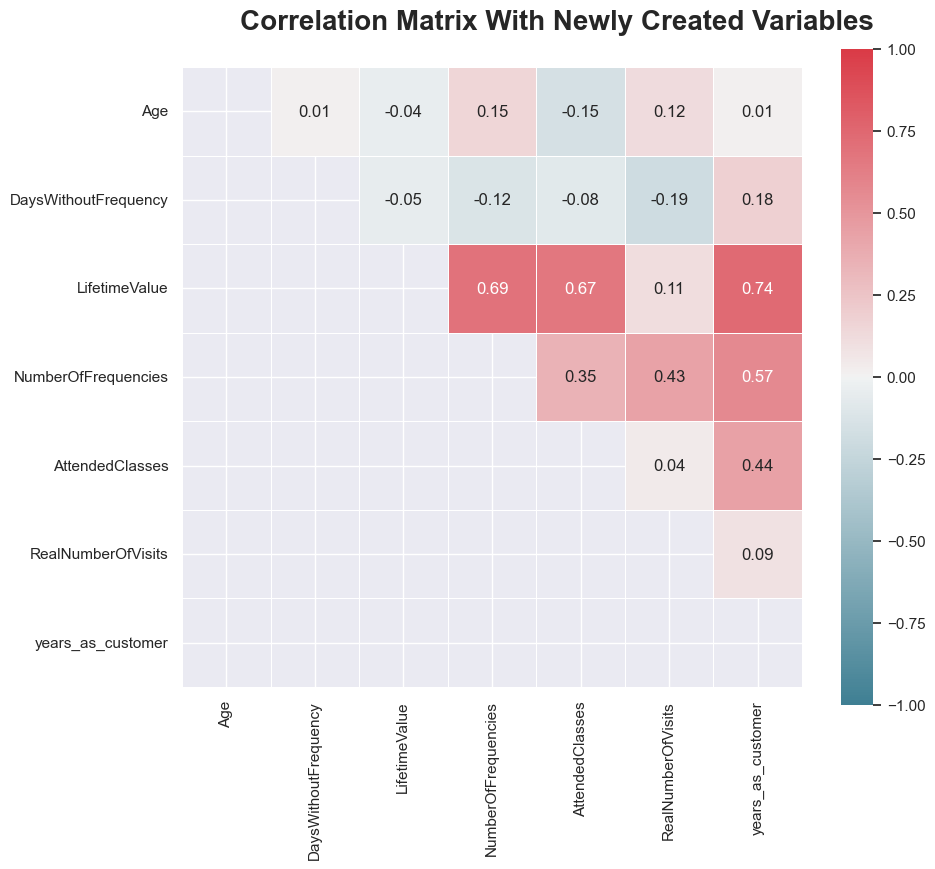

In [152]:
sns.set()

# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix, rounding the values to 2 decimal cases
corr = np.round(customers_df[metric_features].corr(method="pearson"), decimals=2)

# Getting the Lower Triangle of the correlation matrix
mask = np.tril(np.ones_like(corr, dtype=bool))

# Plot heatmap of the correlation matrix in the lower triangle
sns.heatmap(data=corr, 
            annot=True, 
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            fmt='.2f', 
            vmin=-1, 
            vmax=1, 
            center=0, 
            square=True, 
            linewidths=.5, 
            mask=mask)

# Layout
fig.subplots_adjust(top=0.93)
fig.suptitle("Correlation Matrix With Newly Created Variables", fontsize=20, fontweight="bold")

plt.show()


locator: <matplotlib.ticker.AutoLocator object at 0x000001D4DDD19890>


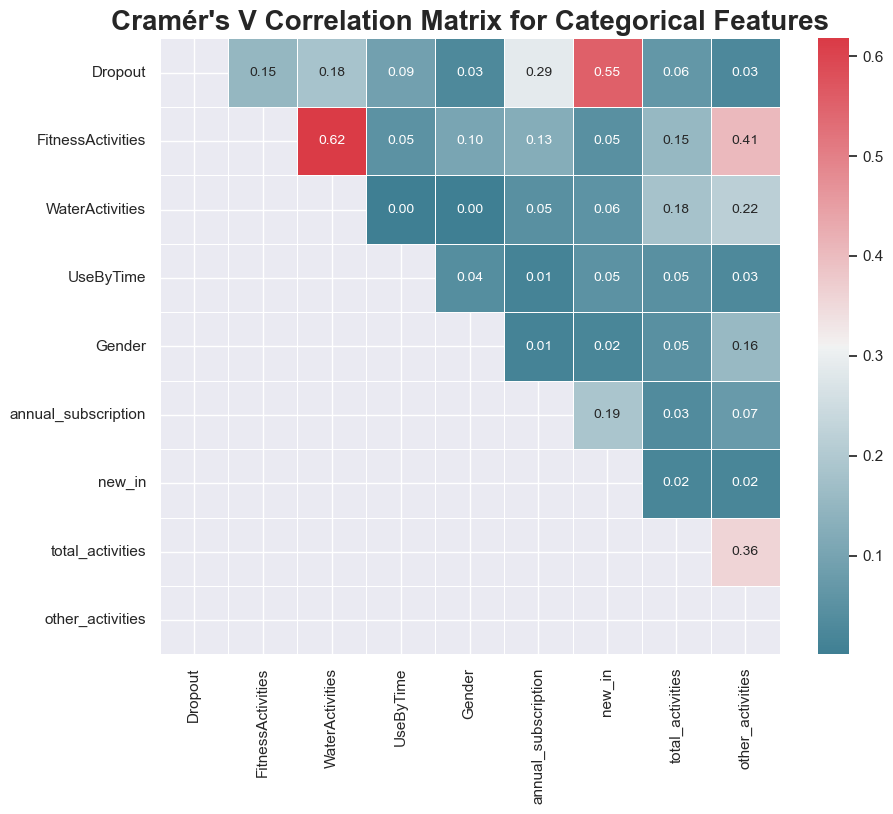

In [153]:
# Create an empty matrix to store the correlation values
correlation_matrix = pd.DataFrame(index=non_metric_features, columns=non_metric_features)

# Calculate Cramer's V for each pair of categorical variables
for feature1 in non_metric_features:
    for feature2 in non_metric_features:
        contingency_table = pd.crosstab(customers_df[feature1], customers_df[feature2])
        chi2, _, _, _ = chi2_contingency(contingency_table)
        n = contingency_table.sum().sum()
        correlation = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))
        correlation_matrix.loc[feature1, feature2] = correlation

# Display the correlation matrix
sns.set()
plt.figure(figsize=(10, 8))

# Create a mask to display only the lower triangular part
mask = np.tril(np.ones(correlation_matrix.shape)).astype(bool)

sns.heatmap(data=correlation_matrix.astype(float),
            annot=True,
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            fmt='.2f',
            linewidths=0.5,
            annot_kws={"size": 10},
            mask=mask)  # Apply the mask to display only the lower triangular part

plt.title("Cramér's V Correlation Matrix for Categorical Features", fontsize=20, fontweight="bold")
plt.show()


## <div id="modelling">3. Modelling</div>

The following functions that will be helpful to make and evaluate our clusters.

Returns the **sum of squares** for all variables given a dataframe:

In [154]:
def get_ss(df):
    return np.sum(df.var() * (df.count() - 1))  # return sum of sum of squares of each df variable

Returns the **r2 score**:

In [155]:
def r2(df, labels):
    return 1 - (np.sum(df.groupby(labels).apply(get_ss)))/(get_ss(df)) # Return the r2

In [156]:
def get_r2_scores(df, clusterer, min_k=1, max_k=6):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    
    # Iterate over number of clusters
    for n in range(min_k, max_k+1):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
        
    return r2_clust

Plots the **r2 scores**:

In [157]:
def plot_r2_scores(df):
    max_nclus = 5
    
    hierarchical = AgglomerativeClustering(metric='euclidean')
    
    r2_scores = {}
    
    hc_methods = ["ward", "complete", "average", "single"]   
    for linkage in hc_methods:
        hierarchical.set_params(linkage=linkage)
        r2_scores[linkage] = get_r2_scores(df, hierarchical, max_k=max_nclus)    
    
    r2_hc_methods = pd.DataFrame(r2_scores)
    
    sns.set()
    # Plot data
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

    # Finalize the plot
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)

    plt.show()



Return the **silhouette score**:

In [158]:
def silhouette(df, labels):
    return silhouette_score(df, labels, metric='euclidean')

Plot the **silhouette scores**:

In [159]:
def plot_silhouette(df):

    avg_silhouette = []
    for nclus in range_clusters:
        # Skip nclus == 1
        if nclus == 1:
            continue

        # Create a figure
        fig = plt.figure(figsize=(13, 7))

        # Initialize the KMeans object with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(df)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(df, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(df, cluster_labels)

        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            # Get y_upper to demarcate silhouette y range size
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Filling the silhouette
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        plt.title("The silhouette plot for the various clusters.")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")

        # The silhouette coefficient can range from -1, 1
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])

        # The (nclus+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        plt.ylim([0, len(df) + (nclus + 1) * 10])

        plt.yticks([])  # Clear the yaxis labels / ticks
        plt.xticks(np.arange(xmin, xmax, 0.1))

        

### <div id="segmentation">3.1 Definining The Segmentation Perspectives </div>


In [160]:
customers_df.columns

Index(['Age', 'Gender', 'DaysWithoutFrequency', 'LifetimeValue', 'UseByTime',
       'WaterActivities', 'FitnessActivities', 'NumberOfFrequencies',
       'AttendedClasses', 'RealNumberOfVisits', 'Dropout',
       'annual_subscription', 'new_in', 'years_as_customer',
       'total_activities', 'other_activities'],
      dtype='object')

For an easier cluster analysis, we have divided our clustering into two perspectives:

- __Service Usage:__ Divides the customers based on their needs, attitudes and interests, taking into consideration their service usage in terms of value and quantity.
    - _Variables used:_  'WaterActivities', 'FitnessActivities', 'total_activities', 'other_activities','LifetimeValue','NumberOfFrequcies'

- __Engagement Level:__  Group customers based on their participation in activities ==> segment customers based on their activity involvement and retention to strategize engagement improvement or customer retention programs.
    - _Variables used:_  'AttendedClasses', 'RealNumberOfVisits' 'DaysWithoutFrequency'

    

In [161]:
service_usage = customers_df[['WaterActivities', 'FitnessActivities', 'total_activities', 'other_activities', 'LifetimeValue', 'NumberOfFrequencies']].reset_index(drop=True)

engagement_level = customers_df[['AttendedClasses', 'RealNumberOfVisits', 'DaysWithoutFrequency']].reset_index(drop=True)

### <div id="serviceusageperspective">3.2 Perspective 1: Services Usage </div>

In [162]:
service_usage.columns

Index(['WaterActivities', 'FitnessActivities', 'total_activities',
       'other_activities', 'LifetimeValue', 'NumberOfFrequencies'],
      dtype='object')

#### <div id="kproto">3.2.1 KPrototypes</div>

`KPrototypes` is an extension of the K-Means algorithm used for clustering data that contains both numerical and categorical features. While traditional K-Means is effective for numerical data, it struggles with categorical or mixed data due to its reliance on Euclidean distances, which don't apply to non-numeric variables.

K-Prototypes combines K-Means for numerical data with K-Modes (a clustering algorithm for categorical data) to handle mixed data types. It defines a dissimilarity measure that considers both numerical (Euclidean distance) and categorical (matching dissimilarity) features when clustering.

The algorithm minimizes a cost function that considers the sum of dissimilarities of numerical attributes (using Euclidean distance) and categorical attributes (using matching dissimilarity). This combined approach allows K-Prototypes to efficiently cluster datasets with a mix of numerical and categorical features.

It's commonly used when dealing with real-world datasets that contain a mixture of these data types, providing a more robust clustering method than traditional K-Means for such scenarios.

In [163]:
# Assuming 'customers_df' contains your data

# Selecting binary categorical columns
binary_cat_features =  ['WaterActivities', 'FitnessActivities', 'other_activities', 'total_activities']

# Selecting numerical feature
num_features = ['LifetimeValue', 'NumberOfFrequencies']  # Continuous/numerical feature

# Combining numerical and categorical features for K-Prototypes
X = service_usage.values


In [164]:
customers_df.total_activities.value_counts(normalize=True)

total_activities
0.5    0.910812
1.0    0.082739
0.0    0.006448
Name: proportion, dtype: float64

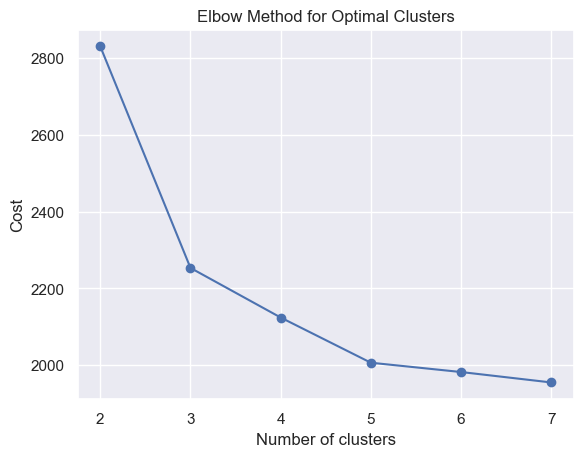

In [299]:
costs = []
# Testing different numbers of clusters
clusters = range(2, 8)  # Adjust this range as needed

for k in clusters:
    kproto = KPrototypes(n_clusters=k, init='Cao', verbose=0)
    kproto.fit_predict(X, categorical=list(range(1, len(binary_cat_features) + 1)))
    costs.append(kproto.cost_)

# Plot the cost against number of clusters
plt.plot(clusters, costs, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal Clusters')
plt.show()

**Conclusion:** Given this we will chose 3


In [177]:
# Applying K-Prototypes clustering
kproto = KPrototypes(n_clusters=3, init='Cao', verbose=2)
kproto_labels = kproto.fit_predict(X, categorical=list(range(1, len(binary_cat_features) + 1)))

# Assign cluster labels back to the dataframe
kproto  = pd.concat((service_usage, pd.Series(kproto_labels, name='kproto_labels')), axis=1)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 237, ncost: 2253.259210357467
Run: 1, iteration: 2/100, moves: 9, ncost: 2253.2592087217386
Run: 1, iteration: 3/100, moves: 0, ncost: 2253.2592087217386
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 373, ncost: 2253.25920967433
Run: 2, iteration: 2/100, moves: 7, ncost: 2253.2592087217386
Run: 2, iteration: 3/100, moves: 0, ncost: 2253.2592087217386
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 2505, ncost: 2253.260476933193
Run: 3, iteration: 2/100, moves: 77, ncost: 2253.2592087217386
Run: 3, iteration: 3/100, moves: 0, ncost: 2253.2592087217386
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 4, iteration: 1/100, moves: 240, ncos

In [178]:
#F.Abs
cluster_counts = kproto['kproto_labels'].value_counts()
cluster_counts

kproto_labels
0    7850
2    4294
1    2589
Name: count, dtype: int64

In [179]:
# Grouping the data by 'Cluster'
cluster_groups = kproto.groupby('kproto_labels')

# Calculating mode for each categorical feature within each cluster
cluster_modes = cluster_groups[binary_cat_features].agg(lambda x: stats.mode(x)[0][0])

# Transposing the DataFrame to have features as columns and clusters as rows
cluster_modes = cluster_modes.transpose()

# Displaying mode for each categorical feature within each cluster
print(cluster_modes)

kproto_labels        0    1    2
WaterActivities    0.0  0.0  1.0
FitnessActivities  1.0  0.0  0.0
other_activities   0.0  1.0  0.0
total_activities   0.5  0.5  0.5


C:\Users\maria\AppData\Local\Temp\ipykernel_12352\375697470.py:5: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  cluster_modes = cluster_groups[binary_cat_features].agg(lambda x: stats.mode(x)[0][0])


In [180]:
# Grouping the data by 'Cluster'
kproto['LifetimeValue_no_scaled'] = LTV_before_scale

cluster_groups = kproto.groupby('kproto_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['LifetimeValue_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats


,mean,median,std,min,max
kproto_labels,,,,,
0,296.791862,168.60,341.766873,3.6,2636.77
1,284.543075,150.60,338.929496,20.9,2209.97
2,281.122500,164.05,320.895107,1.3,2362.30


In [181]:
kproto=kproto.drop('LifetimeValue_no_scaled',axis=1)

In [182]:
# Grouping the data by 'Cluster'
kproto['NF_no_scaled'] = NF_before_scale

cluster_groups = kproto.groupby('kproto_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['NF_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats

,mean,median,std,min,max
kproto_labels,,,,,
0,38.010608,18.0,58.863383,1.0,719.0
1,39.700119,18.0,60.739775,1.0,516.0
2,36.873638,18.0,53.600672,1.0,643.0


In [183]:
kproto=kproto.drop('NF_no_scaled',axis=1)

In [184]:
final_features_seg1=kproto.columns

In [185]:
kproto[final_features_seg1].isna().sum()

WaterActivities        0
FitnessActivities      0
total_activities       0
other_activities       0
LifetimeValue          0
NumberOfFrequencies    0
kproto_labels          0
dtype: int64

In [186]:
two_dim_1st_seg = TSNE(random_state=42).fit_transform(kproto[final_features_seg1])

In [187]:
colors = ["blue","white","red"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2']

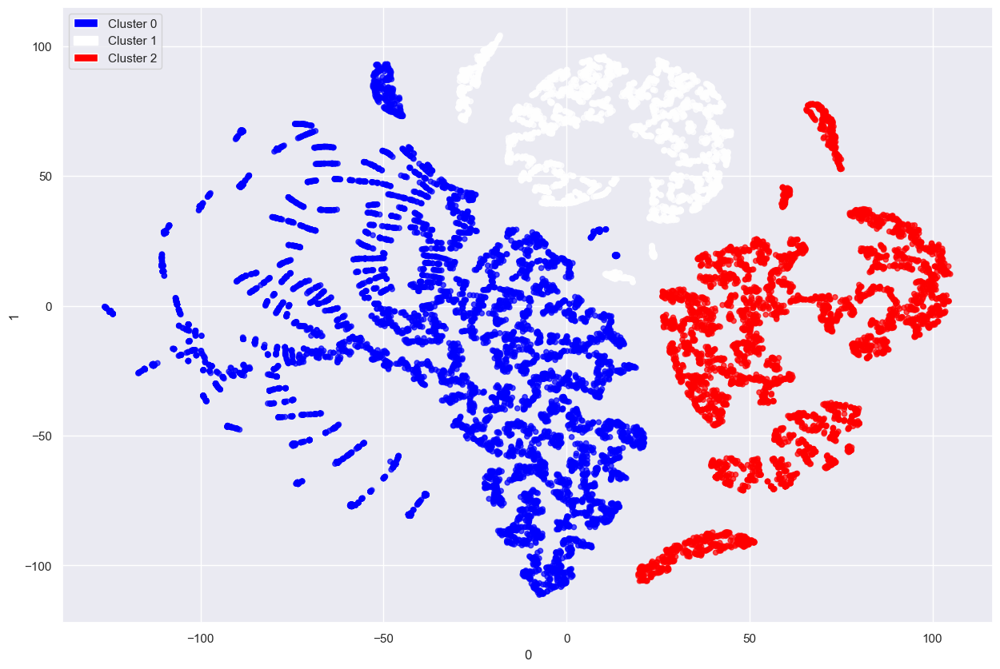

In [188]:
# Map the values in the merged_labels column to the corresponding colors
color_map = kproto['kproto_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_1st_seg).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

### <div id="engagementlevelperspective">3.3  Perspective 2: Engagement Level

In [189]:
engagement_level.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
0,0.019718,0.027778,0.000573
1,0.002817,0.013889,0.034384
2,0.000000,0.083333,0.004011
3,0.005634,0.041667,0.012607
4,0.000000,0.000000,0.120344


#### <div id="hierarchical">3.3.1 Hierarchical Method </div>

Let's start by defining which **linkage method** we are going to use.

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=21.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

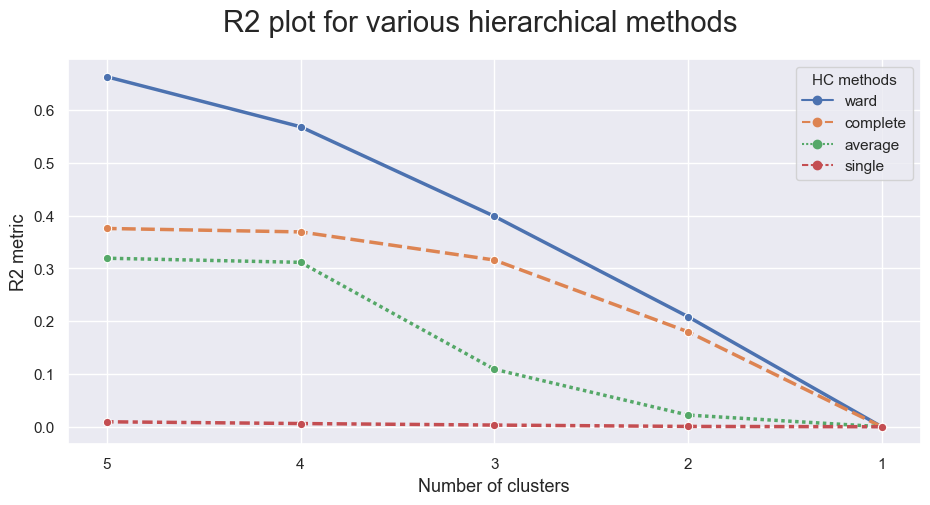

In [190]:
plot_r2_scores(engagement_level)

As we can see, **Ward** is by far the best linkage method, therefore it will be the one used.

In [191]:
linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(engagement_level)

array([10295, 14732, 14731, ...,     1,     2,     0], dtype=int64)

Let's now plot a **dendrogram**, which will help us choose the best number of clusters.

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=6.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA

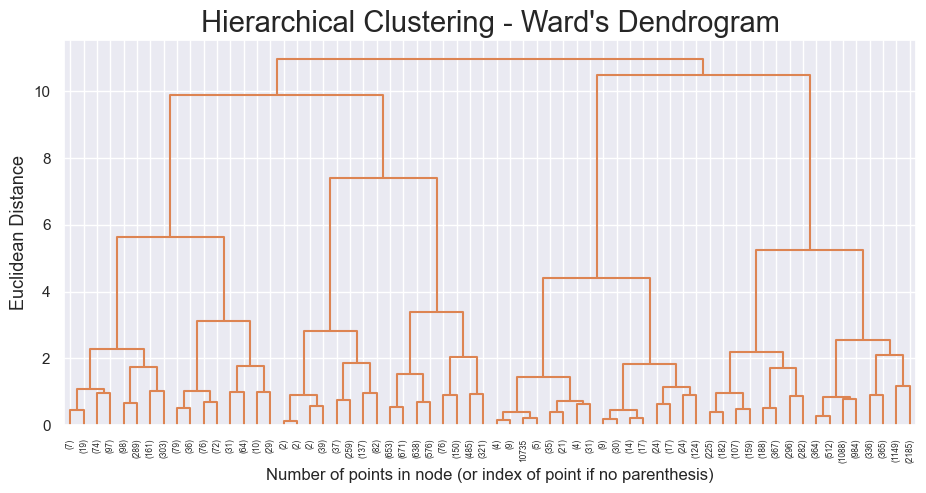

In [192]:
# Create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# Loop to track the number of observations in each formed cluster
for i, merge in enumerate(hclust.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([hclust.children_, hclust.distances_, counts]).astype(float)

# Plotting the dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
y_threshold = 12  # Set the threshold
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

Upon further investigation, the best number of clusters vary from 5 to 8. To know which one we should use, we'll calculate the r2 score for each number of clusters, and the higher one is the best number

In [193]:
# 5 cluster solution
hierarc_value_5= AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=5)
hierarc_value_5_labels = hierarc_value_5.fit_predict(engagement_level)

# Characterizing the 5 clusters
hierarc_value_5= pd.concat((engagement_level, pd.Series(hierarc_value_5_labels, name='hierarc_labels')), axis=1)
hierarc_value_5.groupby('hierarc_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
hierarc_labels,,,
0,0.201817,0.085179,0.016009
1,0.008025,0.029496,0.048246
2,0.023329,0.040425,0.441949
3,0.002960,0.132894,0.019162
4,0.005931,0.370610,0.011415


In [194]:
r2_hierarc_value_5 = round(r2(engagement_level, hierarc_value_5_labels),4)
silhouette_hierarc_value_5 = round(silhouette(engagement_level, hierarc_value_5_labels),4)

print(f'R2 score: {r2_hierarc_value_5}')
print(f'Silhouette score: {silhouette_hierarc_value_5}')

R2 score: 0.6631
Silhouette score: 0.3858


In [195]:
# 6 cluster solution
hierarc_value_6= AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=6)
hierarc_value_6_labels = hierarc_value_6.fit_predict(engagement_level)

# Characterizing the 6 clusters
hierarc_value_6= pd.concat((engagement_level, pd.Series(hierarc_value_6_labels, name='hierarc_labels')), axis=1)
hierarc_value_6.groupby('hierarc_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
hierarc_labels,,,
0,0.008025,0.029496,0.048246
1,0.002960,0.132894,0.019162
2,0.023329,0.040425,0.441949
3,0.371739,0.085013,0.017681
4,0.005931,0.370610,0.011415
5,0.137448,0.085242,0.015375


In [196]:
r2_hierarc_value = round(r2(engagement_level, hierarc_value_6_labels),4)
silhouette_hierarc_value = round(silhouette(engagement_level, hierarc_value_6_labels),4)

print(f'R2 score: {r2_hierarc_value}')
print(f'Silhouette score: {silhouette_hierarc_value}')

R2 score: 0.7178
Silhouette score: 0.3947


In [197]:
# 7 cluster solution
hierarc_value_7= AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=7)
hierarc_value_7_labels = hierarc_value_7.fit_predict(engagement_level)
# Characterizing the 7 clusters
hierarc_value_7= pd.concat((engagement_level, pd.Series(hierarc_value_7_labels, name='hierarc_labels')), axis=1)
hierarc_value_7.groupby('hierarc_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
hierarc_labels,,,
0,0.023329,0.040425,0.441949
1,0.002960,0.132894,0.019162
2,0.009163,0.028488,0.028131
3,0.371739,0.085013,0.017681
4,0.005931,0.370610,0.011415
5,0.137448,0.085242,0.015375
6,0.003628,0.033392,0.126024


In [198]:

r2_hierarc_value_7 = round(r2(engagement_level, hierarc_value_7_labels),4)
silhouette_hierarc_value_7 = round(silhouette(engagement_level, hierarc_value_7_labels),4)

print(f'R2 score: {r2_hierarc_value_7}')
print(f'Silhouette score: {silhouette_hierarc_value_7}')

R2 score: 0.7656
Silhouette score: 0.4063


In [199]:
# 8 cluster solution
hierarc_value_8= AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=8)
hierarc_value_8_labels = hierarc_value_8.fit_predict(engagement_level)
# Characterizing the 8 clusters
hierarc_value_8= pd.concat((engagement_level, pd.Series(hierarc_value_8_labels, name='hierarc_labels')), axis=1)
hierarc_value_8.groupby('hierarc_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
hierarc_labels,,,
0,0.002960,0.132894,0.019162
1,0.371739,0.085013,0.017681
2,0.009163,0.028488,0.028131
3,0.027114,0.033194,0.336410
4,0.005931,0.370610,0.011415
5,0.137448,0.085242,0.015375
6,0.003628,0.033392,0.126024
7,0.014417,0.057449,0.690445


In [200]:
r2_hierarc_value_8 = round(r2(engagement_level, hierarc_value_8_labels),4)
silhouette_hierarc_value_8 = round(silhouette(engagement_level, hierarc_value_8_labels),4)

print(f'R2 score: {r2_hierarc_value_8}')
print(f'Silhouette score: {silhouette_hierarc_value_8}')

R2 score: 0.7993
Silhouette score: 0.4099


**Conclusion:** Let´s use **8 clusters**

In [201]:
engagement_level_cluster_evaluation = pd.DataFrame((np.array([('Hierarchical',8, r2_hierarc_value_8, 
                                                silhouette_hierarc_value_8)])),
                          columns=['Method','Clusters','R*2','Silhouette'])
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099


#### <div id="k-means">3.3.2 K-Means </div>

Firstly, lets define the number of clusters by calculating the inertia:

In [202]:
range_clusters = range(1, 11)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1) 
    # fit the clusterer
    kmclust.fit(engagement_level)
    inertia.append(kmclust.inertia_)

inertia

[289.09682009178056,
 220.17049377605318,
 160.9336322824911,
 107.93932645800277,
 86.0504422374544,
 67.55213296621318,
 55.47545247230485,
 48.11937651630484,
 43.884386227026944,
 39.9243378186417]

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.0.
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACONDA\\envs\\environment_dm\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansDisplay.ttf', name='DejaVu Sans Display', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\maria\\Documents\\ANACOND

findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\GeorgiaPro-CondBold.ttf', name='Georgia Pro', style='normal', variant='normal', weight=700, stretch='condensed', size='scalable')) = 10.535
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\simsunb.ttf', name='SimSun-ExtB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\BOD_CR.TTF', name='Bodoni MT', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\WINDOWS\\Fonts\\RockwellNova-Light.ttf', name='Rockwell Nova', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibriz.ttf', name='Calibri', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHICB.TTF', name='Century Gothic

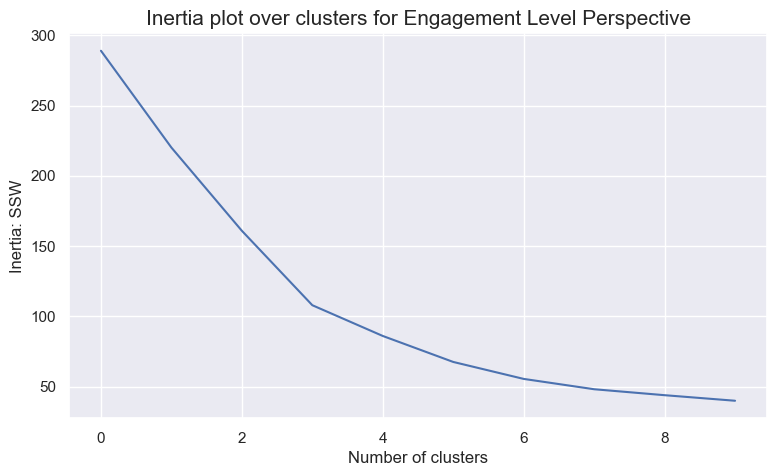

In [203]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSW")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters for Engagement Level Perspective", size=15)
plt.show()

Simply by analysing the plot above, and using the elbow method, we can see that we should probably choose a low number of clusters, such as  3.

Lets calculate the Silhouette Score:

For n_clusters = 2, the average silhouette_score is : 0.48079809037295507
For n_clusters = 3, the average silhouette_score is : 0.5331759132187804
For n_clusters = 4, the average silhouette_score is : 0.5346989181422639
For n_clusters = 5, the average silhouette_score is : 0.4727812760765152
For n_clusters = 6, the average silhouette_score is : 0.4377893462354845
For n_clusters = 7, the average silhouette_score is : 0.4698654525996781
For n_clusters = 8, the average silhouette_score is : 0.41858526080593095
For n_clusters = 9, the average silhouette_score is : 0.4219693639608491
For n_clusters = 10, the average silhouette_score is : 0.3759958871091301


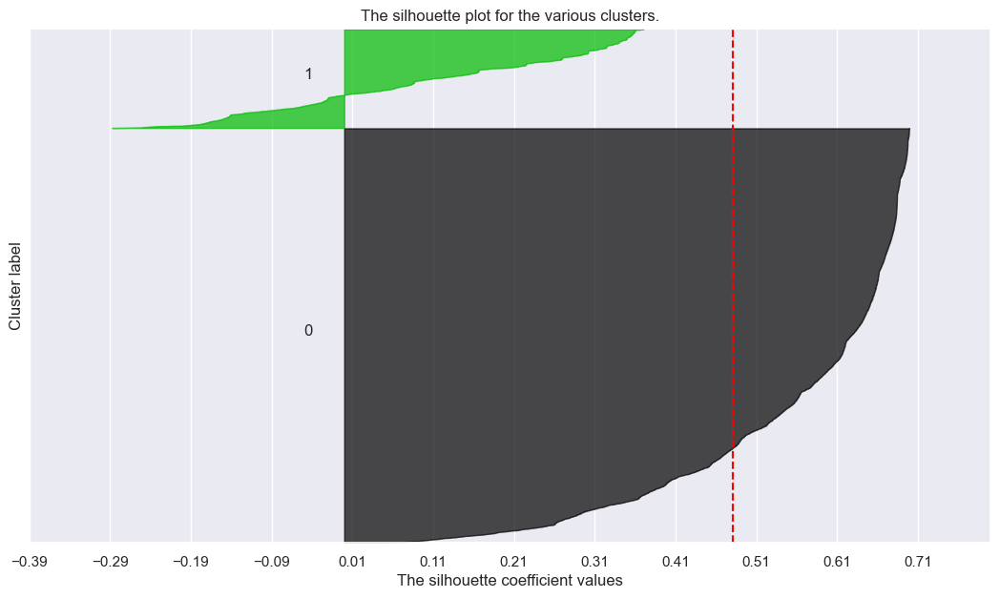

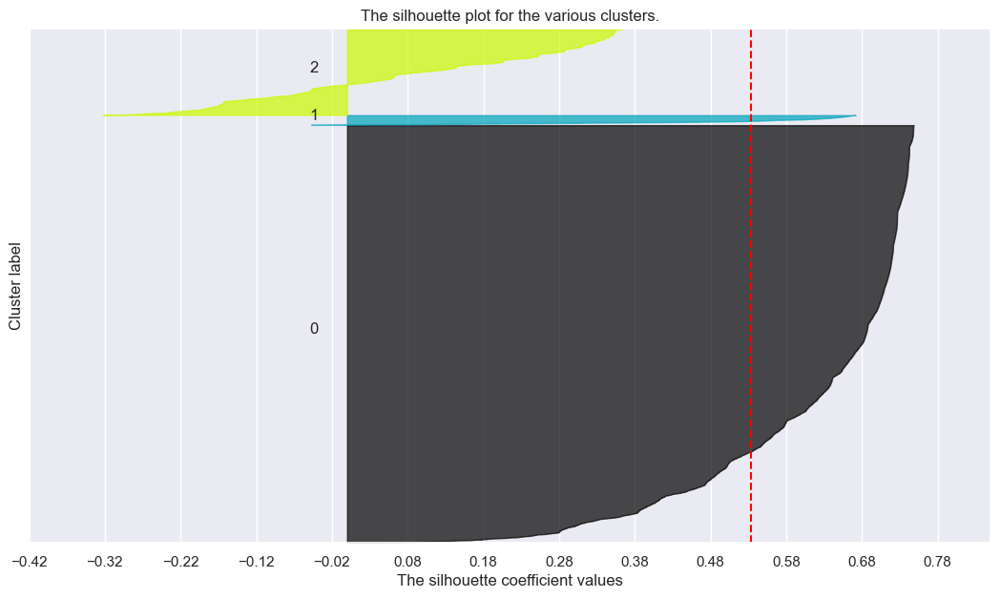

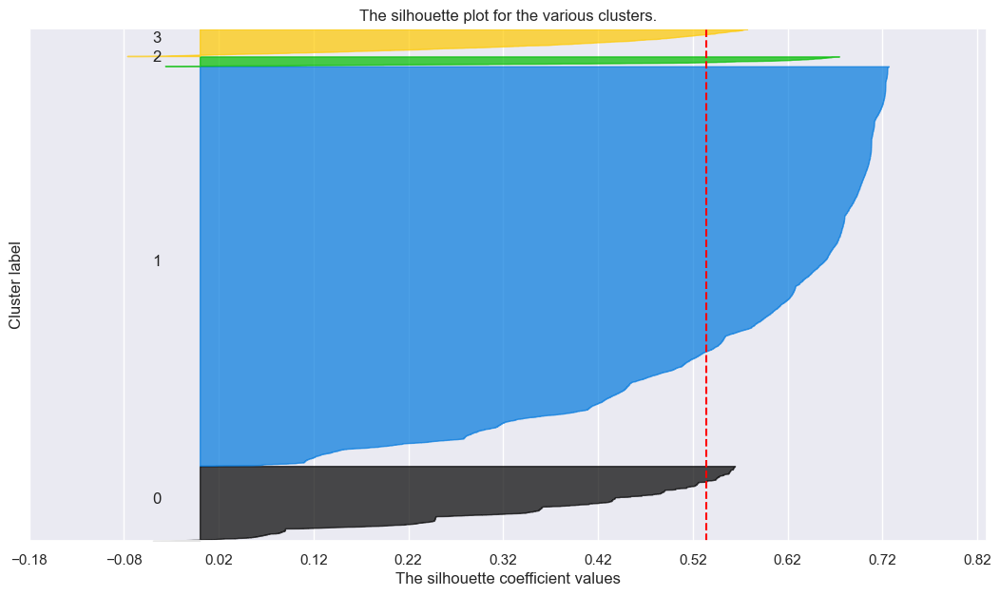

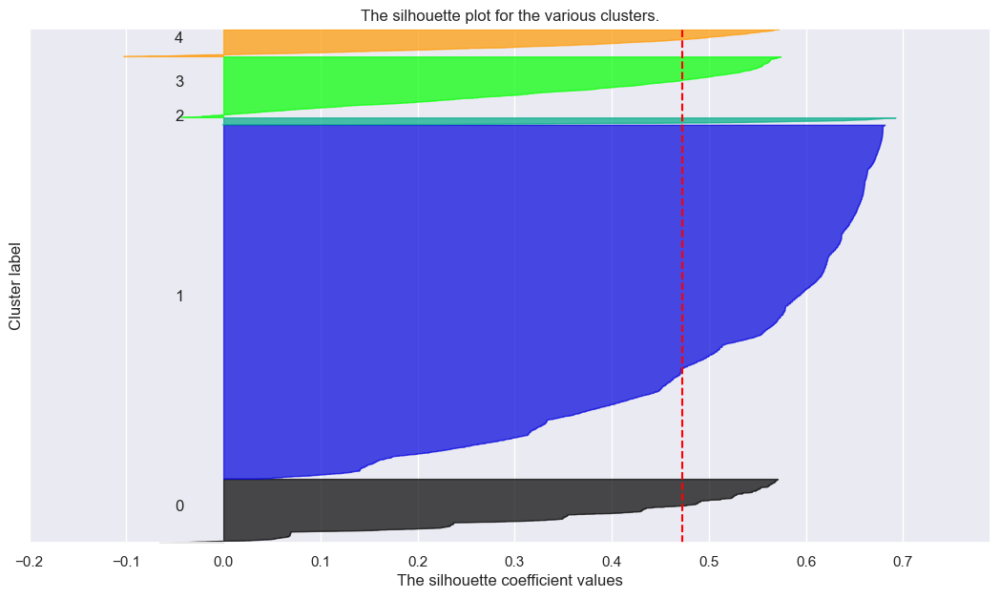

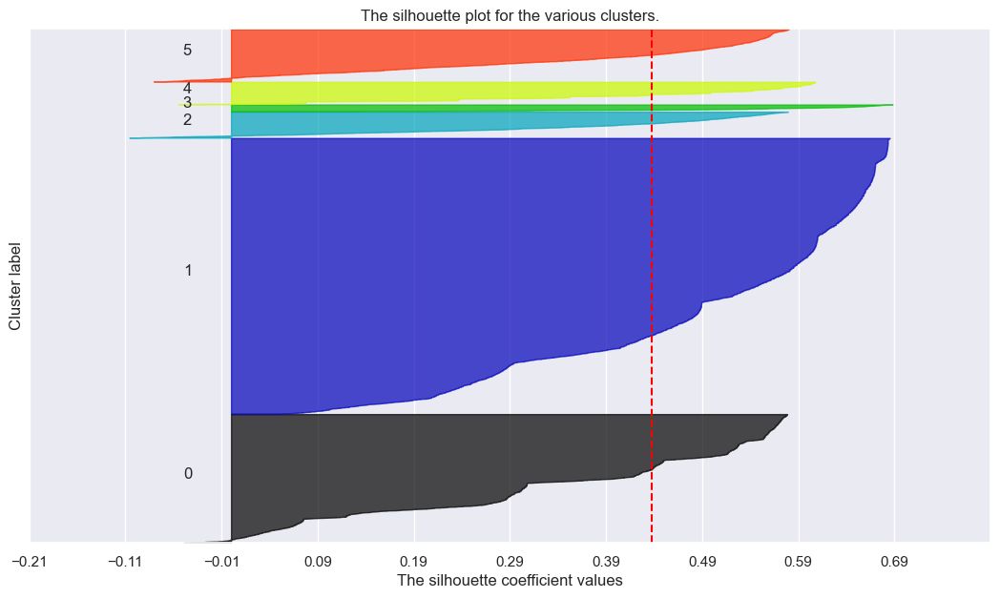

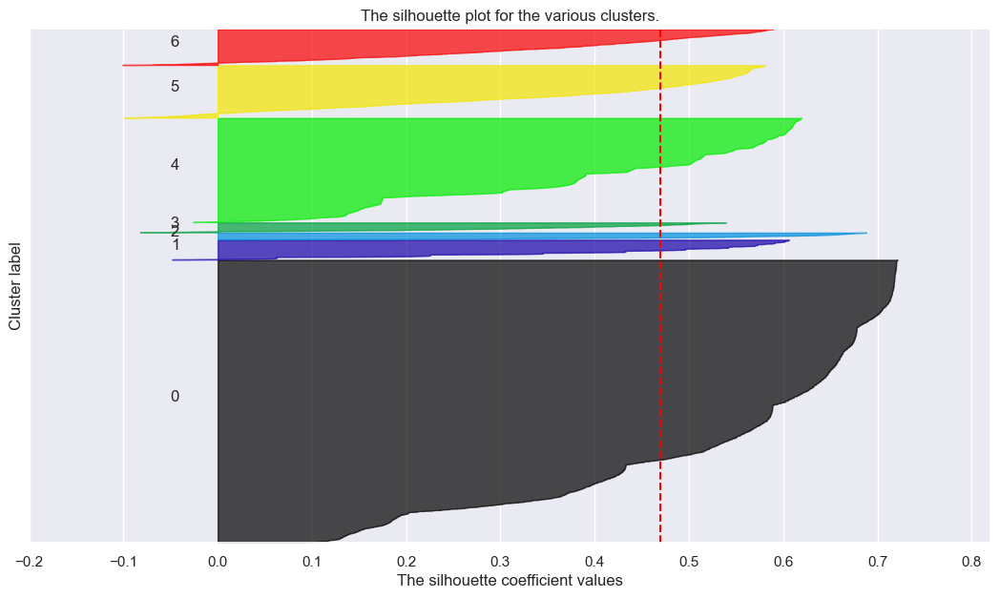

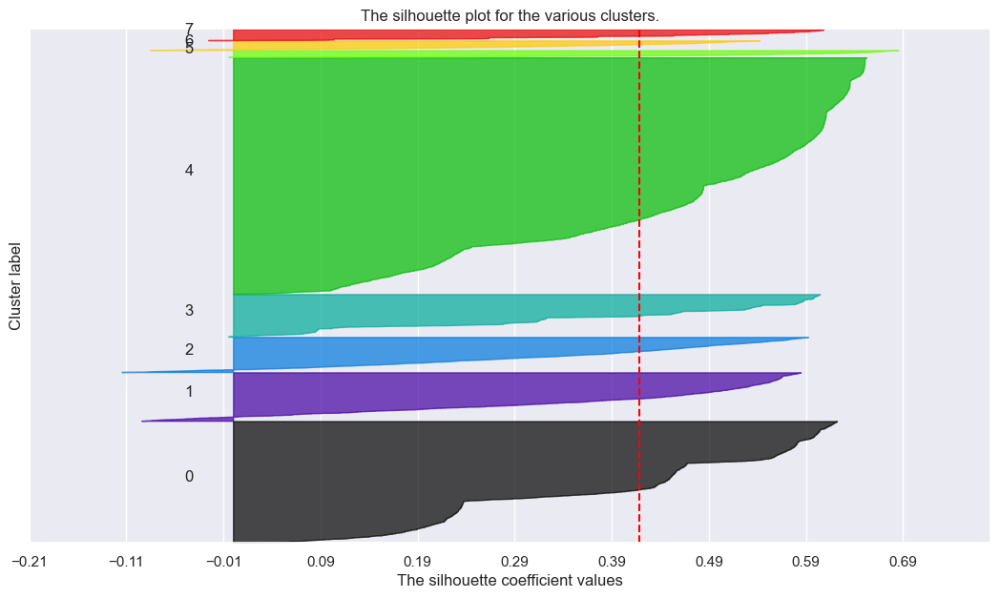

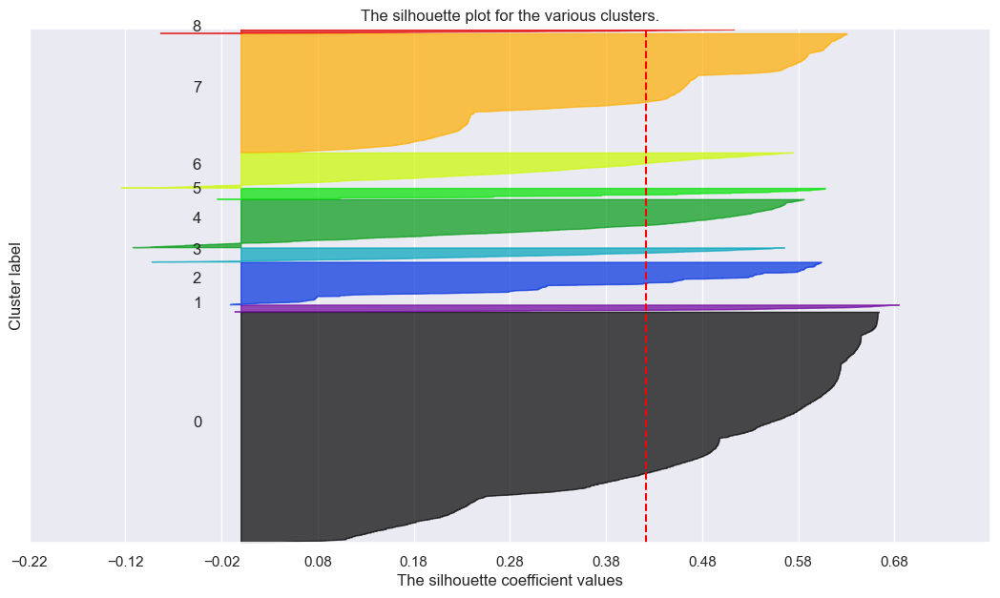

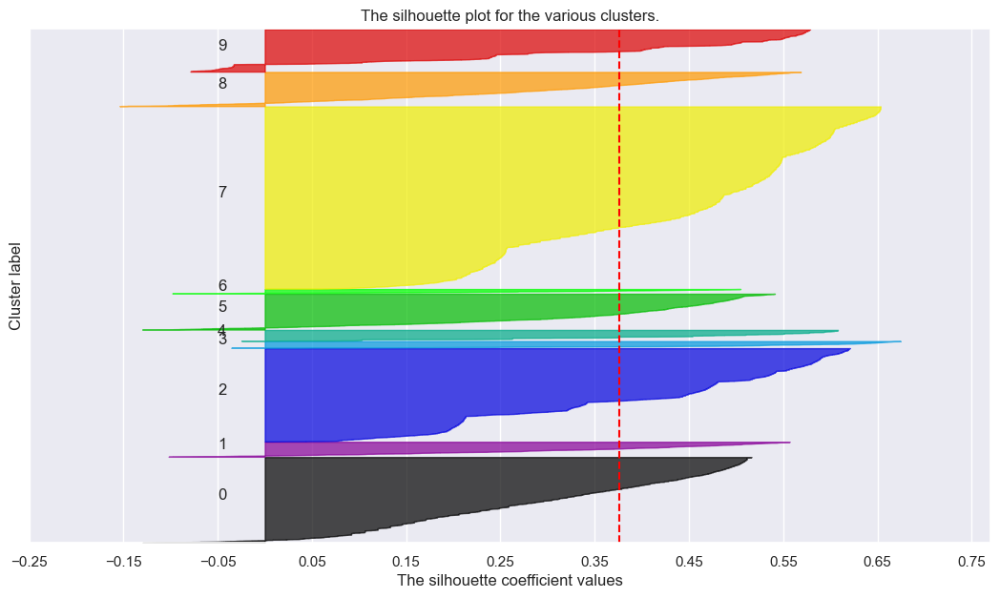

In [204]:
plot_silhouette(engagement_level)

Based on the silhouette plot, we observe an increase should choose 4 clusters or 7 clusters.


In [205]:
# 4 clusters solution
kmeans_value_4 = KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
kmeans_value_4_labels = kmeans_value_4.fit_predict(engagement_level)

unique, counts = np.unique(kmeans_value_4_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_value_4 = pd.concat((engagement_level, pd.Series(kmeans_value_4_labels, name='kmeans_labels')), axis=1)
kmeans_value_4.groupby('kmeans_labels').mean()

{0: 2158, 1: 11522, 2: 275, 3: 778}


,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
kmeans_labels,,,
0,0.008925,0.229353,0.017562
1,0.011968,0.043779,0.042783
2,0.016154,0.042929,0.512465
3,0.286708,0.087457,0.017065


In [206]:
r2_kmeans_value_4 = round(r2(engagement_level, kmeans_value_4_labels),4)
silhouette_kmeans_value_4= round(silhouette(engagement_level, kmeans_value_4_labels),4)

print(f'R2 score : {r2_kmeans_value_4}')
print(f'Silhouette score : {silhouette_kmeans_value_4}')

R2 score : 0.6266
Silhouette score : 0.5347


In [207]:
# 7 clusters solution
kmeans_value_7 = KMeans(n_clusters=7, init='k-means++', n_init=15, random_state=1)
kmeans_value_7_labels = kmeans_value_7.fit_predict(engagement_level)

unique, counts = np.unique(kmeans_value_7_labels, return_counts=True)
print(dict(zip(unique, counts)))

# Characterizing the final clusters
kmeans_value_7 = pd.concat((engagement_level, pd.Series(kmeans_value_7_labels, name='kmeans_labels')), axis=1)
kmeans_value_7.groupby('kmeans_labels').mean()

{0: 8147, 1: 569, 2: 196, 3: 283, 4: 3000, 5: 1509, 6: 1029}


,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
kmeans_labels,,,
0,0.007391,0.034004,0.029370
1,0.009154,0.369703,0.011023
2,0.014314,0.048044,0.589512
3,0.422306,0.116117,0.014389
4,0.006347,0.145694,0.018805
5,0.007801,0.031100,0.160798
6,0.161423,0.063681,0.020236


In [208]:
r2_kmeans_value_7 = round(r2(engagement_level, kmeans_value_7_labels),4)
silhouette_kmeans_value_7 = round(silhouette(engagement_level, kmeans_value_7_labels),4)

print(f'R2 score : {r2_kmeans_value_7}')
print(f'Silhouette score : {silhouette_kmeans_value_7}')

R2 score : 0.8081
Silhouette score : 0.4699


**Conclusion:** Taking the two metrics in consideration we choose 7 clusters.

In [209]:
new_row = {'Method': 'K-means', 'Clusters': 7, 'R*2': r2_kmeans_value_7, 'Silhouette': silhouette_kmeans_value_7}

# Create a new DataFrame for the new row
new_df1 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df1], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699


#### <div id="meanshift">3.3.3 Mean Shift Clustering</div>

Let's start by estimathing the bandwidth with the **estimate_bandwidth**.

In [210]:
bandwidth = estimate_bandwidth(engagement_level, quantile=0.6)
bandwidth

0.13635555856842502

**Note:** Adjusting the quantile parameter in the estimate_bandwidth function directly influences the bandwidth, which, in turn, impacts the number and sizes of clusters generated by the Mean Shift algorithm.

In [211]:
ms = MeanShift(bandwidth=bandwidth, n_jobs=4)
ms_labels = ms.fit_predict(engagement_level)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters: ", ms_n_clusters)

Number of estimated clusters:  6


In [212]:
# Concatenating the labels to df
df_concat = pd.concat([engagement_level, pd.Series(ms_labels, index=engagement_level.index, name="ms_labels")], axis=1)
df_concat.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,ms_labels
0,0.019718,0.027778,0.000573,0
1,0.002817,0.013889,0.034384,0
2,0.000000,0.083333,0.004011,0
3,0.005634,0.041667,0.012607,0
4,0.000000,0.000000,0.120344,0


In [213]:
r2_mean_shift_value = round(r2(engagement_level, ms_labels),4)
silhouette_mean_shift_value = round(silhouette(engagement_level, ms_labels),4)

print(f'R2 score : {r2_mean_shift_value}')
print(f'Silhouette score : {silhouette_mean_shift_value}')

R2 score : 0.4469
Silhouette score : 0.6461


In [214]:
new_row = {'Method':'Mean-Shift', 'Clusters':6, "R*2":r2_mean_shift_value, 'Silhouette':silhouette_mean_shift_value}

# Create a new DataFrame for the new row
new_df2 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df2], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699
2,Mean-Shift,6,0.4469,0.6461


#### <div id="dbscan">3.3.4 DBSCAN</div>

In [215]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.03, min_samples=5) 
dbscan_labels = dbscan.fit_predict(engagement_level)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

#by changing eps
# eps= 0.02 - clusters = 19
# eps= 0.0 3- clusters = 7  ==> seems to be the knee
# eps= 0.04 - clusters = 5


Number of estimated clusters : 7


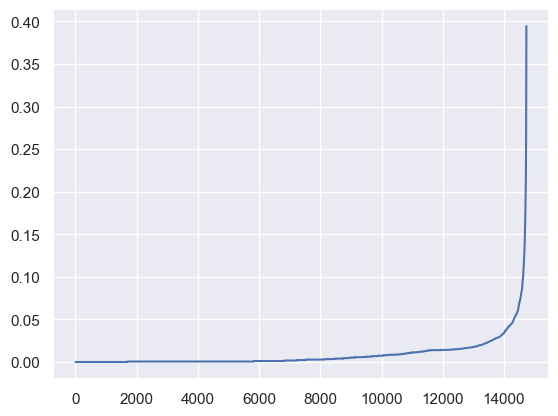

In [216]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(engagement_level)
distances, _ = neigh.kneighbors(engagement_level)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

* The epsilon (ε) The epsilon value represents the maximum distance between points to be considered within the same neighborhood.

* The k-distance graph helps in identifying the value of ε based on the distances to the k-nearest neighbors for each data point. The point where there's a significant increase or change in distance (a knee or elbow point) can be considered as a candidate for 
ε.



In [217]:
# Concatenating the labels to df
df_concat = pd.concat([engagement_level, pd.Series(dbscan_labels, index=engagement_level.index, name="dbscan_labels")], axis=1)
df_concat.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,dbscan_labels
0,0.019718,0.027778,0.000573,0
1,0.002817,0.013889,0.034384,0
2,0.000000,0.083333,0.004011,0
3,0.005634,0.041667,0.012607,0
4,0.000000,0.000000,0.120344,0


In [218]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1].shape[0]

220

In [219]:
r2_dbscan_value = round(r2(engagement_level, dbscan_labels),4)
silhouette_dbscan_value = round(silhouette(engagement_level, dbscan_labels),4)

print(f'R2 score : {r2_dbscan_value:.4f}')
print(f'Silhouette score : {silhouette_dbscan_value}')

R2 score : 0.1185
Silhouette score : 0.6592


In [220]:
new_row = {'Method':'DBSCAN', 'Clusters':7, "R*2":r2_dbscan_value, 'Silhouette':silhouette_dbscan_value}

# Create a new DataFrame for the new row
new_df2 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df2], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699
2,Mean-Shift,6,0.4469,0.6461
3,DBSCAN,7,0.1185,0.6592


#### <div id="gaussianmixture">3.3.5 GMM (Gaussian Mixture Model )</div>

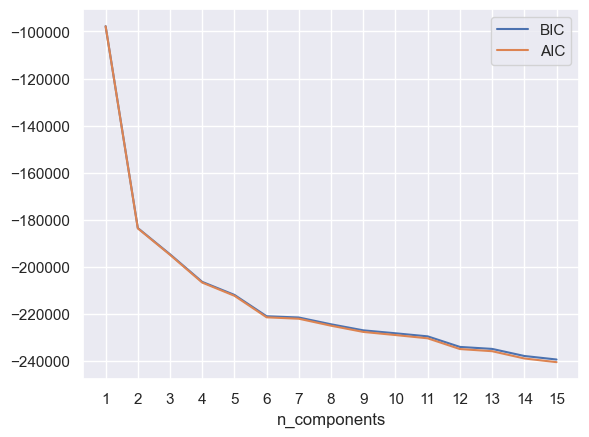

In [221]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(engagement_level)
          for n in n_components]

# TO-DO: compute the aic and bic values for each cluster solution. Use the appropriate GMM methods.
bic_values = [gmm.bic(engagement_level) for gmm in models]
aic_values = [gmm.aic(engagement_level) for gmm in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

Based on the graph we will choose 4 , 6  or 7 clusters:

In [222]:
#4clusters
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='k-means++', random_state=42)
gmm_labels = gmm.fit_predict(engagement_level)

In [223]:
# Concatenate the original DataFrame and the GMM labels
df_concat1 = pd.concat([engagement_level, pd.Series(gmm_labels, index=engagement_level.index, name="gmm_labels")], axis=1)
df_concat1.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,gmm_labels
0,0.019718,0.027778,0.000573,2
1,0.002817,0.013889,0.034384,0
2,0.000000,0.083333,0.004011,0
3,0.005634,0.041667,0.012607,2
4,0.000000,0.000000,0.120344,1


In [224]:
r2_gmm_value = round(r2(engagement_level, gmm_labels),4)
silhouette_gmm_value = round(silhouette(engagement_level, gmm_labels),4)

print(f'R2 score : {r2_gmm_value}')
print(f'Silhouette score : {silhouette_gmm_value}')

R2 score : 0.2998
Silhouette score : 0.2192


In [225]:
#6 clusters
# Performing GMM clustering
gmm_6 = GaussianMixture(n_components=6, covariance_type='full', n_init=10, init_params='k-means++', random_state=42)
gmm_labels_6 = gmm_6.fit_predict(engagement_level)

In [226]:
# Concatenate the original DataFrame and the GMM labels
df_concat1 = pd.concat([engagement_level, pd.Series(gmm_labels_6, index=engagement_level.index, name="gmm_labels")], axis=1)
df_concat1.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,gmm_labels
0,0.019718,0.027778,0.000573,0
1,0.002817,0.013889,0.034384,1
2,0.000000,0.083333,0.004011,1
3,0.005634,0.041667,0.012607,0
4,0.000000,0.000000,0.120344,5


In [227]:
r2_gmm_value_6= round(r2(engagement_level, gmm_labels_6),4)
silhouette_gmm_value_6= round(silhouette(engagement_level, gmm_labels_6),4)

print(f'R2 score : {r2_gmm_value_6}')
print(f'Silhouette score : {silhouette_gmm_value_6}')

R2 score : 0.4376
Silhouette score : 0.1944


In [228]:
#7 clusters
# Performing GMM clustering
gmm_7 = GaussianMixture(n_components=7, covariance_type='full', n_init=10, init_params='k-means++', random_state=42)
gmm_labels_7 = gmm_7.fit_predict(engagement_level)

In [229]:
# Concatenate the original DataFrame and the GMM labels
df_concat1 = pd.concat([engagement_level, pd.Series(gmm_labels_7, index=engagement_level.index, name="gmm_labels")], axis=1)
df_concat1.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,gmm_labels
0,0.019718,0.027778,0.000573,5
1,0.002817,0.013889,0.034384,2
2,0.000000,0.083333,0.004011,2
3,0.005634,0.041667,0.012607,5
4,0.000000,0.000000,0.120344,6


In [230]:
r2_gmm_value_7= round(r2(engagement_level, gmm_labels_7),4)
silhouette_gmm_value_7= round(silhouette(engagement_level, gmm_labels_7),4)

print(f'R2 score : {r2_gmm_value_7}')
print(f'Silhouette score : {silhouette_gmm_value_7}')

R2 score : 0.5255
Silhouette score : 0.1553


**Conclusion:** Based on the values we will keep the 7 clusters solution

In [231]:
new_row = {'Method':'GMM', 'Clusters':7, "R*2":r2_gmm_value_7, 'Silhouette':silhouette_gmm_value_7}

# Create a new DataFrame for the new row
new_df2 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df2], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699
2,Mean-Shift,6,0.4469,0.6461
3,DBSCAN,7,0.1185,0.6592
4,GMM,7,0.5255,0.1553


#### <div id="som">3.3.6 Self-Organizing Maps</div>

In [232]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    data= engagement_level.values,
    mapsize= [20,12],
    lattice = 'hexa',
    training='batch',
    neighborhood = 'gaussian',
    component_names=engagement_level.columns
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 pca_linear_initialization took: 0.030000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.093000, quantization error: 0.751034

 epoch: 2 ---> elapsed time:  0.088000, quantization error: 0.964288

 epoch: 3 ---> elapsed time:  0.098000, quantization error: 0.906357

 epoch: 4 ---> elapsed time:  0.099000, quantization error: 0.895864

 epoch: 5 ---> elapsed time:  0.096000, quantization error: 0.884408

 epoch: 6 ---> elapsed time:  0.095000, quantization error: 0.871692



 epoch: 7 ---> elapsed time:  0.082000, quantization error: 0.858912

 epoch: 8 ---> elapsed time:  0.096000, quantization error: 0.848409

 epoch: 9 ---> elapsed time:  0.096000, quantization error: 0.840083

 epoch: 10 ---> elapsed time:  0.089000, quantization error: 0.832927

 epoch: 11 ---> elapsed time:  0.083000, quantization error: 0.826509

 epoch: 12 ---> elapsed time:  0.085000, quantization error: 0.820820

 epoch: 13 ---> elapsed time:  0.083000, quantization error: 0.815458

 epoch: 14 ---> elapsed time:  0.086000, quantization error: 0.810339

 epoch: 15 ---> elapsed time:  0.079000, quantization error: 0.805268

 epoch: 16 ---> elapsed time:  0.079000, quantization error: 0.800269

 epoch: 17 ---> elapsed time:  0.080000, quantization error: 0.795190

 epoch: 18 ---> elapsed time:  0.093000, quantization error: 0.790096

 epoch: 19 ---> elapsed time:  0.082000, quantization error: 0.784941

 epoch: 20 ---> elapsed time:  0.081000, quantization error: 0.779693

 epoch: 2

Let's now visualize our **component planes**.

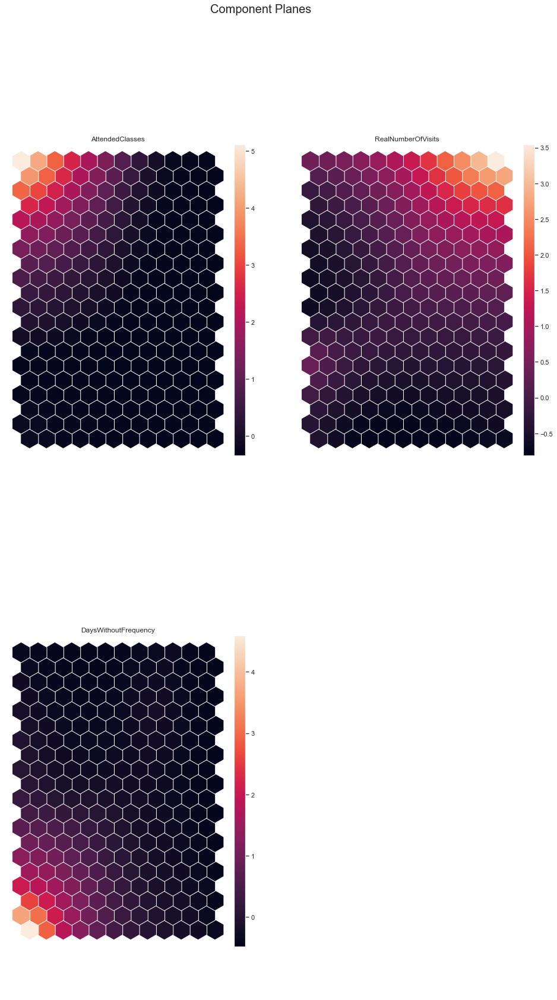

In [233]:
plt.rcParams['figure.dpi'] = 72


# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=2, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

And now let's look at the **U-Matrix**.

c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\sompy\visualization\umatrix.py:60: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X, Y, s=2, alpha=1., c='Gray',


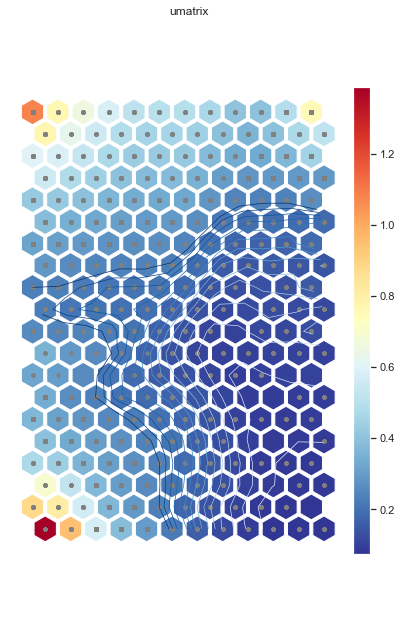

array([[1.07633118, 0.76076432, 0.65740815, 0.58023041, 0.51271345,
        0.50282971, 0.49613682, 0.4653785 , 0.40712981, 0.40015014,
        0.49427446, 0.75423337],
       [0.76918879, 0.6253629 , 0.55408461, 0.48894602, 0.45637401,
        0.4562695 , 0.43982197, 0.39340677, 0.3591321 , 0.39327901,
        0.47210008, 0.51722723],
       [0.60479021, 0.58425825, 0.53206748, 0.47387129, 0.43266759,
        0.42453445, 0.4216147 , 0.38176104, 0.33662741, 0.33492884,
        0.36693576, 0.45405114],
       [0.55448712, 0.48113798, 0.43867503, 0.39912428, 0.38115377,
        0.38041925, 0.35570238, 0.30402403, 0.28203943, 0.28997893,
        0.29412508, 0.29451362],
       [0.42232986, 0.41874008, 0.39746854, 0.36401414, 0.34092812,
        0.33549788, 0.32575481, 0.28190042, 0.24447431, 0.23706515,
        0.23771519, 0.26721749],
       [0.38643845, 0.3503428 , 0.32956872, 0.30708024, 0.29852117,
        0.29262212, 0.26412836, 0.21546484, 0.19671853, 0.19643721,
        0.19068407,

In [234]:
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1)

And the **Hit-Map**.

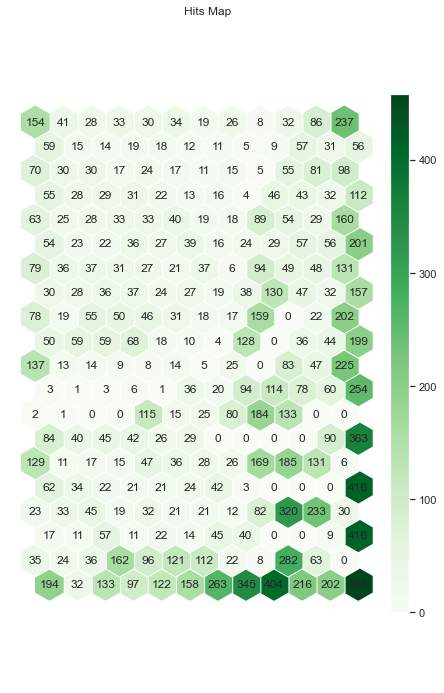

In [235]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Greens")
plt.show()

##### <div id="hierarchicaloversom">3.3.6.1 Hierachical Clustering Over SOM </div>

In [236]:
nodes = sm.codebook.matrix

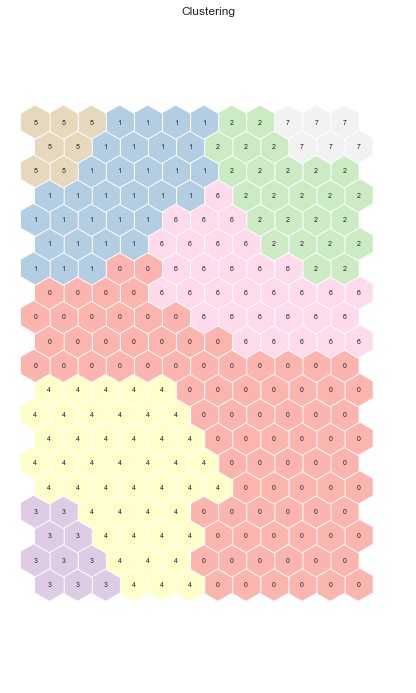

In [237]:
hierarchical_clustering_over_som = AgglomerativeClustering(n_clusters=8, linkage='ward', metric='euclidean')
hierarchical_clustering_over_som_labels = hierarchical_clustering_over_som.fit_predict(nodes)

sm.cluster_labels = hierarchical_clustering_over_som_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [238]:
df_engagement_nodes = pd.DataFrame(nodes, columns=engagement_level.columns)
df_engagement_nodes['hierarchical_over_som_labels'] = hierarchical_clustering_over_som_labels

# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(engagement_level)[0] 

df_product_bmus = pd.DataFrame(
    np.concatenate((engagement_level, np.expand_dims(bmus_map,1)), axis=1),
    index=engagement_level.index, columns=np.append(engagement_level.columns,"BMU"))



In [239]:
# Get cluster labels for each observation
hierarchical_clustering_over_som = df_product_bmus.merge(df_engagement_nodes['hierarchical_over_som_labels'], 'left', left_on="BMU", right_index=True)
hierarchical_clustering_over_som.drop(columns='BMU', inplace=True)
hierarchical_clustering_over_som.groupby('hierarchical_over_som_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
hierarchical_over_som_labels,,,
0,0.022466,0.057552,0.018404
1,0.920657,0.178241,0.010124
2,0.000000,1.000000,0.000000
4,0.007722,0.028656,0.125221
6,0.075369,0.227493,0.010147


In [240]:
hierarchical_clustering_over_som_labels = hierarchical_clustering_over_som['hierarchical_over_som_labels']

r2_hierarchical_clustering_over_som_value = round(r2(engagement_level, hierarchical_clustering_over_som_labels),4)
silhouette_hierarchical_clustering_over_som_value= round(silhouette(engagement_level, hierarchical_clustering_over_som_labels),4)

print(f'R2 score : {r2_hierarchical_clustering_over_som_value}')
print(f'Silhouette score : {silhouette_hierarchical_clustering_over_som_value}')

R2 score : 0.3642
Silhouette score : 0.3012


In [241]:
new_row = {'Method':'Hierarchical over SOM', 'Clusters':8, "R*2":r2_hierarchical_clustering_over_som_value, 'Silhouette':silhouette_hierarchical_clustering_over_som_value}

# Create a new DataFrame for the new row
new_df3 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df3], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699
2,Mean-Shift,6,0.4469,0.6461
3,DBSCAN,7,0.1185,0.6592
4,GMM,7,0.5255,0.1553
5,Hierarchical over SOM,8,0.3642,0.3012


##### <div id="kmeansoversom"> 3.3.6.2 K-Means Over SOM </div>

c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


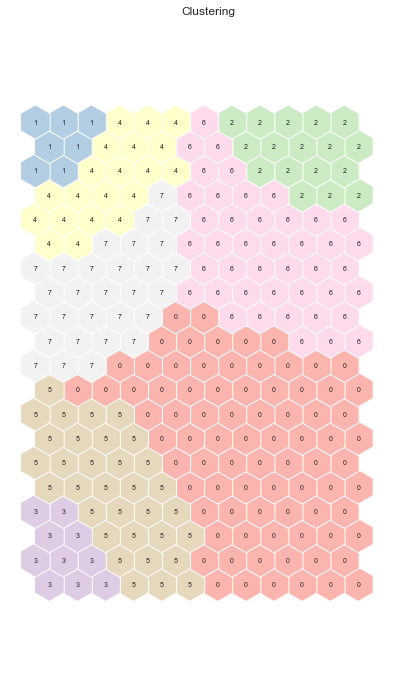

In [242]:
kmeans_over_som = KMeans(n_clusters=8, init='k-means++')
kmeans_over_som_labels = kmeans_over_som.fit_predict(nodes)
sm.cluster_labels = kmeans_over_som_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [243]:
df_nodes = pd.DataFrame(nodes, columns=engagement_level.columns)
df_nodes['kmeans_som_labels'] = kmeans_over_som_labels

# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(engagement_level)[0] 

df_product_bmus = pd.DataFrame(
    np.concatenate((engagement_level, np.expand_dims(bmus_map,1)), axis=1),
    index=engagement_level.index, columns=np.append(engagement_level.columns,"BMU"))



In [244]:
# Get cluster labels for each observation
kmeans_over_som = df_product_bmus.merge(df_nodes['kmeans_som_labels'], 'left', left_on="BMU", right_index=True)
kmeans_over_som.drop(columns='BMU', inplace=True)
kmeans_over_som.groupby('kmeans_som_labels').mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
kmeans_som_labels,,,
0,0.015777,0.058932,0.040343
5,0.012251,0.044808,0.532046
6,0.044276,0.321402,0.009787
7,0.389277,0.102431,0.011834


In [245]:
kmeans_over_som_labels = kmeans_over_som['kmeans_som_labels']

r2_kmeans_over_som_value= round(r2(engagement_level, kmeans_over_som_labels),4)
silhouette_kmeans_over_som_value = round(silhouette(engagement_level, kmeans_over_som_labels),4)

print(f'R2 score : {r2_kmeans_over_som_value}')
print(f'Silhouette score : {silhouette_kmeans_over_som_value}')

R2 score : 0.5517
Silhouette score : 0.6047


In [246]:
new_row = {'Method':'K-Means over SOM', 'Clusters':8, "R*2":r2_kmeans_over_som_value, 'Silhouette':silhouette_kmeans_over_som_value}

# Create a new DataFrame for the new row
new_df4 = pd.DataFrame([new_row])

# Concatenate the original DataFrame and the new row DataFrame
engagement_level_cluster_evaluation = pd.concat([engagement_level_cluster_evaluation, new_df4], ignore_index=True)
engagement_level_cluster_evaluation

,Method,Clusters,R*2,Silhouette
0,Hierarchical,8,0.7993,0.4099
1,K-means,7,0.8081,0.4699
2,Mean-Shift,6,0.4469,0.6461
3,DBSCAN,7,0.1185,0.6592
4,GMM,7,0.5255,0.1553
5,Hierarchical over SOM,8,0.3642,0.3012
6,K-Means over SOM,8,0.5517,0.6047


#### <div id="4bestmethods">3.3.7 Comparing the 4 best methods</div> 

In [247]:
final_features_seg2=['AttendedClasses',	'RealNumberOfVisits',	'DaysWithoutFrequency']

**1) Hierarchical**

In [248]:
two_dim_2nd_seg_H = TSNE(random_state=42, perplexity=50).fit_transform(hierarc_value_8[final_features_seg2])

In [249]:
colors = ["blue","white","red", "navy", "green", "orange", "pink", "purple"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3', 'Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']

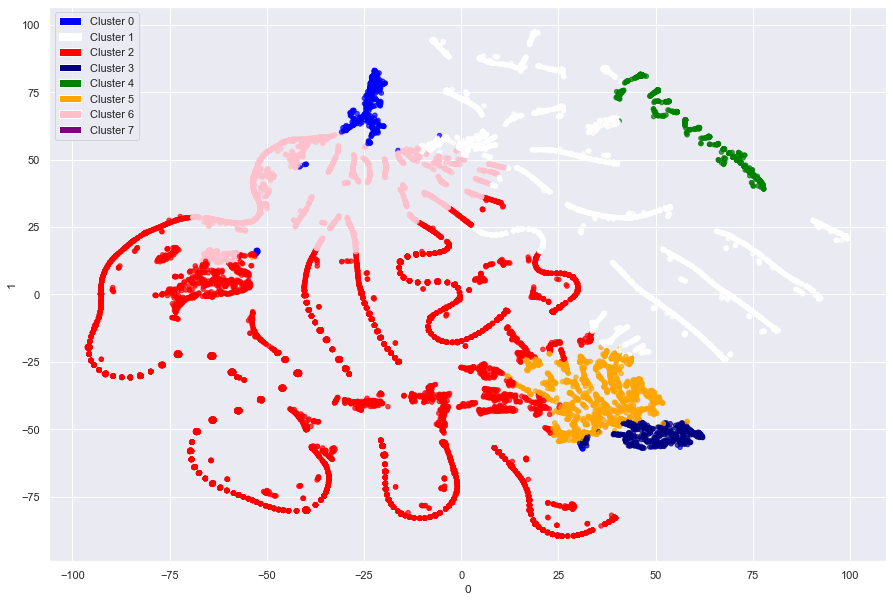

In [250]:
# Map the values in the merged_labels column to the corresponding colors
color_map = hierarc_value_7['hierarc_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_2nd_seg_H).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

**2) K-means**

In [258]:
two_dim_2nd_seg_K4 = TSNE(random_state=42).fit_transform(kmeans_value_4[final_features_seg2])

In [259]:
colors = ["blue","white","red", "navy", "green"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3']

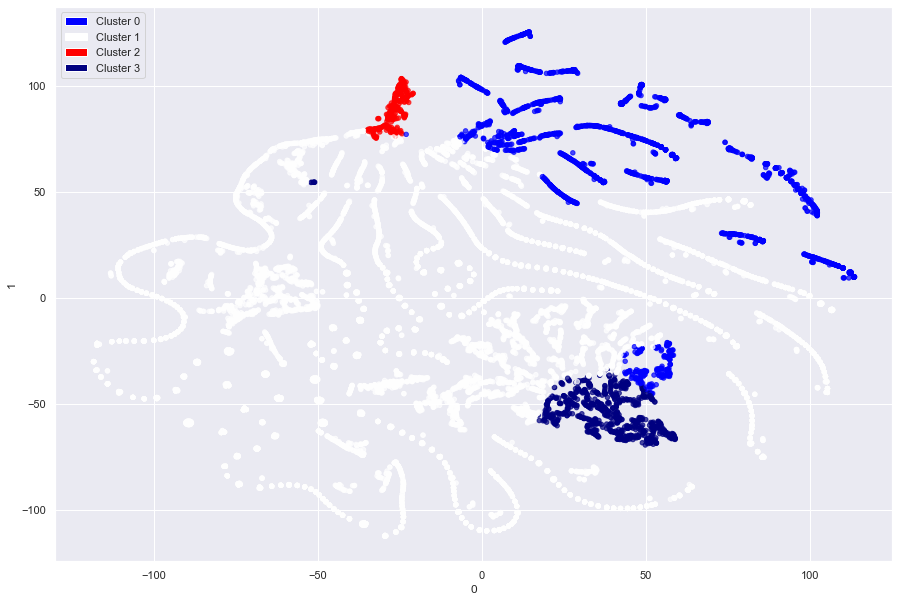

In [260]:
# Map the values in the merged_labels column to the corresponding colors
color_map = kmeans_value_4['kmeans_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_2nd_seg_K4).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

In [261]:
two_dim_2nd_seg_K7 = TSNE(random_state=42).fit_transform(kmeans_value_7[final_features_seg2])

In [262]:
colors = ["blue","white","red", "navy", "green", "orange", "pink", "purple"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3', 'Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']

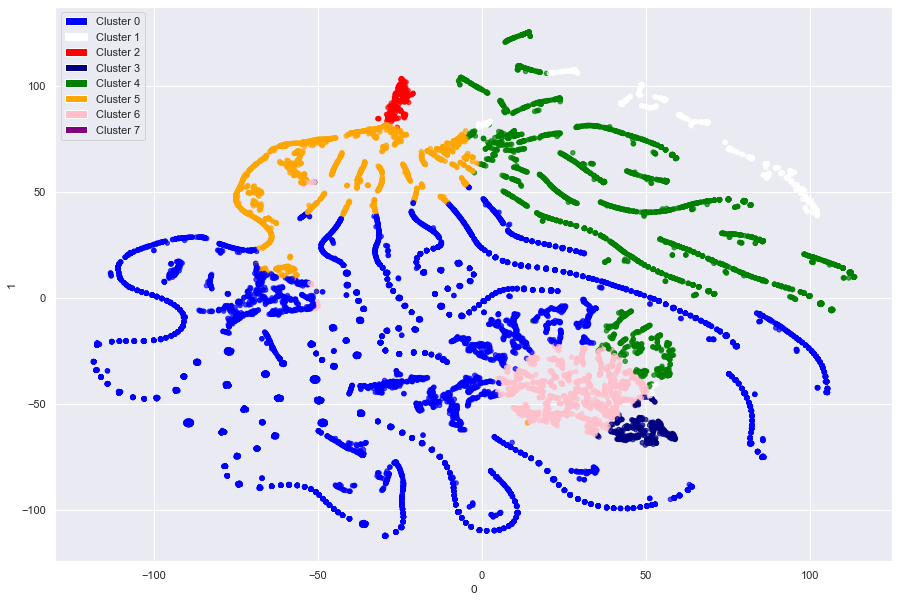

In [263]:
# Map the values in the merged_labels column to the corresponding colors
color_map = kmeans_value_7['kmeans_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_2nd_seg_K7).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

**3) Min-Shift**

In [265]:
two_dim_2nd_seg_MS = TSNE(random_state=42).fit_transform(df_concat[final_features_seg2])

In [266]:

colors = ["blue","white","red", "navy", "green", "orange"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3', 'Cluster 4', 'Cluster 5']

In [269]:
df_concat.columns

Index(['AttendedClasses', 'RealNumberOfVisits', 'DaysWithoutFrequency',
       'gmm_labels'],
      dtype='object')

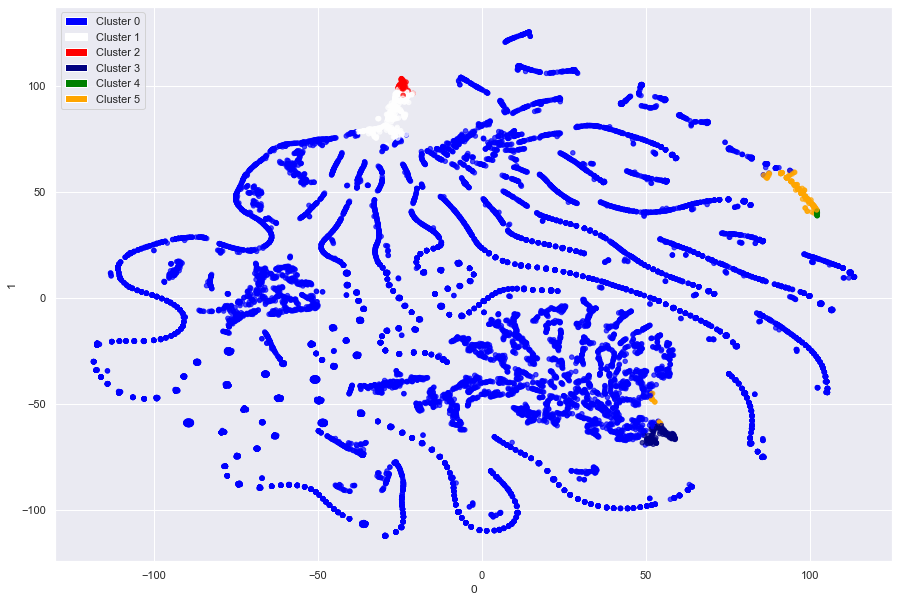

In [279]:
# Map the values in the merged_labels column to the corresponding colors
color_map = df_concat['ms_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_2nd_seg_MS).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')

**4) K-means over SOM**

In [280]:
two_dim_2nd_seg_KOS = TSNE(random_state=42).fit_transform(kmeans_over_som[final_features_seg2])

In [281]:
colors = ["blue","white","red", "navy", "green", "orange", "pink", "purple"]

# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2','Cluster 3', 'Cluster 4', 'Cluster 5','Cluster 6', 'Cluster 7']

In [283]:
 kmeans_over_som.columns


Index(['AttendedClasses', 'RealNumberOfVisits', 'DaysWithoutFrequency',
       'kmeans_som_labels'],
      dtype='object')

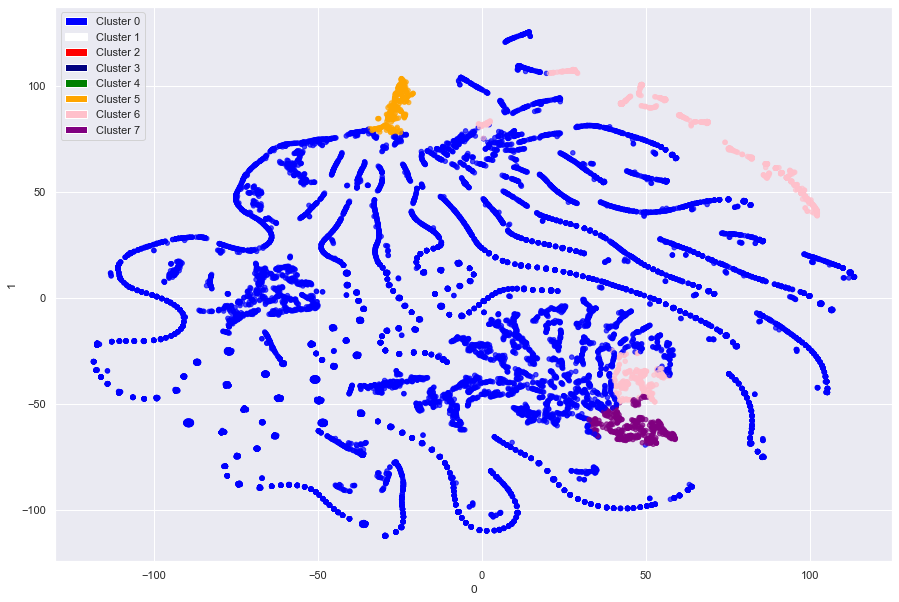

In [284]:
# Map the values in the merged_labels column to the corresponding colors
color_map = kmeans_over_som['kmeans_som_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim_2nd_seg_KOS).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')

## <div id="merging">4. Merging the Perspectives </div>

1) Let´s merge the two segmentations:

In [251]:
df_final = pd.concat([service_usage, engagement_level], axis=1)
final_features = df_final.columns
df_final.head()

,WaterActivities,FitnessActivities,total_activities,other_activities,LifetimeValue,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency
0,0.0,1.0,0.5,0,0.028402,0.007767,0.019718,0.027778,0.000573
1,0.0,0.0,0.5,1,0.152328,0.021359,0.002817,0.013889,0.034384
2,0.0,1.0,0.5,0,0.011952,0.004854,0.000000,0.083333,0.004011
3,0.0,0.0,0.5,1,0.049398,0.018447,0.005634,0.041667,0.012607
4,0.0,1.0,0.5,0,0.118632,0.038835,0.000000,0.000000,0.120344


2. We also need to determine which was the **best clustering algorithm** for each of the perspectives, based on the **r2 and silhouette scores**. We will then use that algorithm to pick the **labels**:

*  _`Service Usage`_`: **K-Prototype**

* _`Best algorithm for Engagement Level`_ : **K-Means** but we are going to use the one wit 4 clusters because it has a higher silhouette score and its easy to analyse.

In [252]:
df_final['service_usage_labels'] = kproto_labels
df_final['engagement_level_labels'] = kmeans_value_4_labels 
df_final.head()

,WaterActivities,FitnessActivities,total_activities,other_activities,LifetimeValue,NumberOfFrequencies,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,service_usage_labels,engagement_level_labels
0,0.0,1.0,0.5,0,0.028402,0.007767,0.019718,0.027778,0.000573,0,1
1,0.0,0.0,0.5,1,0.152328,0.021359,0.002817,0.013889,0.034384,1,1
2,0.0,1.0,0.5,0,0.011952,0.004854,0.000000,0.083333,0.004011,0,1
3,0.0,0.0,0.5,1,0.049398,0.018447,0.005634,0.041667,0.012607,1,1
4,0.0,1.0,0.5,0,0.118632,0.038835,0.000000,0.000000,0.120344,0,1


In [253]:
# Count label frequencies (contigency table)
pd.crosstab(
df_final['service_usage_labels'],
df_final['engagement_level_labels']
)

engagement_level_labels,0,1,2,3
service_usage_labels,,,,
0,1475,6186,136,53
1,197,2257,68,67
2,486,3079,71,658


### <div id="merginghierarchical"> 4.1 Merging Using Hierarchical Clustering </div>

In [254]:
metric_for_cluster=list(engagement_level.columns)


In [255]:
metric_for_cluster.append("LifetimeValue")
metric_for_cluster.append("NumberOfFrequencies")

In [256]:
# Centroids of the concatenated cluster labels
df_centroids = df_final.groupby(['service_usage_labels', 'engagement_level_labels'])\
    [metric_for_cluster].mean()
df_centroids

AttendedClasses  \
service_usage_labels engagement_level_labels                    
0                    0                               0.001925   
                     1                               0.001673   
                     2                               0.003128   
                     3                               0.311719   
1                    0                               0.015815   
                     1                               0.013822   
                     2                               0.023778   
                     3                               0.266386   
2                    0                               0.027375   
                     1                               0.031291   
                     2                               0.033803   
                     3                               0.286763   

                                              RealNumberOfVisits  \
service_usage_labels engagement_level_labels                       
0                    0                                  0.228983   
                     1                                  0.052372   
                     2                                  0.062806   
                     3                                  0.097222   
1                    0                                  0.217992   
                     1                                  0.028215   
                     2                                  0.018587   
                     3                                  0.090796   
2                    0                                  0.235082   
                     1                                  0.037923   
                     2                                  0.028169   
                     3                                  0.086331   

                                              DaysWithoutFrequency  \
service_usage_labels engagement_level_labels                         
0                    0                                    0.020481   
                     1                                    0.042148   
                     2                                    0.523736   
                     3                                    0.015192   
1                    0                                    0.011845   
                     1                                    0.048230   
                     2                                    0.489019   
                     3                                    0.018398   
2                    0                                    0.011020   
                     1                                    0.040067   
                     2                                    0.513330   
                     3                                    0.017080   

                                              LifetimeValue  \
service_usage_labels engagement_level_labels                  
0                    0                             0.083463   
                     1                             0.052452   
                     2                             0.071583   
                     3                             0.258631   
1                    0                             0.106204   
                     1                             0.081814   
                     2                             0.144524   
                     3                             0.316642   
2                    0                             0.136558   
                     1                             0.109890   
                     2                             0.163057   
                     3                             0.378327   

                                              NumberOfFrequencies  
service_usage_labels engagement_level_labels                       
0                    0                                   0.073847  
                     1                                   0.024654  
                     2                        

In [257]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
final_hclust = AgglomerativeClustering(
    linkage='ward', 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
final_hclust_labels = final_hclust.fit_predict(df_centroids)

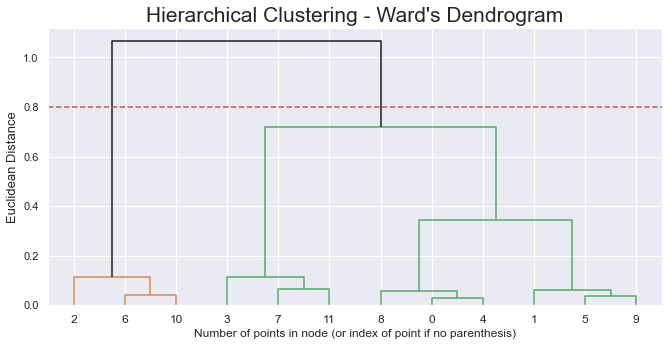

In [258]:
linkage='ward'
distance='euclidean'
counts = np.zeros(final_hclust.children_.shape[0])
n_samples = len(final_hclust.labels_)

# final_hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(final_hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack([final_hclust.children_, final_hclust.distances_, counts]).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 0.8 # where we want the dotted line
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

**Conclusion:** The ideal number of clusters should be around 4

In [259]:
# Re-running the Hierarchical clustering based on the correct number of clusters
final_hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
final_hclust_labels = final_hclust.fit_predict(df_centroids)
df_centroids['final_labels'] = final_hclust_labels

df_centroids  # centroid's cluster labels

c:\Users\maria\Documents\ANACONDA\envs\environment_dm\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AttendedClasses  \
service_usage_labels engagement_level_labels                    
0                    0                               0.001925   
                     1                               0.001673   
                     2                               0.003128   
                     3                               0.311719   
1                    0                               0.015815   
                     1                               0.013822   
                     2                               0.023778   
                     3                               0.266386   
2                    0                               0.027375   
                     1                               0.031291   
                     2                               0.033803   
                     3                               0.286763   

                                              RealNumberOfVisits  \
service_usage_labels engagement_level_labels                       
0                    0                                  0.228983   
                     1                                  0.052372   
                     2                                  0.062806   
                     3                                  0.097222   
1                    0                                  0.217992   
                     1                                  0.028215   
                     2                                  0.018587   
                     3                                  0.090796   
2                    0                                  0.235082   
                     1                                  0.037923   
                     2                                  0.028169   
                     3                                  0.086331   

                                              DaysWithoutFrequency  \
service_usage_labels engagement_level_labels                         
0                    0                                    0.020481   
                     1                                    0.042148   
                     2                                    0.523736   
                     3                                    0.015192   
1                    0                                    0.011845   
                     1                                    0.048230   
                     2                                    0.489019   
                     3                                    0.018398   
2                    0                                    0.011020   
                     1                                    0.040067   
                     2                                    0.513330   
                     3                                    0.017080   

                                              LifetimeValue  \
service_usage_labels engagement_level_labels                  
0                    0                             0.083463   
                     1                             0.052452   
                     2                             0.071583   
                     3                             0.258631   
1                    0                             0.106204   
                     1                             0.081814   
                     2                             0.144524   
                     3                             0.316642   
2                    0                             0.136558   
                     1                             0.109890   
                     2                             0.163057   
                     3                             0.378327   

                                              NumberOfFrequencies  \
service_usage_labels engagement_level_labels                        
0                    0                                   0.073847   
                     1                                   0.024654   
                     2                    

In [260]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['final_labels'].to_dict()
df_merged = df_final.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_merged['merged_labels'] = df_merged.apply(
    lambda row: cluster_mapper[
        (row['service_usage_labels'], row['engagement_level_labels'])
    ], axis=1
)

# Merged cluster centroids
df_merged.groupby('merged_labels')[metric_for_cluster].mean()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies
merged_labels,,,,,
0,0.016154,0.042929,0.512465,0.113236,0.025557
1,0.011968,0.043779,0.042783,0.073552,0.023943
2,0.286708,0.087457,0.017065,0.364861,0.111368
3,0.008925,0.229353,0.017562,0.097497,0.077114


In [261]:
metric_for_cluster_before_scale.head()

,AttendedClasses,RealNumberOfVisits,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies
ID,,,,,
10000,7,2,1,89.35,9.0
10001,1,1,60,479.20,23.0
10002,0,6,7,37.60,6.0
10003,2,3,22,155.40,20.0
10004,0,0,210,373.20,41.0


In [262]:
# Grouping the data by 'Cluster'
df_merged['LifetimeValue_no_scaled'] = LTV_before_scale

cluster_groups = df_merged.groupby('merged_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['LifetimeValue_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats




,mean,median,std,min,max
merged_labels,,,,,
0,249.568095,138.25,328.174299,29.6,1822.30
1,288.056866,162.50,333.928631,1.3,2636.77
2,307.644378,153.60,377.058845,5.4,1842.65
3,298.553189,178.60,327.003408,28.6,2502.10


In [263]:
df_merged['NF_no_scaled'] = NF_before_scale

cluster_groups = df_merged.groupby('merged_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['NF_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats

,mean,median,std,min,max
merged_labels,,,,,
0,28.071429,18.0,31.717422,1.0,179.0
1,37.411474,18.0,56.171968,1.0,655.0
2,43.530364,18.0,73.467307,1.0,643.0
3,40.185239,18.0,61.473434,1.0,719.0


In [264]:
df_merged['AC_no_scaled'] = metric_for_cluster_before_scale['AttendedClasses']

cluster_groups = df_merged.groupby('merged_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['AC_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats

,mean,median,std,min,max
merged_labels,,,,,
0,5.059524,0.0,13.518707,0.0,63.0
1,9.556622,0.0,26.611001,0.0,318.0
2,10.036145,0.0,30.286846,0.0,272.0
3,9.519481,0.0,27.523636,0.0,231.0


In [265]:
df_merged['RNV_no_scaled'] = metric_for_cluster_before_scale['RealNumberOfVisits']

cluster_groups = df_merged.groupby('merged_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['RNV_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats

,mean,median,std,min,max
merged_labels,,,,,
0,5.845238,4.0,7.121145,0.0,43.0
1,5.219358,3.0,6.006591,0.0,50.0
2,4.839357,3.0,5.946527,0.0,46.0
3,5.585859,4.0,7.015069,0.0,66.0


In [266]:
df_merged['DWF_no_scaled'] = metric_for_cluster_before_scale['DaysWithoutFrequency']

cluster_groups = df_merged.groupby('merged_labels')

# Calculating statistics for numerical features within each cluster
cluster_stats = cluster_groups['DWF_no_scaled'].agg(['mean', 'median', 'std', 'min', 'max'])
cluster_stats	

,mean,median,std,min,max
merged_labels,,,,,
0,62.440476,32.0,98.600124,0.0,621.0
1,84.686043,41.0,152.189786,0.0,1710.0
2,73.767068,42.0,115.833384,0.0,1151.0
3,78.316017,41.0,144.318299,0.0,1633.0


In [267]:
def calculate_cluster_stats(data, feature):
    cluster_groups = data.groupby('merged_labels')
    cluster_stats = cluster_groups[feature].agg(['mean', 'median', 'std', 'min', 'max'])
    return cluster_stats

# List of numerical features
numerical_features = ['LifetimeValue_no_scaled', 'NF_no_scaled', 'AC_no_scaled', 'RNV_no_scaled', 'DWF_no_scaled']

# Calculating statistics for each numerical feature within each cluster
for feature in numerical_features:
    cluster_stats = calculate_cluster_stats(df_merged, feature)
    print(f"Statistics for feature '{feature}':")
    print(cluster_stats)
    print("\n")

Statistics for feature 'LifetimeValue_no_scaled':
                     mean  median         std   min      max
merged_labels                                               
0              249.568095  138.25  328.174299  29.6  1822.30
1              288.056866  162.50  333.928631   1.3  2636.77
2              307.644378  153.60  377.058845   5.4  1842.65
3              298.553189  178.60  327.003408  28.6  2502.10


Statistics for feature 'NF_no_scaled':
                    mean  median        std  min    max
merged_labels                                          
0              28.071429    18.0  31.717422  1.0  179.0
1              37.411474    18.0  56.171968  1.0  655.0
2              43.530364    18.0  73.467307  1.0  643.0
3              40.185239    18.0  61.473434  1.0  719.0


Statistics for feature 'AC_no_scaled':
                    mean  median        std  min    max
merged_labels                                          
0               5.059524     0.0  13.518707  0.0   63.

In [268]:
df_merged=df_merged.drop(numerical_features,axis=1)

In [269]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_merged.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['service_usage_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['engagement_level_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot(index='service_usage_labels', columns='engagement_level_labels', values=0)

engagement_level_labels,0,1,2,3
service_usage_labels,,,,
2,2158,11522,275,778


## <div id="canalysis"> 5. Cluster Analysis </div>

In [270]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

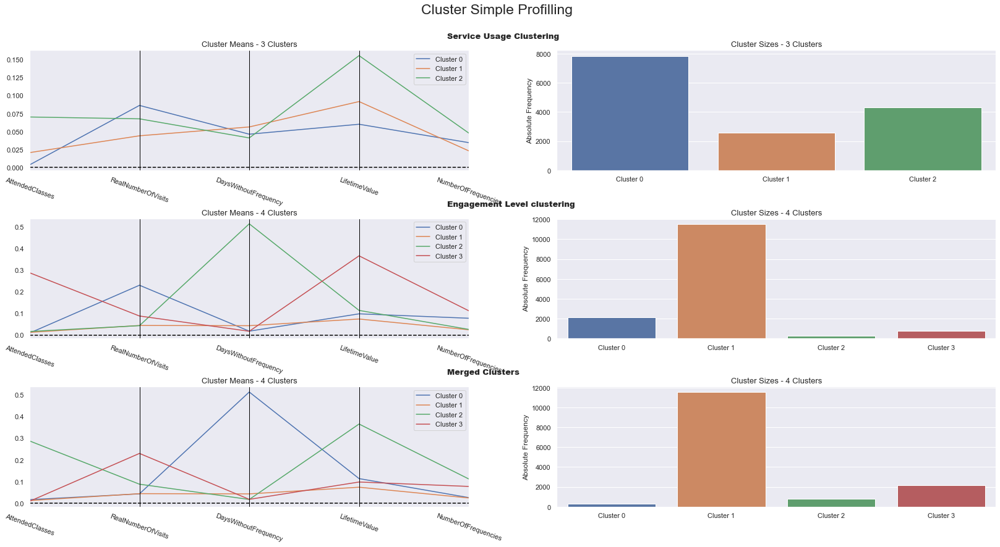

In [271]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_merged[metric_for_cluster + ['service_usage_labels', 'engagement_level_labels', 'merged_labels']],
    label_columns = ['service_usage_labels', 'engagement_level_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Service Usage Clustering", "Engagement Level clustering", "Merged Clusters"]
)

**1) Other metric Features**

In [272]:
metric_for_cluster_not_in_cluster=set(metric_features)-set(metric_for_cluster)

In [273]:
metric_for_cluster_not_in_cluster=list(metric_for_cluster_not_in_cluster)

In [274]:
metric_for_cluster_not_in_cluster

['years_as_customer', 'Age']

In [275]:
df_metric_not_in_cluster = customers_df[metric_for_cluster_not_in_cluster].reset_index(drop=True)
df_merged_metric_not_in_cluster = pd.concat([df_metric_not_in_cluster, df_merged[['merged_labels']]], axis=1)
df_merged_metric_not_in_cluster.head()

,years_as_customer,Age,merged_labels
0,0.0,0.689655,1
1,0.2,0.333333,1
2,0.0,0.264368,1
3,0.0,0.103448,1
4,0.2,0.402299,1


In [276]:
df_merged_metric_not_in_cluster.groupby('merged_labels').mean()

,years_as_customer,Age
merged_labels,,
0,0.450909,0.295632
1,0.125308,0.295748
2,0.520051,0.210812
3,0.163763,0.351933


In [277]:
df_merged['age_not_scaled'] = age_before_scale
df_merged['yasc_notscaled'] = yac_before_scale


# List of numerical features
mnc_not_scale = ['age_not_scaled', 'yasc_notscaled']

# Calculating statistics for each numerical feature within each cluster
for feature in mnc_not_scale:
    cluster_stats = calculate_cluster_stats(df_merged, feature)
    print(f"Statistics for feature '{feature}':")
    print(cluster_stats)
    print("\n")

Statistics for feature 'age_not_scaled':
                    mean  median        std  min   max
merged_labels                                         
0              29.464286    24.0  15.027241  1.0  72.0
1              26.186729    23.0  14.133986  0.0  86.0
2              26.630522    23.0  14.246676  0.0  80.0
3              26.451659    23.0  14.570817  0.0  82.0


Statistics for feature 'yasc_notscaled':
                   mean  median       std  min  max
merged_labels                                      
0              0.607143     0.0  0.931612  0.0  4.0
1              0.801481     0.0  1.089303  0.0  5.0
2              0.755020     0.0  1.121736  0.0  5.0
3              0.776335     0.0  1.011732  0.0  5.0




In [278]:
df_merged=df_merged.drop('age_not_scaled', axis=1)
df_merged=df_merged.drop('yasc_notscaled', axis=1)

**2) Non-metric Features**

In [299]:
# Grouping the data by 'Cluster'
cluster_groups = df_merged.groupby('merged_labels')

# Calculating mode for each categorical feature within each cluster
cluster_modes = cluster_groups['total_activities'].agg(lambda x: stats.mode(x)[0][0])

# Transposing the DataFrame to have features as columns and clusters as rows
cluster_modes = cluster_modes.transpose()

# Displaying mode for each categorical feature within each cluster
print(cluster_modes)

merged_labels
0    0.5
1    0.5
2    0.5
3    0.5
Name: total_activities, dtype: float64


C:\Users\maria\AppData\Local\Temp\ipykernel_12352\2411614561.py:5: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  cluster_modes = cluster_groups['total_activities'].agg(lambda x: stats.mode(x)[0][0])


In [279]:
non_metric_features.remove('total_activities')

In [297]:
df_non_metric = customers_df[non_metric_features].reset_index(drop=True)
df_merged_non_metric = pd.concat([df_non_metric, df_merged[['merged_labels']]], axis=1)
df_merged_non_metric.head()

,Dropout,FitnessActivities,WaterActivities,UseByTime,Gender,annual_subscription,new_in,other_activities,merged_labels
0,0,1.0,0.0,0,0,0,1,0,1
1,1,0.0,0.0,0,0,1,0,1,1
2,1,1.0,0.0,0,1,0,0,0,1
3,1,0.0,0.0,0,1,1,0,1,1
4,1,1.0,0.0,0,1,0,0,0,1


In [281]:
# Grouping by 'merged_labels' and calculating the mean (which represents the percentage of 1s)
cluster_percentages_1 = df_merged_non_metric.groupby('merged_labels').mean()*100
cluster_percentages_1

,Dropout,FitnessActivities,WaterActivities,UseByTime,Gender,annual_subscription,new_in,other_activities
merged_labels,,,,,,,,
0,70.181818,57.090909,25.818182,0.000000,43.636364,47.272727,0.000000,32.000000
1,85.124110,58.444714,26.722791,4.651970,38.621767,36.113522,6.787016,21.957993
2,38.431877,10.668380,84.575835,2.442159,43.059126,27.763496,0.000000,15.424165
3,71.408712,73.308619,22.520853,8.063021,46.987952,37.303058,11.260426,13.855422


In [282]:
# Taking 1 - mean to get the percentage of 0s
cluster_percentages_0 = 100 - cluster_percentages_1

In [283]:
cluster_percentages_0

,Dropout,FitnessActivities,WaterActivities,UseByTime,Gender,annual_subscription,new_in,other_activities
merged_labels,,,,,,,,
0,29.818182,42.909091,74.181818,100.000000,56.363636,52.727273,100.000000,68.000000
1,14.875890,41.555286,73.277209,95.348030,61.378233,63.886478,93.212984,78.042007
2,61.568123,89.331620,15.424165,97.557841,56.940874,72.236504,100.000000,84.575835
3,28.591288,26.691381,77.479147,91.936979,53.012048,62.696942,88.739574,86.144578


## <div id="cvisualization">6. Cluster Visualization </div>

### <div id="tsne">6.1 t-SNE </div>

In [284]:
two_dim = TSNE(random_state=42, perplexity=30).fit_transform(df_merged[final_features])

In [285]:
colors = ["white", "blue", "red", "green"]
# Create list of labels
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']

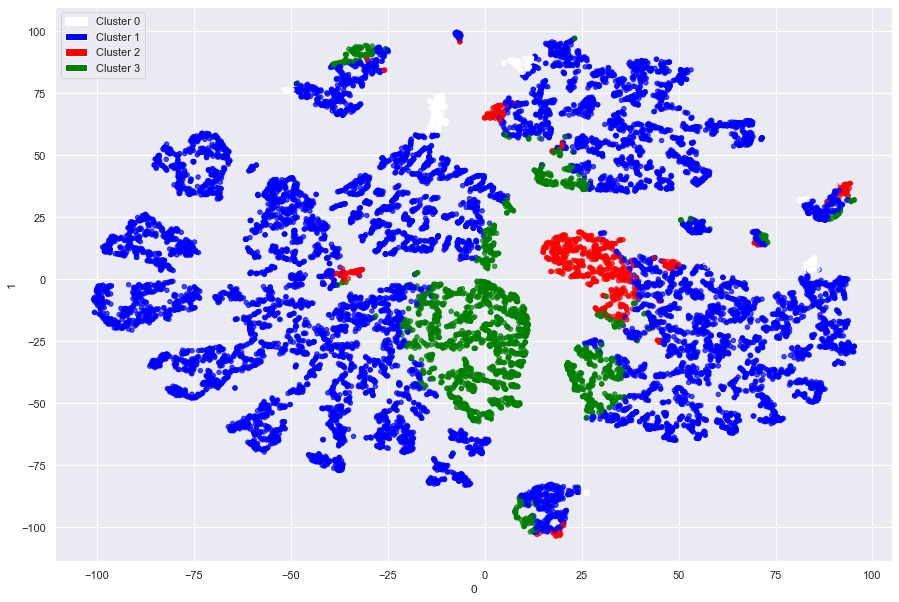

In [291]:
# Map the values in the merged_labels column to the corresponding colors
color_map = df_merged['merged_labels'].map(lambda x: colors[x])

pd.DataFrame(two_dim).plot.scatter(x=0, y=1, color=color_map, figsize=(15,10), alpha=0.7)

# Create list of Patch objects
legend_elements = [Patch(facecolor=color, label=label) for color, label in zip(colors, labels)]

# Add the legend to the plot
plt.legend(handles=legend_elements, loc='upper left')
plt.show()

## <div id="fimportance"> 7. Feature Importance </div>

In [292]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [293]:
r2_variables(df_merged[list(final_features) + ['merged_labels']], 'merged_labels').drop('merged_labels')

WaterActivities         0.084003
FitnessActivities       0.062753
total_activities        0.002451
other_activities        0.007300
LifetimeValue           0.353203
NumberOfFrequencies     0.191057
AttendedClasses         0.687694
RealNumberOfVisits      0.582390
DaysWithoutFrequency    0.624941
dtype: float64

In [294]:
# Preparing the data
X = df_merged.drop(columns=['service_usage_labels','engagement_level_labels','merged_labels'])
y = df_merged['merged_labels']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=1, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 99.02% of the customers correctly


In [295]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

WaterActivities         0.000000
FitnessActivities       0.000000
total_activities        0.000000
other_activities        0.000000
LifetimeValue           0.000000
NumberOfFrequencies     0.000000
AttendedClasses         0.257680
RealNumberOfVisits      0.639257
DaysWithoutFrequency    0.103062
dtype: float64

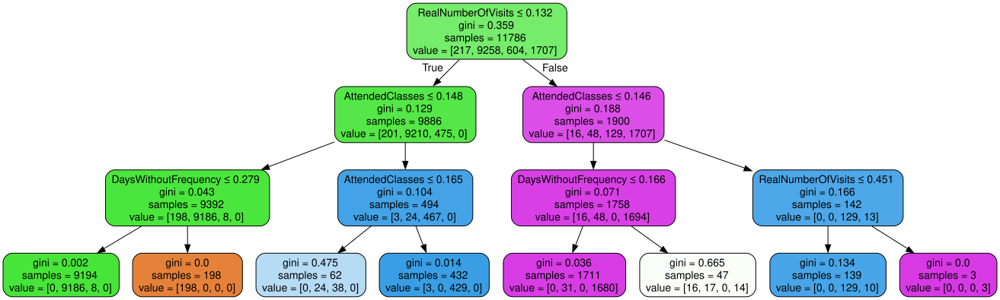

In [296]:
# Visualizing the decision tree
dot_data = export_graphviz(dt, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
graphviz.Source(dot_data)